In [1]:
import os
os.chdir('/data/l989o/deployed/a')
import sys
if '/data/l989o/a' in sys.path:
    sys.path.remove('/data/l989o/a')    

# Studing patients

## Computing fractions

In [2]:
import scanpy as sc
import anndata as ad
import numpy as np
import matplotlib.pyplot as plt
import os
import h5py
import pickle
import pandas as pd
from data import file_path
from tqdm.notebook import tqdm

True
<KeysViewHDF5 ['count', 'maximum', 'mean', 'sum', 'variance']>


In [3]:
from data import TransformedMeanDataset
ds0 = TransformedMeanDataset('train')
n = 0
for x in ds0:
    n += len(x)
print(n)

ds1 = TransformedMeanDataset('validation')
v = 0
for x in ds1:
    v += len(x)
print(v)
print(n + v)

449434
220218
669652


In [4]:
class Quantities:
    def __init__(self):
        self.phenographs = dict()
        self.adata = dict()
        self.num_phenograph_classes = dict()
        self.all_fractions = dict()
        self.omes = dict()

q = Quantities()
        
for method in ['raw', 'transformed', 'vae_mu']:
    f = file_path(f'umap_{method}.adata')
    a = ad.read(f)
    print(a)
    a = a[:n].copy()
    print(a)

    index_info_omes, index_info_begins, index_info_ends = pickle.load(open(file_path('merged_cells_info.pickle'), 'rb'))
    print(index_info_ends[-1])

    l = []
    b = file_path(f'phenograph_{method}.hdf5')
    with h5py.File(b, 'r') as f:
        for i, o in enumerate(index_info_omes):
            phenograph = f[o]['phenograph'][...].reshape((-1, 1))
            assert len(phenograph) == index_info_ends[i] - index_info_begins[i]
            l.append(phenograph)
    phenographs = np.concatenate(l, axis=0)
    phenographs.shape
    q.phenographs[method] = phenographs

    s = pd.Series(phenographs.flatten(), dtype='category')
    print(s)
    s.index = a.obs.index

    a.obs['phenograph'] = s
    display(a.obs)
    q.adata[method] = a

    # sc.pl.umap(a, color='phenograph')

    num_phenograph_classes = np.max(phenographs) + 1
    q.num_phenograph_classes[method] = num_phenograph_classes
    print(num_phenograph_classes)
    a = len(set(phenographs.flatten().tolist()))
    assert num_phenograph_classes == a, a

    phenograph_fractions = dict()
    with h5py.File(b, 'r') as f:
        q.omes[method] = list(f.keys())
        for i, o in tqdm(enumerate(index_info_omes), desc='computing fractions'):
            phenograph = f[o]['phenograph'][...].reshape((-1, 1))
            assert len(phenograph) == index_info_ends[i] - index_info_begins[i]
            fractions = np.zeros((num_phenograph_classes))
            for p in phenograph.flatten():
                fractions[p] += 1
            fractions /= np.sum(fractions)
            phenograph_fractions[o] = fractions.reshape((1, -1))
    print(len(phenograph_fractions))
    all_fractions = np.concatenate(list(phenograph_fractions.values()), axis=0)
    print(all_fractions.shape)
    q.all_fractions[method] = all_fractions

AnnData object with n_obs × n_vars = 669652 × 39
    uns: 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'
AnnData object with n_obs × n_vars = 449434 × 39
    uns: 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'
449434
0          6
1          3
2          3
3          1
4         22
          ..
449429    19
449430    12
449431     3
449432     2
449433    19
Length: 449434, dtype: category
Categories (58, int64): [0, 1, 2, 3, ..., 54, 55, 56, 57]


,phenograph
0,6
1,3
2,3
3,1
4,22
...,...
449429,19
449430,12
449431,3
449432,2


58



226
(226, 58)
AnnData object with n_obs × n_vars = 669652 × 39
    uns: 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'
AnnData object with n_obs × n_vars = 449434 × 39
    uns: 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'
449434
0         0
1         0
2         0
3         0
4         0
         ..
449429    1
449430    8
449431    3
449432    3
449433    1
Length: 449434, dtype: category
Categories (78, int64): [0, 1, 2, 3, ..., 74, 75, 76, 77]


,phenograph
0,0
1,0
2,0
3,0
4,0
...,...
449429,1
449430,8
449431,3
449432,3


78



226
(226, 78)
AnnData object with n_obs × n_vars = 669652 × 5
    uns: 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'
AnnData object with n_obs × n_vars = 449434 × 5
    uns: 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'
449434
0         16
1         16
2         19
3         17
4          6
          ..
449429    12
449430     6
449431    22
449432    20
449433    11
Length: 449434, dtype: category
Categories (30, int64): [0, 1, 2, 3, ..., 26, 27, 28, 29]


,phenograph
0,16
1,16
2,19
3,17
4,6
...,...
449429,12
449430,6
449431,22
449432,20


30



226
(226, 30)


In [5]:
q.fractions_u = dict()
q.dbscan_labels = dict()

for method in ['raw', 'transformed', 'vae_mu']:
    print('-' * 100)
    print('method =', method)
    from umap import UMAP
    reducer = UMAP(2, verbose=True)
    u = reducer.fit_transform(q.all_fractions[method])
    q.fractions_u[method] = u

    from sklearn.cluster import DBSCAN
    clustering = DBSCAN(eps=1, min_samples=2).fit(u)
    print(clustering.labels_)
    print(clustering)
    q.dbscan_labels[method] = clustering.labels_

    print(type(clustering.labels_))
    print(clustering.labels_.shape)

----------------------------------------------------------------------------------------------------
method = raw
UMAP(n_neighbors=2, verbose=True)
Construct fuzzy simplicial set
Wed Feb  3 15:55:42 2021 Finding Nearest Neighbors
Wed Feb  3 15:55:43 2021 Finished Nearest Neighbor Search
Wed Feb  3 15:55:44 2021 Construct embedding
	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Wed Feb  3 15:55:46 2021 Finished embedding
[ 0  1  2  3  4  4  5  6  7  8  4  9  4 10 11 12 13  1 14  4 15 10 16 17
  8 16 18 19  4  9 13 20 21 20 22 21  4 17 17 23 24 15 14 16 11 18 25  9
 11  4  4 24  3 15 26 16 27  9 28 29 30  1 28 30 26 23 10 18 28 18  0 18
  9 18 23 22 10 26 16  8  6  7 31 12 32  3 32  6 21 33 12 34 31  7 30 12
 33  6 32 17 14 31 31 35

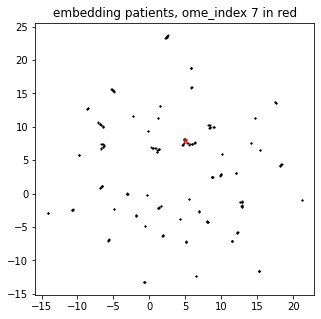

In [6]:
for method in ['vae_mu']:
    labels = q.dbscan_labels[method]
    u = q.fractions_u[method]
    plt.figure(figsize=(5, 5))
    colors = np.random.random((1000, 3))[labels]
    plt.scatter(u[:, 0], u[:, 1], c='k', s=1)
    plt.scatter(u[7, 0], u[7, 1], c='r', s=20, marker='*')
    ax = plt.gca()
    texts = list(map(str, labels))    
#     for i in range(len(u)):
#         ax.annotate(texts[i], (u[i, 0], u[i, 1]), color=colors[i])
    # plt.text(u[:, 0], u[:, 1], texts, color=colors)
    plt.title(f'embedding patients, ome_index 7 in red')
    plt.show()

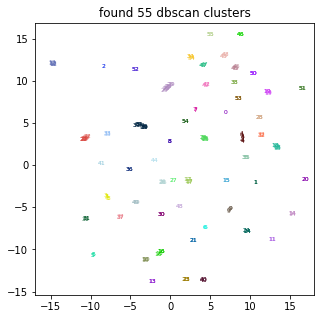

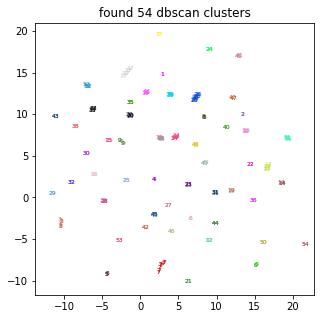

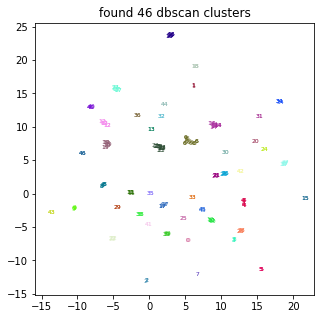

In [7]:
for method in ['raw', 'transformed', 'vae_mu']:
    labels = q.dbscan_labels[method]
    u = q.fractions_u[method]
    plt.figure(figsize=(5, 5))
    colors = np.random.random((1000, 3))[labels]
    plt.scatter(u[:, 0], u[:, 1], c=colors, alpha=0)
    ax = plt.gca()
    texts = list(map(str, labels))    
    for i in range(len(u)):
        ax.annotate(texts[i], (u[i, 0], u[i, 1]), color=colors[i], fontsize=6)
    # plt.text(u[:, 0], u[:, 1], texts, color=colors)
    plt.title(f'found {max(labels)} dbscan clusters')
    plt.show()

In [8]:
jitter = (np.random.rand(len(u)) - 0.5) / 25

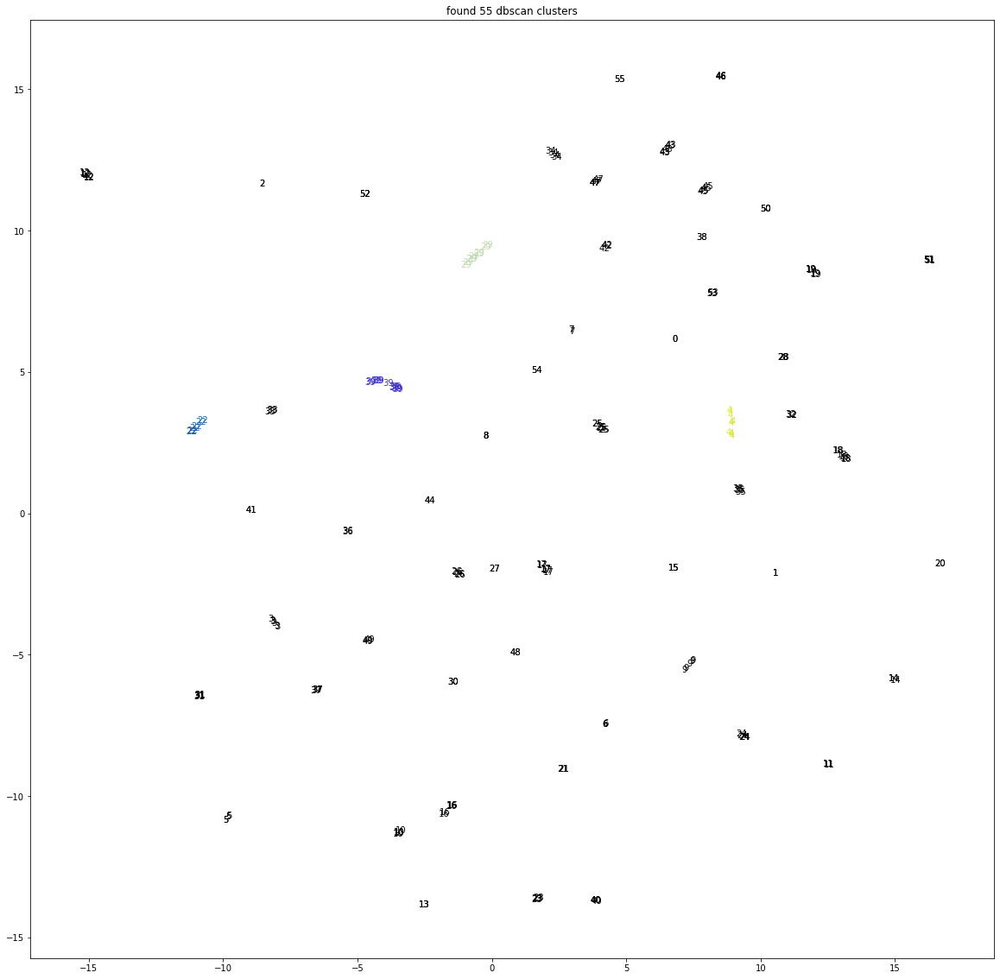

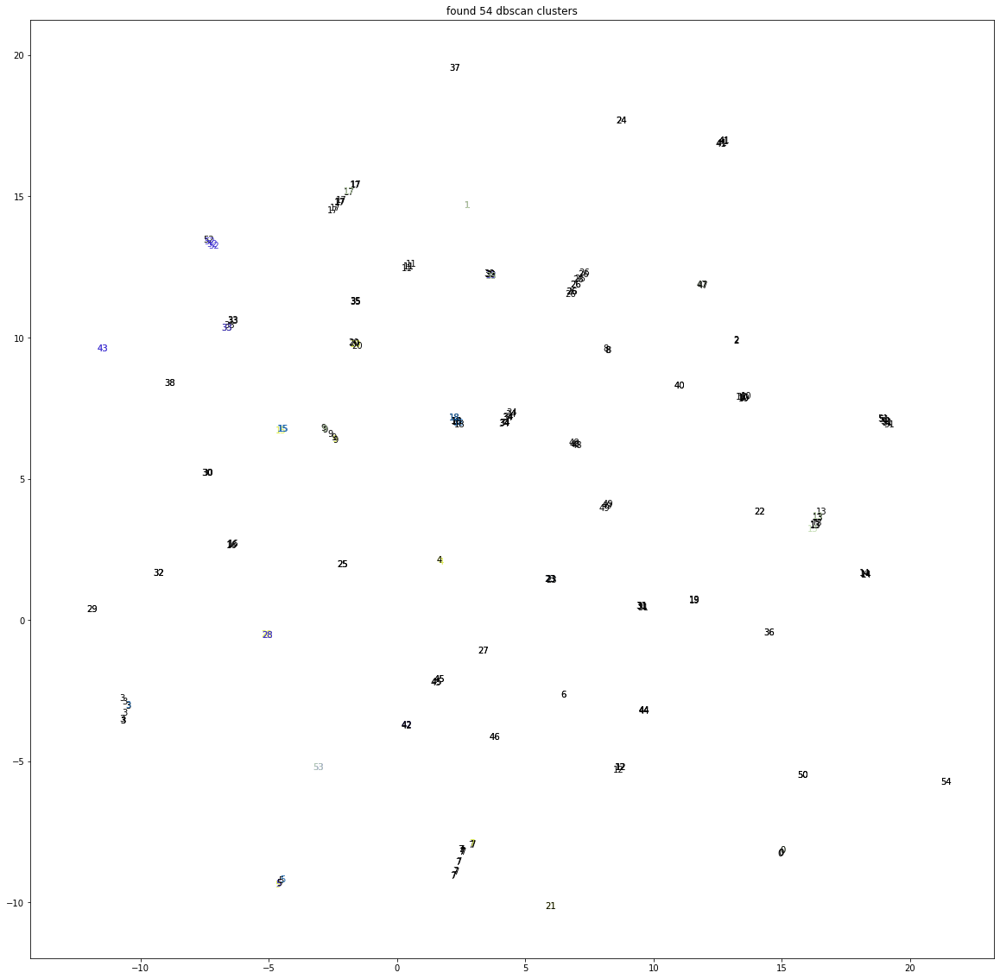

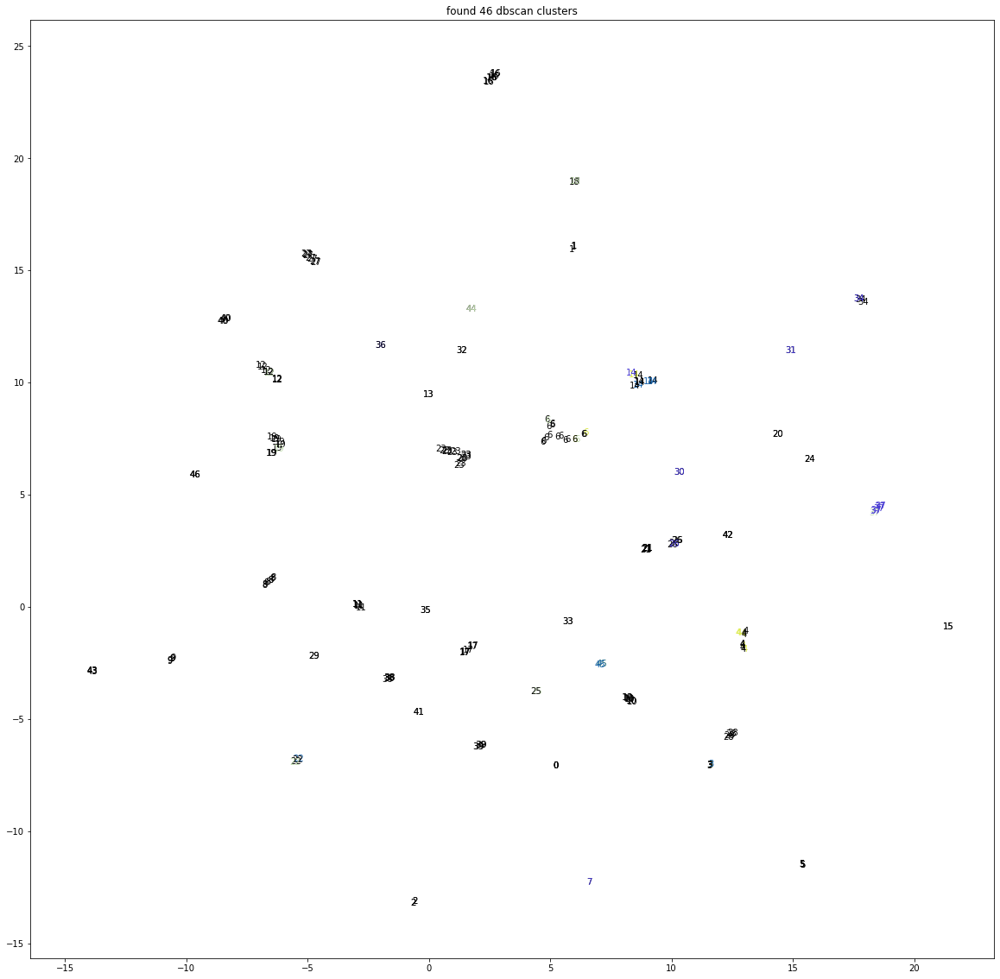

In [9]:
import numpy as np
random_colors = np.random.rand(4, 3)
hot_indices = [39, 4, 29, 22]
patients_per_hot_index = dict()
for h in hot_indices:
    l = np.where(q.dbscan_labels['raw'] == h)[0]
    patients_per_hot_index[h] = l

for method in ['raw', 'transformed', 'vae_mu']:
    labels = q.dbscan_labels[method]
    u = q.fractions_u[method]
    plt.figure(figsize=(20, 20))
    colors = np.tile([0., 0., 0.], (len(labels), 1))
    hot_indices = [39, 4, 29, 22]
    for color, index in zip(random_colors, hot_indices):
#         matches = np.where(labels == index)
#         print(len(matches[0]))
#         colors[matches, :] = color
        colors[patients_per_hot_index[index], :] = color
#     jitter = (np.random.rand(len(u)) - 0.5) / 25
    jitter_x = jitter * (np.max(u[:, 0]) - np.min(u[:, 0]))
    jitter_y = jitter * (np.max(u[:, 1]) - np.min(u[:, 1]))
    plt.scatter(u[:, 0] + jitter_x, u[:, 1] + jitter_y, c=colors, alpha=0)
    plt.scatter(u[:, 0], u[:, 1], c=colors, alpha=0)
    ax = plt.gca()
    texts = list(map(str, labels))    
    for i in range(len(u)):
        ax.annotate(texts[i], (u[i, 0], u[i, 1]), color=colors[i])
    # plt.text(u[:, 0], u[:, 1], texts, color=colors)
    plt.title(f'found {max(labels)} dbscan clusters')
    plt.show()

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55]), array([ 2,  3,  2,  6, 10,  4,  4,  3,  3,  5,  4,  3,  6,  3,  4,  3,  5,
        6,  6,  5,  2,  3,  7,  4,  5,  7,  4,  2,  3,  9,  3,  4,  3,  3,
        4,  4,  2,  4,  2, 12,  4,  2,  3,  5,  2,  4,  4,  5,  2,  3,  4,
        4,  3,  3,  2,  2]))
(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54]), array([ 5,  2,  3,  9,  3,  5,  2, 15,  3,  8,  5,  4,  4,  8,  4,  3,  3,
       10,  7,  3,  4,  2,  2,  5,  3,  3,  9,  2,  4,  2,  3,  4,  3,  5,
        7,  3,  2,  2,  2,  6,  2,  4,  3,  2,  4,  4,  2,  3,  3,  3,  3,
        6,  4, 

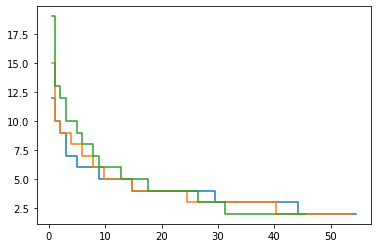

In [10]:
plt.figure()
methods = ['raw', 'transformed', 'vae_mu']
for method in methods:
    a = q.dbscan_labels[method]
    print(np.unique(a, return_counts=True))
    h, bin_edges = np.histogram(a, max(a) + 1)
    bin_centers = 0.5*(bin_edges[1:] + bin_edges[:-1])
    h = [-a for a in sorted(-h)]
    plt.step(bin_centers, h, where='mid')
#     s = sorted(bins)
#     plt.bar(mids, s)
plt.show()

## Matching BDSCAN clusters

----------------------------------------------------------------------------------------------------
score: 0.10572371543764972


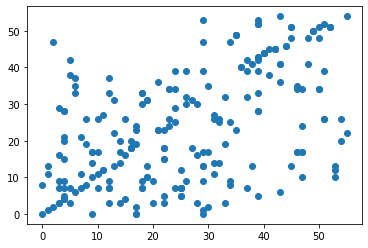

[(0, 39), (0, 39), (0, 39), (0, 39), (0, 39), (0, 39), (0, 39), (0, 39), (0, 39), (0, 39), (0, 39), (0, 39), (1, 4), (1, 4), (1, 4), (1, 4), (1, 4), (1, 4), (1, 4), (1, 4), (1, 4), (1, 4), (2, 29), (2, 29), (2, 29), (2, 29), (2, 29), (2, 29), (2, 29), (2, 29), (2, 29), (3, 22), (3, 22), (3, 22), (3, 22), (3, 22), (3, 22), (3, 22), (4, 25), (4, 25), (4, 25), (4, 25), (4, 25), (4, 25), (4, 25), (5, 3), (5, 3), (5, 3), (5, 3), (5, 3), (5, 3), (6, 12), (6, 12), (6, 12), (6, 12), (6, 12), (6, 12), (7, 17), (7, 17), (7, 17), (7, 17), (7, 17), (7, 17), (8, 18), (8, 18), (8, 18), (8, 18), (8, 18), (8, 18), (9, 9), (9, 9), (9, 9), (9, 9), (9, 9), (10, 16), (10, 16), (10, 16), (10, 16), (10, 16), (11, 19), (11, 19), (11, 19), (11, 19), (11, 19), (12, 24), (12, 24), (12, 24), (12, 24), (12, 24), (13, 43), (13, 43), (13, 43), (13, 43), (13, 43), (14, 47), (14, 47), (14, 47), (14, 47), (14, 47), (15, 5), (15, 5), (15, 5), (15, 5), (16, 6), (16, 6), (16, 6), (16, 6), (17, 10), (17, 10), (17, 10), (1

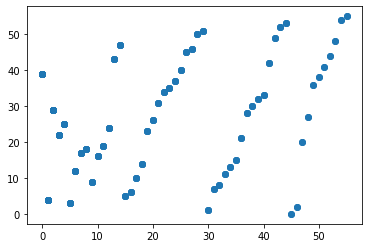

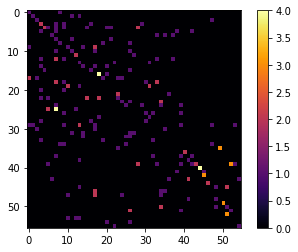

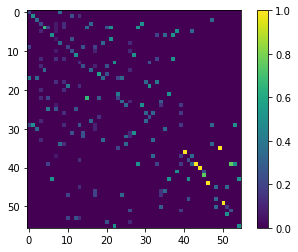

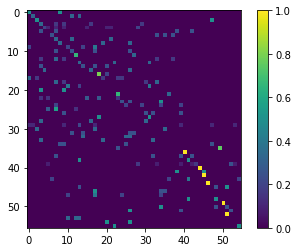

----------------------------------------------------------------------------------------------------
score: 0.17162192099917203


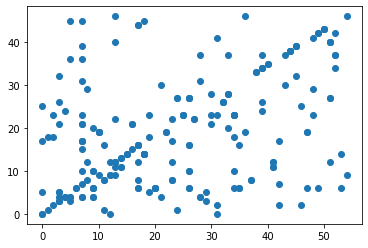

[(0, 7), (0, 7), (0, 7), (0, 7), (0, 7), (0, 7), (0, 7), (0, 7), (0, 7), (0, 7), (0, 7), (0, 7), (0, 7), (0, 7), (0, 7), (1, 17), (1, 17), (1, 17), (1, 17), (1, 17), (1, 17), (1, 17), (1, 17), (1, 17), (1, 17), (2, 3), (2, 3), (2, 3), (2, 3), (2, 3), (2, 3), (2, 3), (2, 3), (2, 3), (3, 26), (3, 26), (3, 26), (3, 26), (3, 26), (3, 26), (3, 26), (3, 26), (3, 26), (4, 9), (4, 9), (4, 9), (4, 9), (4, 9), (4, 9), (4, 9), (4, 9), (5, 13), (5, 13), (5, 13), (5, 13), (5, 13), (5, 13), (5, 13), (5, 13), (6, 18), (6, 18), (6, 18), (6, 18), (6, 18), (6, 18), (6, 18), (7, 34), (7, 34), (7, 34), (7, 34), (7, 34), (7, 34), (7, 34), (8, 39), (8, 39), (8, 39), (8, 39), (8, 39), (8, 39), (9, 51), (9, 51), (9, 51), (9, 51), (9, 51), (9, 51), (10, 0), (10, 0), (10, 0), (10, 0), (10, 0), (11, 5), (11, 5), (11, 5), (11, 5), (11, 5), (12, 10), (12, 10), (12, 10), (12, 10), (12, 10), (13, 23), (13, 23), (13, 23), (13, 23), (13, 23), (14, 33), (14, 33), (14, 33), (14, 33), (14, 33), (15, 11), (15, 11), (15, 1

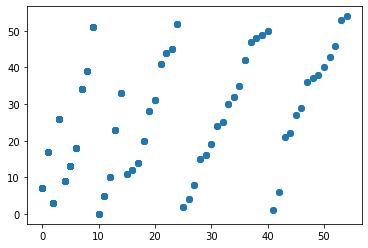

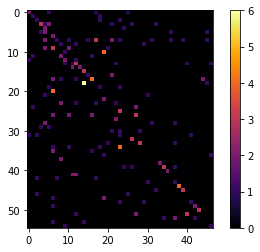

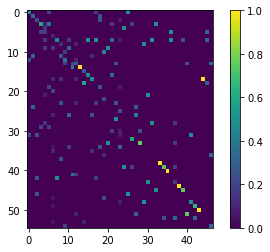

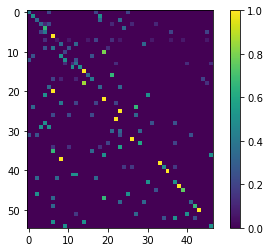

----------------------------------------------------------------------------------------------------
score: 0.0950633901220943


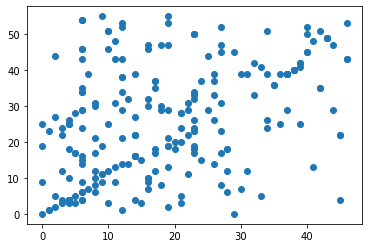

[(0, 6), (0, 6), (0, 6), (0, 6), (0, 6), (0, 6), (0, 6), (0, 6), (0, 6), (0, 6), (0, 6), (0, 6), (0, 6), (0, 6), (0, 6), (0, 6), (0, 6), (0, 6), (0, 6), (1, 23), (1, 23), (1, 23), (1, 23), (1, 23), (1, 23), (1, 23), (1, 23), (1, 23), (1, 23), (1, 23), (1, 23), (1, 23), (2, 4), (2, 4), (2, 4), (2, 4), (2, 4), (2, 4), (2, 4), (2, 4), (2, 4), (2, 4), (2, 4), (2, 4), (3, 12), (3, 12), (3, 12), (3, 12), (3, 12), (3, 12), (3, 12), (3, 12), (3, 12), (3, 12), (4, 14), (4, 14), (4, 14), (4, 14), (4, 14), (4, 14), (4, 14), (4, 14), (4, 14), (4, 14), (5, 19), (5, 19), (5, 19), (5, 19), (5, 19), (5, 19), (5, 19), (5, 19), (5, 19), (6, 8), (6, 8), (6, 8), (6, 8), (6, 8), (6, 8), (6, 8), (6, 8), (7, 16), (7, 16), (7, 16), (7, 16), (7, 16), (7, 16), (7, 16), (7, 16), (8, 27), (8, 27), (8, 27), (8, 27), (8, 27), (8, 27), (8, 27), (9, 10), (9, 10), (9, 10), (9, 10), (9, 10), (9, 10), (10, 17), (10, 17), (10, 17), (10, 17), (10, 17), (10, 17), (11, 21), (11, 21), (11, 21), (11, 21), (11, 21), (11, 21), 

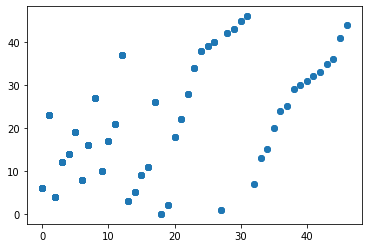

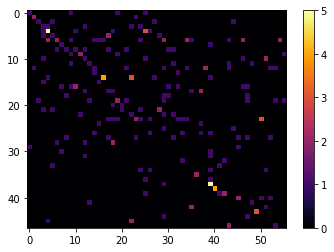

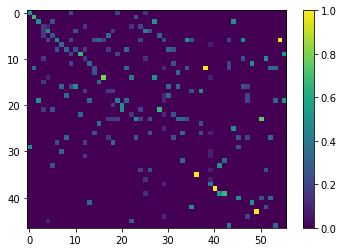

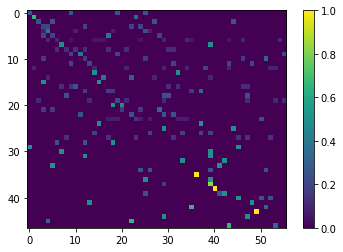

array([[1., 0., 0., ..., 0., 0., 0.],
       [0., 2., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.]])

In [11]:
from sklearn.metrics import adjusted_rand_score
from operator import itemgetter

def get_m(method0, method1):
    print('-' * 100)
    n0 = max(q.dbscan_labels[method0]) + 1
    n1 = max(q.dbscan_labels[method1]) + 1    
    labels0 = q.dbscan_labels[method0]
    labels1 = q.dbscan_labels[method1]
    print('score:', adjusted_rand_score(labels0, labels1))
    plt.figure()
    plt.scatter(q.dbscan_labels[method0], q.dbscan_labels[method1])
    plt.show()
    
    counts0 = dict(zip(*np.unique(labels0, return_counts=True)))
    indices, sorted_labels0 = zip(*sorted(enumerate(labels0), key=lambda x: (-counts0[x[1]], x[1])))
#     print(sorted_labels0)
    
    seen = set()
    no_duplicates = [x for x in sorted_labels0 if not (x in seen or seen.add(x))]
    l = list(range(max(seen) + 1))
    assert len(l) == len(no_duplicates)
    my_map = zip(l, no_duplicates)
    relabeled0 = [no_duplicates.index(i) for i in sorted_labels0]
#     print(relabeled0)
    s = adjusted_rand_score(sorted_labels0, relabeled0)
    assert np.isclose(s, 1.), s
    
    sorted_labels1 = [labels1[i] for i in indices]
#     print(sorted_labels1)
    
    seen = set()
    no_duplicates = [x for x in sorted_labels1 if not (x in seen or seen.add(x))]
    l = list(range(max(seen) + 1))
    assert len(l) == len(no_duplicates)
    my_map = zip(l, no_duplicates)
    relabeled1 = [no_duplicates.index(i) for i in sorted_labels1]
#     print(relabeled0)
    s = adjusted_rand_score(sorted_labels1, relabeled1)
    assert np.isclose(s, 1.), s
#     counts1 = dict(zip(*np.unique(labels1, return_counts=True)))
#     sorted_labels1  = sorted(labels1, key=lambda x: (-counts1[x], x))
    
    plt.figure()
    print(list(zip(relabeled0, sorted_labels0)))
    print(list(zip(relabeled1, sorted_labels1)))
    plt.scatter(relabeled0, sorted_labels0)
    plt.show()
    
    m = np.zeros((n0, n1))
    for a, b in zip(labels0, labels1):
#     for a, b in zip(relabeled0, relabeled1):
        m[a, b] += 1
        
    m_rows = m.copy()
    m_cols = m.copy()
    m_rows = m_rows / np.sum(m_rows, axis=0, keepdims=True)
    m_cols = m_cols / np.sum(m_cols, axis=1, keepdims=True)
    
    plt.figure()
    plt.imshow(m, cmap='inferno')
    plt.colorbar()
    plt.show()
    
    plt.figure()
    plt.imshow(m_rows)
    plt.colorbar()
    plt.show()
    
    plt.figure()
    plt.imshow(m_cols)
    plt.colorbar()
    plt.show()
    return m

get_m('raw', 'transformed')
get_m('transformed', 'vae_mu')
get_m('vae_mu', 'raw')

# Metadata

## Coloring by cohort

In [12]:
from metadata import get_metadata
df = get_metadata()
display(df)
print(df['Subtype'].value_counts())

discarding 153 omes from the Basel cohort, remaining: 223
discarding 153 omes from the Zurich cohort, remaning: 229
clearing metadata
flattening PTNM_T labels
flattening PTNM_N labels
metadata cleaned


,FileName_FullStack,merged_pid,diseasestatus,PrimarySite,Subtype,clinical_type,Height_FullStack,Width_FullStack,area,sum_area_cells,Count_Cells,PTNM_T,PTNM_N,PTNM_M,DFSmonth,OSmonth,images_per_patient,images_per_patient_filtered,cohort
2,BaselTMA_SP41_15.475kx12.665ky_10000x8500_5_20...,166,tumor,breast,PR-ER-,TripleNeg,723,749,541527,356411,3068,T2,pN0,M0,35.0,37.0,1,1,basel
3,BaselTMA_SP41_25.475kx12.665ky_8000x8500_3_201...,238,tumor,breast,PR+ER+,HR+HER2-,840,712,598080,286198,3173,T1,pN2,M0,140.0,233.0,2,2,basel
4,BaselTMA_SP41_25.475kx12.665ky_8000x8500_3_201...,238,non-tumor,breast,PR+ER+,HR+HER2-,765,689,527085,193119,2121,T1,pN2,M0,140.0,233.0,2,2,basel
6,BaselTMA_SP41_25.475kx12.665ky_8000x8500_3_201...,68,tumor,breast,PR+ER+,HR+HER2-,689,688,474032,218846,2262,T1,pN2,M0,169.0,169.0,2,1,basel
7,BaselTMA_SP41_15.475kx12.665ky_10000x8500_5_20...,72,tumor,breast,PR-ER+,HR+HER2-,716,737,527692,289717,2740,T1,pN0,pM1,186.0,186.0,2,1,basel
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
350,ZTMA208_slide_13.25kx14.95ky_7000x7000_8_20171...,308,tumor,breast,PR+ER+,NaN,492,514,252888,243839,3674,TX,pNX,pM1,NaN,NaN,6,4,zurich
354,ZTMA208_slide_28.23kx22.4ky_7000x7000_5_201711...,301,tumor,breast,PR+ER+,NaN,503,475,238925,98597,1256,T3,pN1,pM1,NaN,NaN,6,4,zurich
355,ZTMA208_slide_28.23kx22.4ky_7000x7000_5_201711...,301,tumor,breast,PR+ER+,NaN,450,541,243450,102638,1227,T3,pN1,pM1,NaN,NaN,6,4,zurich
356,ZTMA208_slide_28.23kx22.4ky_7000x7000_5_201711...,301,tumor,breast,PR+ER+,NaN,464,519,240816,123359,1580,T3,pN1,pM1,NaN,NaN,6,4,zurich


PR+ER+    304
PR-ER-     68
PR-ER+     66
PR+ER-      9
Name: Subtype, dtype: int64


In [13]:
cohort_info = df.loc[df['FileName_FullStack'].isin(q.omes['raw']), 'cohort'].apply(lambda x: 0 if x == 'basel' else 1).to_numpy()
def f(x):
    assert type(x) == float and np.isnan(x) or x in ['PR+ER+', 'PR-ER-', 'PR-ER+', 'PR+ER-'], x
    if x == 'PR+ER+':
        return 0
    if x == 'PR-ER-':
        return 1
    if x == 'PR-ER+':
        return 2
    if x == 'PR+ER-':
        return 3
    if type(x) == float and np.isnan(x):
        return 4
    assert False
tumor_info = df.loc[df['FileName_FullStack'].isin(q.omes['raw']), 'Subtype'].apply(f).to_numpy()
print(cohort_info.shape)
print(tumor_info.shape)

(226,)
(226,)


12
10
9
7


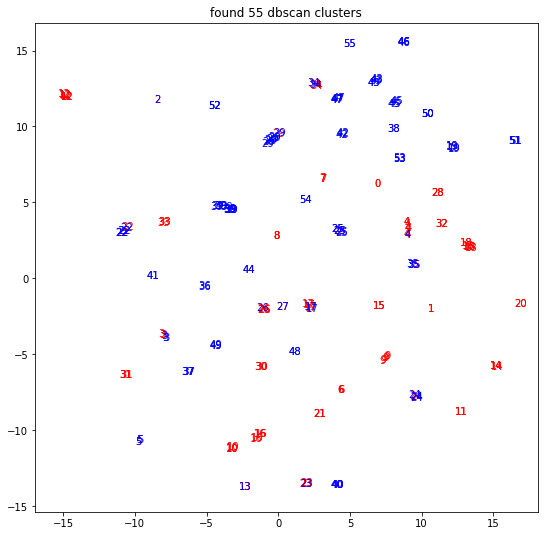

6
3
2
2


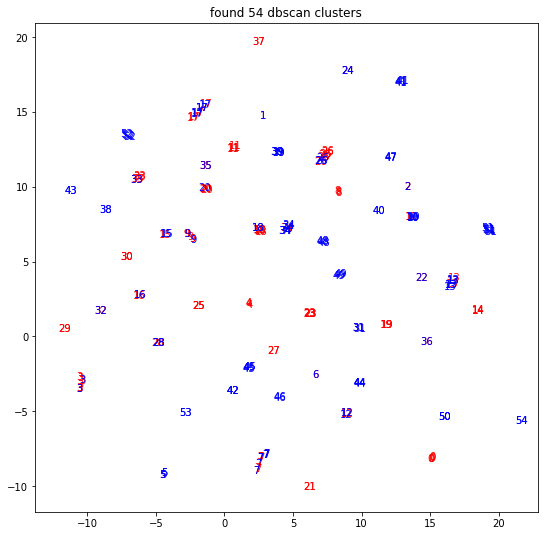

4
12
2
4


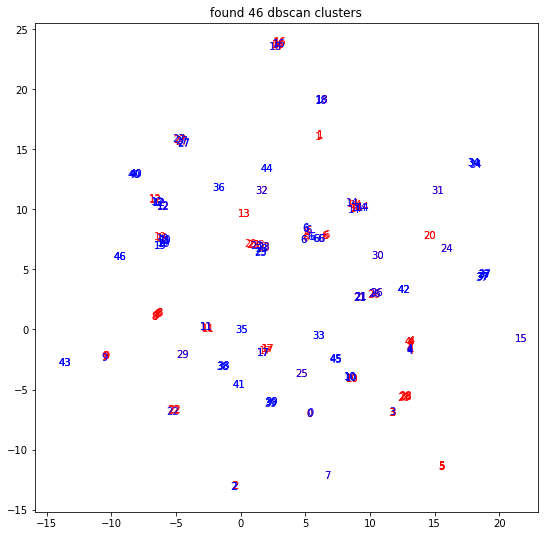

In [14]:
random_colors = np.random.rand(4, 3)

for method in ['raw', 'transformed', 'vae_mu']:
    labels = q.dbscan_labels[method]
    u = q.fractions_u[method]
    plt.figure(figsize=(9, 9))
    colors = np.tile([0., 0., 0.], (len(labels), 1))
    two_colors = np.array([[1., 0., 0.], [0., 0., 1.]])
    hot_indices = [39, 4, 29, 22]
    for color, index in zip(random_colors, hot_indices):
        matches = np.where(labels == index)
        print(len(matches[0]))
        colors[matches, :] = color
    plt.scatter(u[:, 0], u[:, 1], c=cohort_info, alpha=0)
    ax = plt.gca()
    texts = list(map(str, labels))    
    cohort_colors = two_colors[cohort_info, :]
    for i in range(len(u)):
        ax.annotate(texts[i], (u[i, 0], u[i, 1]), color=cohort_colors[i, :])
    # plt.text(u[:, 0], u[:, 1], texts, color=colors)
    plt.title(f'found {max(labels)} dbscan clusters')
    plt.show()

## Coloring by cancer type

12
10
9
7


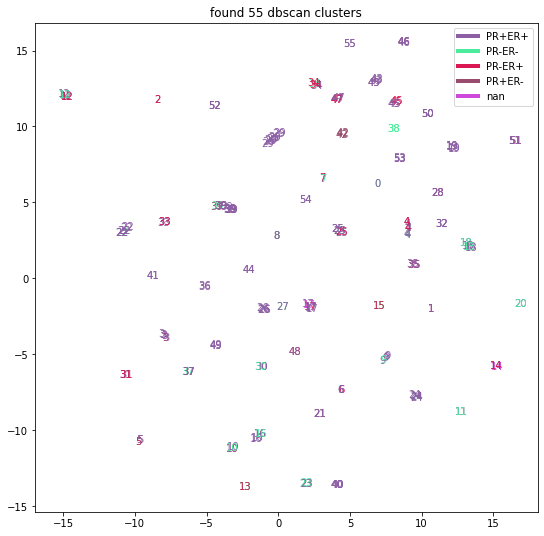

6
3
2
2


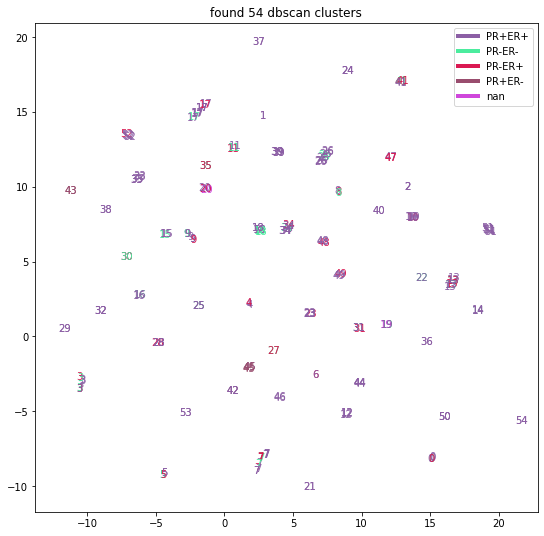

4
12
2
4


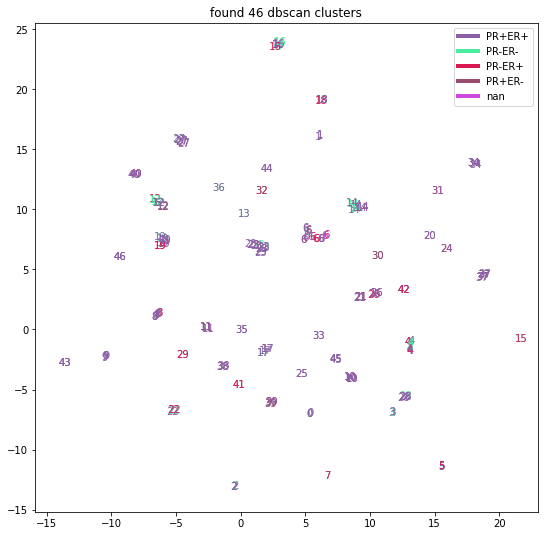

In [15]:
random_colors = np.random.rand(5, 3)

for method in ['raw', 'transformed', 'vae_mu']:
    labels = q.dbscan_labels[method]
    u = q.fractions_u[method]
    plt.figure(figsize=(9, 9))
    colors = np.tile([0., 0., 0.], (len(labels), 1))
    hot_indices = [39, 4, 29, 22]
    for color, index in zip(random_colors, hot_indices):
        matches = np.where(labels == index)
        print(len(matches[0]))
        colors[matches, :] = color
    plt.scatter(u[:, 0], u[:, 1], alpha=0)
    ax = plt.gca()
    texts = list(map(str, labels))    
    cohort_colors = random_colors[tumor_info, :]
    for i in range(len(u)):
        ax.annotate(texts[i], (u[i, 0], u[i, 1]), color=cohort_colors[i, :])
    # plt.text(u[:, 0], u[:, 1], texts, color=colors)
    plt.title(f'found {max(labels)} dbscan clusters')
    from matplotlib.lines import Line2D
    custom_lines = [Line2D([0], [0], color=random_colors[i], lw=4) for i in range(5)]
    ax.legend(custom_lines, ['PR+ER+', 'PR-ER-', 'PR-ER+', 'PR+ER-', 'nan'])
    plt.show()

## Coloring by patient

In [16]:
df

,FileName_FullStack,merged_pid,diseasestatus,PrimarySite,Subtype,clinical_type,Height_FullStack,Width_FullStack,area,sum_area_cells,Count_Cells,PTNM_T,PTNM_N,PTNM_M,DFSmonth,OSmonth,images_per_patient,images_per_patient_filtered,cohort
2,BaselTMA_SP41_15.475kx12.665ky_10000x8500_5_20...,166,tumor,breast,PR-ER-,TripleNeg,723,749,541527,356411,3068,T2,pN0,M0,35.0,37.0,1,1,basel
3,BaselTMA_SP41_25.475kx12.665ky_8000x8500_3_201...,238,tumor,breast,PR+ER+,HR+HER2-,840,712,598080,286198,3173,T1,pN2,M0,140.0,233.0,2,2,basel
4,BaselTMA_SP41_25.475kx12.665ky_8000x8500_3_201...,238,non-tumor,breast,PR+ER+,HR+HER2-,765,689,527085,193119,2121,T1,pN2,M0,140.0,233.0,2,2,basel
6,BaselTMA_SP41_25.475kx12.665ky_8000x8500_3_201...,68,tumor,breast,PR+ER+,HR+HER2-,689,688,474032,218846,2262,T1,pN2,M0,169.0,169.0,2,1,basel
7,BaselTMA_SP41_15.475kx12.665ky_10000x8500_5_20...,72,tumor,breast,PR-ER+,HR+HER2-,716,737,527692,289717,2740,T1,pN0,pM1,186.0,186.0,2,1,basel
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
350,ZTMA208_slide_13.25kx14.95ky_7000x7000_8_20171...,308,tumor,breast,PR+ER+,NaN,492,514,252888,243839,3674,TX,pNX,pM1,NaN,NaN,6,4,zurich
354,ZTMA208_slide_28.23kx22.4ky_7000x7000_5_201711...,301,tumor,breast,PR+ER+,NaN,503,475,238925,98597,1256,T3,pN1,pM1,NaN,NaN,6,4,zurich
355,ZTMA208_slide_28.23kx22.4ky_7000x7000_5_201711...,301,tumor,breast,PR+ER+,NaN,450,541,243450,102638,1227,T3,pN1,pM1,NaN,NaN,6,4,zurich
356,ZTMA208_slide_28.23kx22.4ky_7000x7000_5_201711...,301,tumor,breast,PR+ER+,NaN,464,519,240816,123359,1580,T3,pN1,pM1,NaN,NaN,6,4,zurich


In [17]:
patient_of_origin = df.loc[df['FileName_FullStack'].isin(q.omes['raw']), 'merged_pid'].to_numpy()
patient_of_origin

array([166, 238, 238, 206, 206, 280, 220,  24,  24, 284, 100, 177, 282,
        45, 211, 239, 227, 234,  33,  39,  61,  44, 159,  38, 114, 268,
       256,  55,  60,  40,  14,   2, 112, 129, 203, 101,  41, 255, 249,
       215,  36,  84, 105,   6,  51, 120, 253, 253, 251, 217,  70,  10,
       264,  54, 188,  74, 192, 189, 154, 183, 130, 109, 174, 232, 148,
        81, 279, 229, 258,   5, 223,  73, 182, 198, 164, 121,  12, 162,
        87,   1, 233, 243, 278, 278,  34, 144, 180, 260, 260, 119, 201,
        67,  75,  23, 272, 200, 242, 207,  26, 140, 195, 252, 213,  95,
        19, 170, 209,  50,  77, 110, 291, 297, 297, 297, 297, 343, 343,
       344, 344, 344, 344, 335, 335, 335, 340, 340, 340, 340, 340, 357,
       357, 357, 357, 311, 311, 311, 311, 293, 293, 293, 309, 309, 309,
       309, 309, 338, 338, 338, 338, 348, 348, 290, 290, 290, 290, 303,
       303, 303, 303, 313, 313, 313, 339, 339, 339, 339, 322, 322, 322,
       286, 286, 287, 287, 287, 326, 326, 326, 315, 337, 337, 33

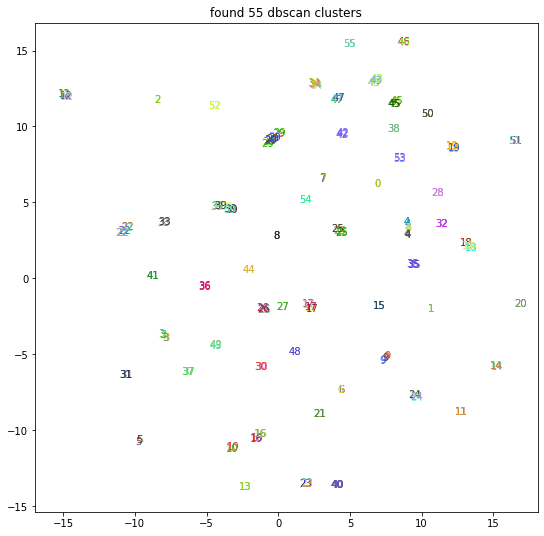

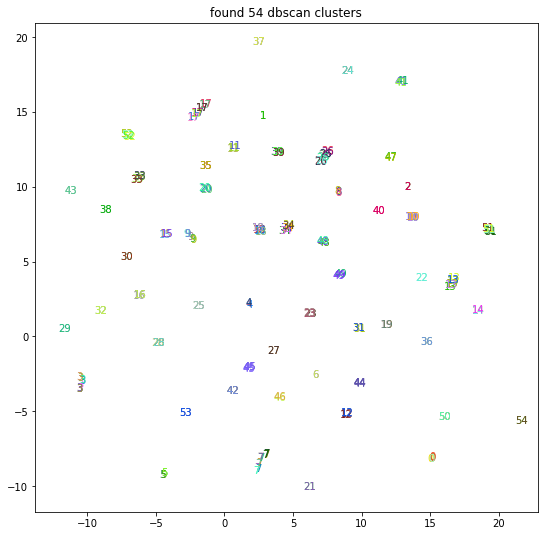

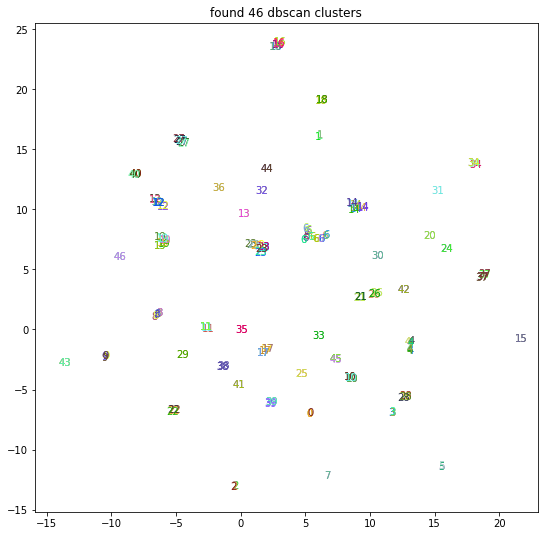

In [18]:
random_colors = np.random.rand(1000, 3)

for method in ['raw', 'transformed', 'vae_mu']:
    labels = q.dbscan_labels[method]
    u = q.fractions_u[method]
    plt.figure(figsize=(9, 9))
    plt.scatter(u[:, 0], u[:, 1], alpha=0)
    ax = plt.gca()
    texts = list(map(str, labels))    
    cohort_colors = random_colors[patient_of_origin, :]
    for i in range(len(u)):
        ax.annotate(texts[i], (u[i, 0], u[i, 1]), color=cohort_colors[i, :])
    # plt.text(u[:, 0], u[:, 1], texts, color=colors)
    plt.title(f'found {max(labels)} dbscan clusters')
    plt.show()

----------------------------------------------------------------------------------------------------
score: 0.092772546107969


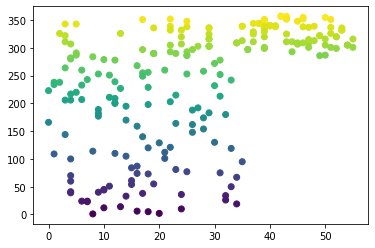

(120, 121, 122, 123, 145, 179, 188, 189, 212, 218, 219, 224, 4, 5, 10, 12, 19, 28, 36, 49, 50, 182, 59, 155, 156, 157, 199, 200, 202, 214, 215, 34, 75, 139, 163, 193, 207, 208, 46, 108, 137, 148, 149, 170, 171, 3, 52, 85, 116, 135, 166, 15, 83, 90, 95, 106, 109, 23, 37, 38, 99, 112, 220, 26, 45, 67, 69, 71, 73, 11, 29, 47, 57, 72, 22, 25, 43, 55, 78, 27, 151, 152, 153, 203, 40, 51, 181, 186, 209, 132, 134, 195, 196, 198, 144, 159, 177, 178, 225, 6, 110, 115, 172, 7, 80, 87, 97, 13, 21, 66, 76, 18, 42, 100, 105, 39, 65, 74, 154, 54, 64, 77, 111, 82, 92, 101, 102, 91, 104, 140, 141, 103, 160, 164, 165, 117, 133, 197, 213, 124, 125, 126, 127, 142, 150, 183, 184, 143, 147, 191, 194, 173, 192, 204, 216, 176, 180, 221, 222, 1, 17, 61, 8, 81, 93, 9, 24, 79, 14, 44, 48, 16, 30, 175, 20, 41, 53, 32, 35, 88, 58, 62, 68, 60, 63, 94, 84, 86, 98, 89, 96, 107, 129, 130, 131, 167, 168, 169, 185, 187, 190, 201, 210, 211, 0, 70, 2, 174, 31, 33, 56, 158, 113, 114, 118, 119, 128, 146, 136, 138, 161, 162,

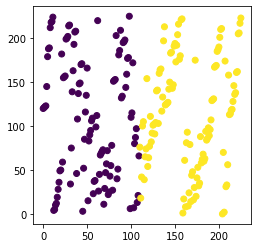

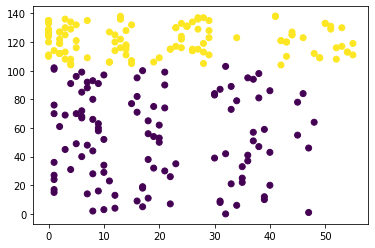

In [19]:
from sklearn.metrics import adjusted_rand_score
from operator import itemgetter

def get_m_patients(method0):
    print('-' * 100)
    n0 = max(q.dbscan_labels[method0]) + 1
    labels0 = q.dbscan_labels[method0]
    print('score:', adjusted_rand_score(labels0, patient_of_origin))
    plt.figure()
    plt.scatter(q.dbscan_labels[method0], patient_of_origin, c=patient_of_origin)
    plt.show()
    
    counts0 = dict(zip(*np.unique(labels0, return_counts=True)))
    indices, sorted_labels0 = zip(*sorted(enumerate(labels0), key=lambda x: (-counts0[x[1]], x[1])))
#     print(sorted_labels0)
    
    seen = set()
    no_duplicates = [x for x in sorted_labels0 if not (x in seen or seen.add(x))]
    l = list(range(max(seen) + 1))
    assert len(l) == len(no_duplicates)
    my_map = zip(l, no_duplicates)
    relabeled0 = [no_duplicates.index(i) for i in sorted_labels0]
#     print(relabeled0)
    s = adjusted_rand_score(sorted_labels0, relabeled0)
    assert np.isclose(s, 1.), s
    
#     print(labels0)
#     print(sorted_labels0)
#     print(relabeled0)
    print(indices)
    plt.figure()
    plt.scatter(np.arange(len(indices)), indices, c=cohort_info)
    ax = plt.gca()
    ax.set_aspect('equal')
    plt.show()
    sorted_patient_of_origin = [patient_of_origin[i] for i in indices]

    make_indices_adjacent = dict(zip(sorted(list(set(sorted_patient_of_origin))), list(range(len(set(sorted_patient_of_origin))))))
    
    plt.figure()
    plt.scatter(relabeled0, [make_indices_adjacent[s] for s in sorted_patient_of_origin], c=[cohort_info[i] for i in indices])
    plt.show()
    return

    m = np.zeros((n0, len(make_indices_adjacent)))
    for a, b in zip(relabeled0, sorted_patient_of_origin):
#     for a, b in zip(relabeled0, relabeled1):
        m[a, make_indices_adjacent[b]] += 1
        
    m_rows = m.copy()
    m_cols = m.copy()
    m_rows = m_rows / np.sum(m_rows, axis=0, keepdims=True)
    m_cols = m_cols / np.sum(m_cols, axis=1, keepdims=True)

    plt.figure(figsize=(20, 9))
    plt.imshow(m, cmap='inferno')
    plt.colorbar()
    plt.show()
    
    plt.figure(figsize=(20, 9))
    plt.imshow(m_rows)
    plt.colorbar()
    plt.show()
    
    plt.figure(figsize=(20, 9))
    plt.imshow(m_cols)
    plt.colorbar()
    plt.show()
    return m

get_m_patients('raw')
# get_m_patients('transformed')
# get_m_patients('vae_mu')

----------------------------------------------------------------------------------------------------
score: 0.092772546107969


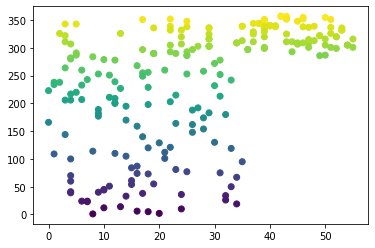

226
226
226
139
226


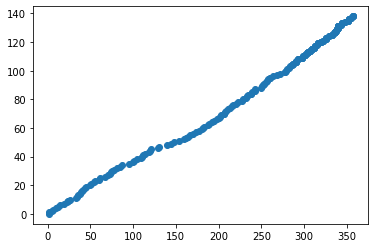

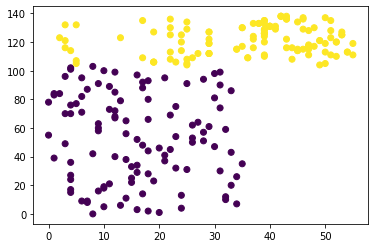

226
226


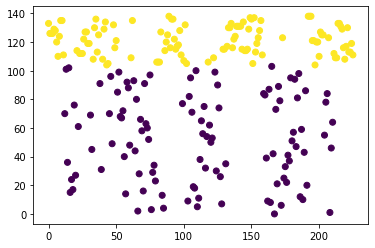

In [20]:
from sklearn.metrics import adjusted_rand_score
from operator import itemgetter

method0 = 'raw'
print('-' * 100)
n0 = max(q.dbscan_labels[method0]) + 1
labels0 = q.dbscan_labels[method0]
print('score:', adjusted_rand_score(labels0, patient_of_origin))
plt.figure()
plt.scatter(q.dbscan_labels[method0], patient_of_origin, c=patient_of_origin)
plt.show()

counts0 = dict(zip(*np.unique(labels0, return_counts=True)))
indices, sorted_labels0 = zip(*sorted(enumerate(labels0), key=lambda x: (-counts0[x[1]], x[1])))
print(len(sorted_labels0))
print(len(cohort_info))
print(len(patient_of_origin))
make_indices_adjacent = dict(zip(sorted(list(set(patient_of_origin))), list(range(len(set(patient_of_origin))))))
print(len(make_indices_adjacent))
patient_of_origin_adjacent = [make_indices_adjacent[p] for p in patient_of_origin]
print(len(patient_of_origin_adjacent))
plt.figure()
plt.scatter(patient_of_origin, patient_of_origin_adjacent)
plt.show()

plt.figure()
plt.scatter(q.dbscan_labels[method0], patient_of_origin_adjacent, c=cohort_info)
plt.show()

sorted_patient_of_origin_adjacent = [patient_of_origin_adjacent[i] for i in indices]
sorted_cohort_info = [cohort_info[i] for i in indices]
print(len(sorted_patient_of_origin_adjacent))
print(len(sorted_cohort_info))
plt.figure()
plt.scatter(np.arange(len(sorted_patient_of_origin_adjacent)), sorted_patient_of_origin_adjacent, c=sorted_cohort_info)
plt.show()

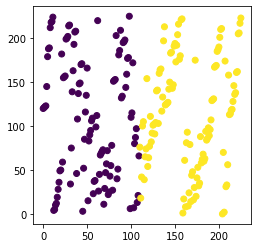

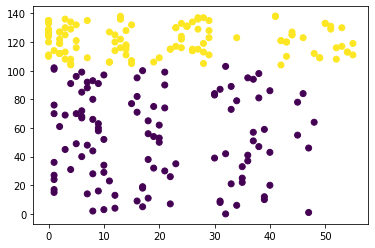

In [21]:
seen = set()
no_duplicates = [x for x in sorted_labels0 if not (x in seen or seen.add(x))]
l = list(range(max(seen) + 1))
assert len(l) == len(no_duplicates)
my_map = zip(l, no_duplicates)
relabeled0 = [no_duplicates.index(i) for i in sorted_labels0]
#     print(relabeled0)
s = adjusted_rand_score(sorted_labels0, relabeled0)
assert np.isclose(s, 1.), s

#     print(labels0)
#     print(sorted_labels0)
#     print(relabeled0)

plt.figure()
plt.scatter(np.arange(len(indices)), indices, c=cohort_info)
ax = plt.gca()
ax.set_aspect('equal')
plt.show()

plt.figure()
plt.scatter(relabeled0, sorted_patient_of_origin_adjacent, c=sorted_cohort_info)
plt.show()

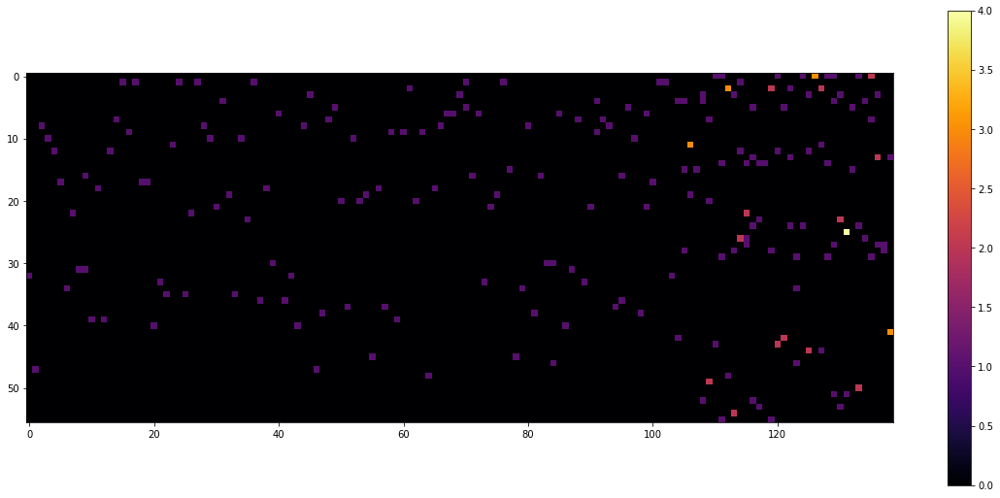

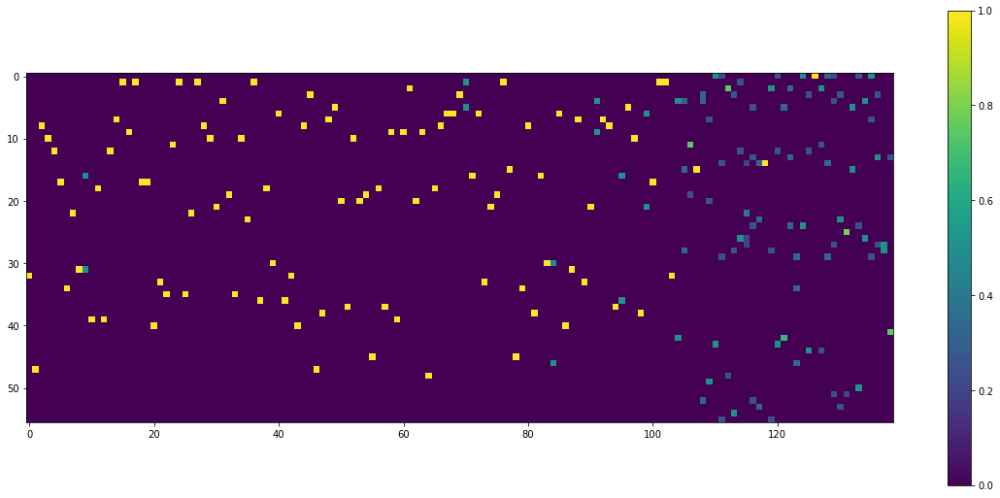

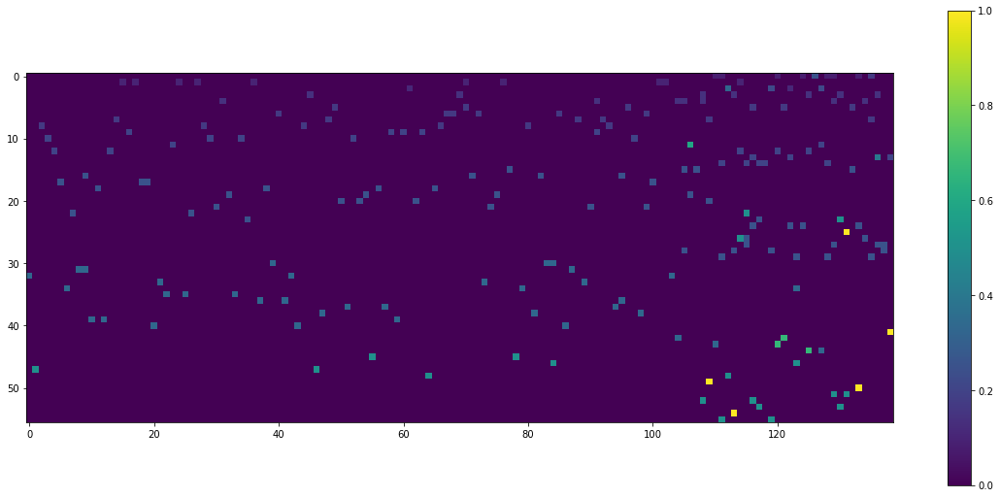

In [22]:
m = np.zeros((n0, len(make_indices_adjacent)))
for a, b in zip(relabeled0, sorted_patient_of_origin_adjacent):
#     for a, b in zip(relabeled0, relabeled1):
    m[a, b] += 1

m_rows = m.copy()
m_cols = m.copy()
m_rows = m_rows / np.sum(m_rows, axis=0, keepdims=True)
m_cols = m_cols / np.sum(m_cols, axis=1, keepdims=True)

plt.figure(figsize=(20, 9))
plt.imshow(m, cmap='inferno')
plt.colorbar()
plt.show()

plt.figure(figsize=(20, 9))
plt.imshow(m_rows)
plt.colorbar()
plt.show()

plt.figure(figsize=(20, 9))
plt.imshow(m_cols)
plt.colorbar()
plt.show()

## Looking at the DBSCAN clusters that are more numerous in raw data

In [23]:
df

,FileName_FullStack,merged_pid,diseasestatus,PrimarySite,Subtype,clinical_type,Height_FullStack,Width_FullStack,area,sum_area_cells,Count_Cells,PTNM_T,PTNM_N,PTNM_M,DFSmonth,OSmonth,images_per_patient,images_per_patient_filtered,cohort
2,BaselTMA_SP41_15.475kx12.665ky_10000x8500_5_20...,166,tumor,breast,PR-ER-,TripleNeg,723,749,541527,356411,3068,T2,pN0,M0,35.0,37.0,1,1,basel
3,BaselTMA_SP41_25.475kx12.665ky_8000x8500_3_201...,238,tumor,breast,PR+ER+,HR+HER2-,840,712,598080,286198,3173,T1,pN2,M0,140.0,233.0,2,2,basel
4,BaselTMA_SP41_25.475kx12.665ky_8000x8500_3_201...,238,non-tumor,breast,PR+ER+,HR+HER2-,765,689,527085,193119,2121,T1,pN2,M0,140.0,233.0,2,2,basel
6,BaselTMA_SP41_25.475kx12.665ky_8000x8500_3_201...,68,tumor,breast,PR+ER+,HR+HER2-,689,688,474032,218846,2262,T1,pN2,M0,169.0,169.0,2,1,basel
7,BaselTMA_SP41_15.475kx12.665ky_10000x8500_5_20...,72,tumor,breast,PR-ER+,HR+HER2-,716,737,527692,289717,2740,T1,pN0,pM1,186.0,186.0,2,1,basel
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
350,ZTMA208_slide_13.25kx14.95ky_7000x7000_8_20171...,308,tumor,breast,PR+ER+,NaN,492,514,252888,243839,3674,TX,pNX,pM1,NaN,NaN,6,4,zurich
354,ZTMA208_slide_28.23kx22.4ky_7000x7000_5_201711...,301,tumor,breast,PR+ER+,NaN,503,475,238925,98597,1256,T3,pN1,pM1,NaN,NaN,6,4,zurich
355,ZTMA208_slide_28.23kx22.4ky_7000x7000_5_201711...,301,tumor,breast,PR+ER+,NaN,450,541,243450,102638,1227,T3,pN1,pM1,NaN,NaN,6,4,zurich
356,ZTMA208_slide_28.23kx22.4ky_7000x7000_5_201711...,301,tumor,breast,PR+ER+,NaN,464,519,240816,123359,1580,T3,pN1,pM1,NaN,NaN,6,4,zurich


In [24]:
import torch

def get_filtered_labels_mapping(ome_index, ome_filename, split):
    import pickle
    f = os.path.join('data/spatial_uzh_processed/a', f'ok_cells_{split}.npy')
    d = pickle.load(open(f, 'rb'))
    list_of_cells = d['list_of_cells']
    list_of_ome_filenames = d['list_of_ome_filenames']
    list_of_ome_indices = d['list_of_ome_indices']
    list_of_cell_ids = d['list_of_cell_ids']
    cell_is_ok = d['cell_is_ok']
    begin = list_of_ome_filenames.index(ome_filename)
    end = len(list_of_ome_filenames) - list_of_ome_filenames[::-1].index(ome_filename)
    # print(list_of_ome_filenames[begin])
    # print(list_of_ome_filenames[end - 1])
    # print(list_of_ome_filenames[end])
    # print(list_of_ome_filenames[end + 1])
    oks = cell_is_ok[begin: end]
    # labels = list_of_cell_ids[begin: end]
    # print(oks.shape)
    # print(t.shape)
    l0 = np.array(list(range(np.sum(oks).item())))
    l1 = list_of_cell_ids[ome_index][oks]
    assert len(l0) == len(l1)
    d = dict(zip(l0, l1))
    return d

In [25]:
# STEP 1: get all the expression values
from data import RawMeanDataset, TransformedMeanDataset, MasksDataset
index_info_omes, index_info_begins, index_info_ends = pickle.load(open(file_path('merged_cells_info.pickle'), 'rb'))

expressions = dict()
for method in methods:
    if method == 'raw':
        ds = RawMeanDataset('train')
        l = []
        for x in tqdm(ds, 'merging raw expresions'):
            l.append(x.numpy())
        expressions[method] = np.concatenate(l, axis=0)
    elif method == 'transformed':
        ds = TransformedMeanDataset('train')
        l = []
        for x in tqdm(ds, 'merging transformed expresions'):
            l.append(x.numpy())
        expressions[method] = np.concatenate(l, axis=0)
    elif method == 'vae_mu':
        f = os.path.join(file_path('vae_transformed_mean_dataset_LR_VB_S_0.0014685885989200848__3.8608662714605464e-08__False'), 'embedding_train.hdf5')
        with h5py.File(f, 'r') as f5:
            assert len(f5.keys()) == 1
            k, v = f5.items().__iter__().__next__()
            raw_ds = RawMeanDataset('train')
            o_train = raw_ds.filenames                
            original_list = []
            mu_list = []
            log_var_list = []
            for i, o in enumerate(tqdm(o_train, desc='accessing latent space')):
                original = raw_ds[i].clone().detach().numpy()
                mu = v[o]['mu'][...]
                log_var = v[o]['log_var'][...]
                assert mu.shape == log_var.shape
                assert len(original) == len(mu)
                original_list.append(original)
                mu_list.append(mu)
                log_var_list.append(log_var)
            expressions[method] = np.concatenate(mu_list, axis=0)
    else:
        raise ValueError()
        

In [26]:
# STEP 2: compute the PCA, affine transform into [0, 1]
from sklearn.decomposition import PCA
pca = dict()
for method in methods:
    reducer = PCA(n_components=3)
    pca[method] = reducer.fit_transform(expressions[method])
    a = np.min(pca[method], axis=0)
    b = np.max(pca[method], axis=0)
    pca[method] = (pca[method] - a) / (b - a)

In [27]:
# STEP 4: in the loop below replace the mess with selecting from the PCA of everything
# STEP 5: fix the plotting function to plot the right things    

In [28]:
from pprint import pprint

q.top = dict()

for method in methods:
    labels = q.dbscan_labels[method]
    counts = dict(zip(*np.unique(labels, return_counts=True)))
    indices, sorted_labels = zip(*sorted(enumerate(labels), key=lambda x: (-counts[x[1]], x[1])))
#     print(sorted_labels)
    top_full = sorted(zip(*np.unique(labels, return_counts=True)), key=lambda x: -x[1])
    top = [t[0] for t in top_full]
    q.top[method] = top
    print(top[:3])

[39, 4, 29]
[7, 17, 3]
[6, 23, 4]


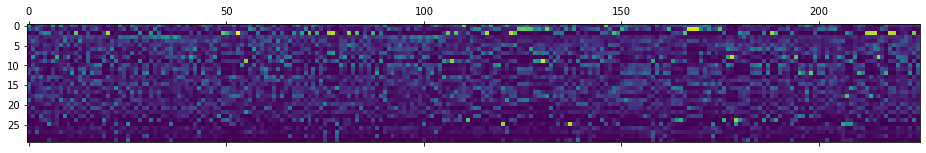

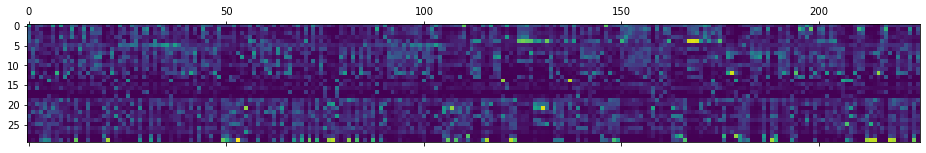

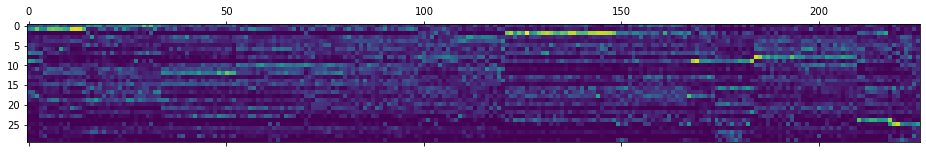

In [29]:
m = q.all_fractions[method].T
plt.matshow(m)
import scipy
import scipy.cluster.hierarchy as sch
# vector of pairwise distances
d = sch.distance.pdist(m)
L = sch.linkage(d, method='complete')
ind = sch.fcluster(L, 0.5*d.max(), 'distance')
ind
ii, cc = zip(*sorted(zip(range(len(ind)), ind), key=lambda x: x[1]))
ii = np.array(ii)
plt.matshow(m[ii, :])

m = m.T
d = sch.distance.pdist(m)
L = sch.linkage(d, method='complete')
ind = sch.fcluster(L, 0.5*d.max(), 'distance')
ind
ii, cc = zip(*sorted(zip(range(len(ind)), ind), key=lambda x: x[1]))
ii = np.array(ii)

plt.matshow(m[ii, :].T)

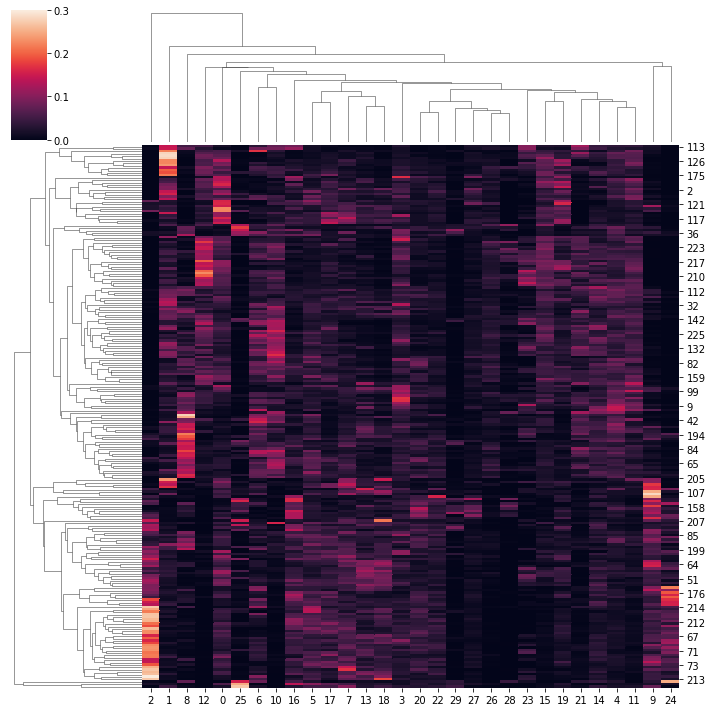

In [30]:
import seaborn as sns
df = pd.DataFrame(m)
a = sns.clustermap(df)

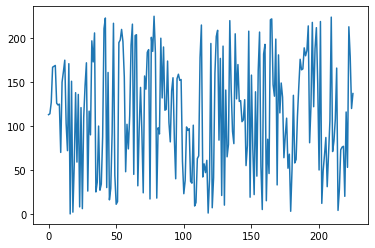

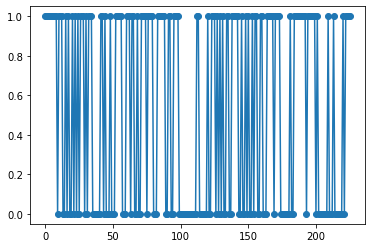

In [31]:
b = a.data2d.index.to_numpy()
i = np.arange(len(b))
plt.plot(i, b)
plt.show()
plt.plot(i, cohort_info[b[i]], '-o')
plt.show()

# UMAPs

vae_mu
(449434, 5)


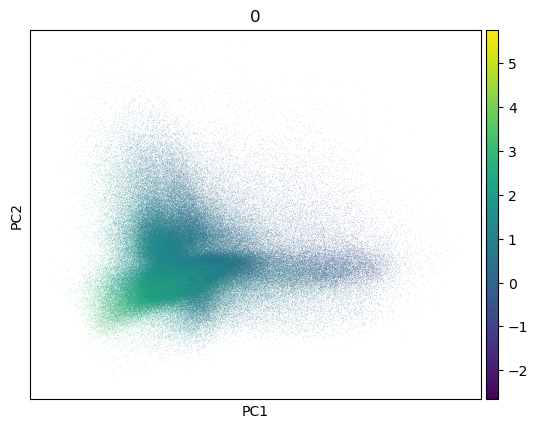

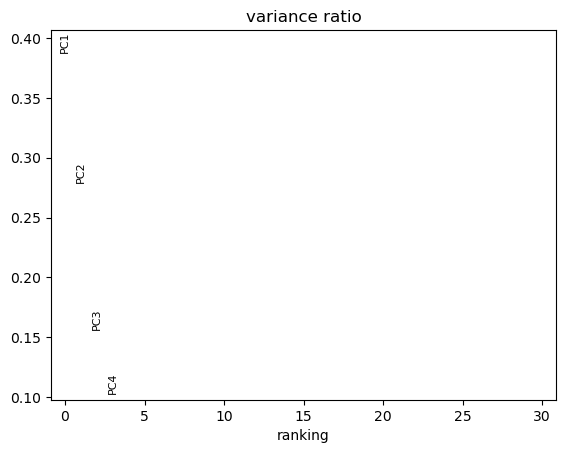

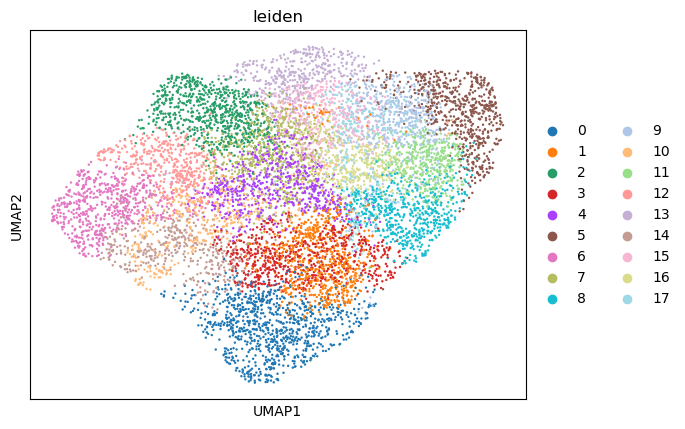

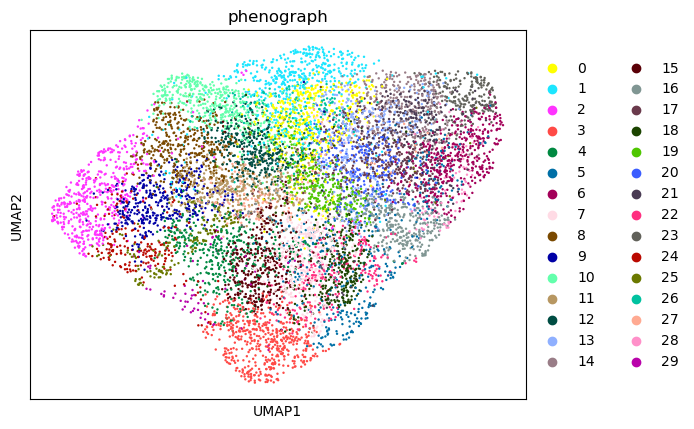

In [32]:
plt.style.use('default')
print(method)
print(expressions['vae_mu'].shape)
a = q.adata[method]
random_choice = np.random.choice(len(a), 10000, replace=False)

sc.tl.pca(a, svd_solver='arpack')
sc.pl.pca(a, color='0')
sc.pl.pca_variance_ratio(a)
# sc.pl.pca_variance_ratio(a0, log=True)
b = a[random_choice, :].copy()
sc.pp.neighbors(b)
sc.tl.leiden(b)
sc.tl.umap(b)
sc.pl.umap(b, color='leiden')
sc.pl.umap(b, color='phenograph')

[28, 376, 739, 1387, 1426, 1567, 1607, 1649, 1651, 1662, 1904, 2335, 2517, 2702, 2781, 2898, 3172, 3254, 3335, 3512, 4320, 4540, 4697, 4710, 5403, 5461, 5508, 5775, 5946, 6232, 6397, 6497, 6602, 6865, 6947, 7188, 7657, 7729, 7761, 7822, 8332, 8405, 8628, 8645, 8834, 9029, 9189, 9220, 9603, 9876, 9911]


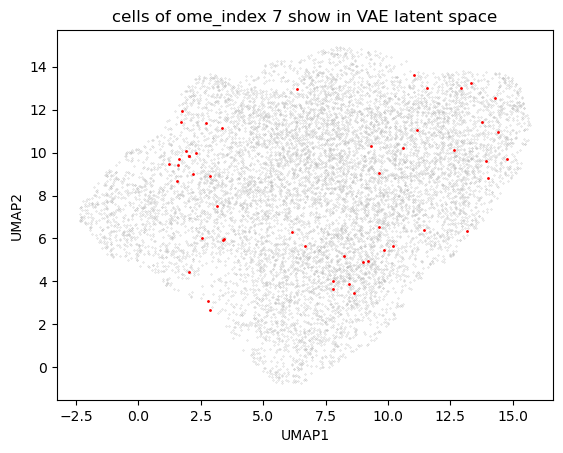

In [33]:
import matplotlib

index_info_omes, index_info_begins, index_info_ends = pickle.load(open(file_path('merged_cells_info.pickle'), 'rb'))
ome_index = 7
begin = index_info_begins[ome_index]
end = index_info_ends[ome_index]
random_in_ome = [j for j, i in enumerate(random_choice) if begin <= i < end]
print(random_in_ome)
z = np.zeros(len(random_choice))
z[random_in_ome] = 1
s = pd.Series(z, dtype='category')
s.index = b.obs.index
b.obs[f'ome_index{ome_index}'] = s
u = b.obsm['X_umap']
# plt.style.use('dark_background')
plt.figure()
plt.scatter(u[:, 0], u[:, 1], s=0.05, color=(0.7, 0.7, 0.7))
plt.scatter(u[random_in_ome, 0], u[random_in_ome, 1], s=1, c='r')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.title(f'cells of ome_index {ome_index} show in VAE latent space')
plt.show()
plt.style.use('default')

In [34]:
class Coord:
    def __init__(self, x, y):
        self.x = x
        self.y = y
    def __str__(self):
        return f'({self.x:0.1f}, {self.y:0.1f})'
class Rectangle:
    def __init__(self, ll):
        eps = 0.001
        self.bottom_left = Coord(ll[0] - eps, ll[1] - eps)
        self.bottom_right = Coord(ll[0] + ll[2] + eps, ll[1] - eps)
        self.top_left = Coord(ll[0] - eps, ll[1] + ll[3] + eps)
        self.top_right = Coord(ll[0] + ll[2] + eps, ll[1] + ll[3] + eps)
    def __str__(self):
        return f'[{self.bottom_left}, {self.bottom_right}, {self.top_left}, {self.top_right}]'
    
def overlaps(ll, rects):
    a = Rectangle(ll)
    o = False
    for r in rects:
        b = Rectangle(r)
#                 aprint(a, b)
        o = o or not (a.top_right.x < b.bottom_left.x or a.bottom_left.x > b.top_right.x or a.top_right.y < b.bottom_left.y or a.bottom_left.y > b.top_right.y)
    return o

In [35]:
overlaps([0, 0, 0.2, 0.2], [[0.55, 0.55, 0.1, 0.1], [0.0, 0.3, 0.1, 0.1]])

False

In [36]:
print(q.phenographs['transformed'].max())
print(q.phenographs['vae_mu'].max())
print(q.phenographs['vae_mu'].shape)
print(adjusted_rand_score(q.phenographs['raw'].flatten(), q.phenographs['transformed'].flatten()))
print(adjusted_rand_score(q.phenographs['vae_mu'].flatten(), q.phenographs['transformed'].flatten()))
print(adjusted_rand_score(q.phenographs['vae_mu'].flatten(), q.phenographs['raw'].flatten()))

p_raw = q.phenographs['raw'].flatten()
p_transformed = q.phenographs['transformed'].flatten()
p_vae_mu = q.phenographs['vae_mu'].flatten()

c0 = p_transformed
c1 = p_raw

# c0 = p_transformed
# c1 = p_vae_mu

#     asd
# with np.printoptions(threshold=np.inf):
#     print(m)

77
29
(449434, 1)
0.06135471389551639
0.19011755355169133
0.04648766293006718


transformed vs raw
adjusted rand score: 0.06135471389551639
(78, 58)


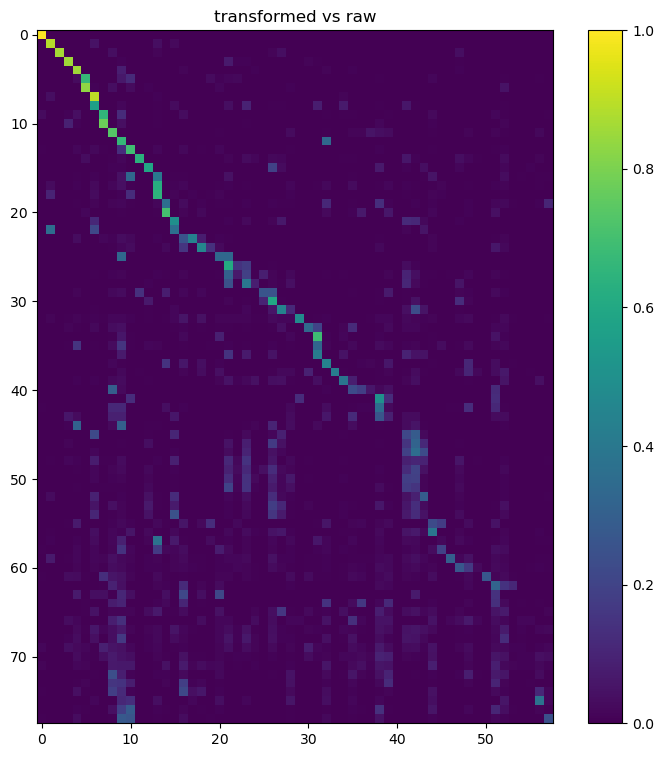

raw vs transformed
adjusted rand score: 0.06135471389551639
(58, 78)


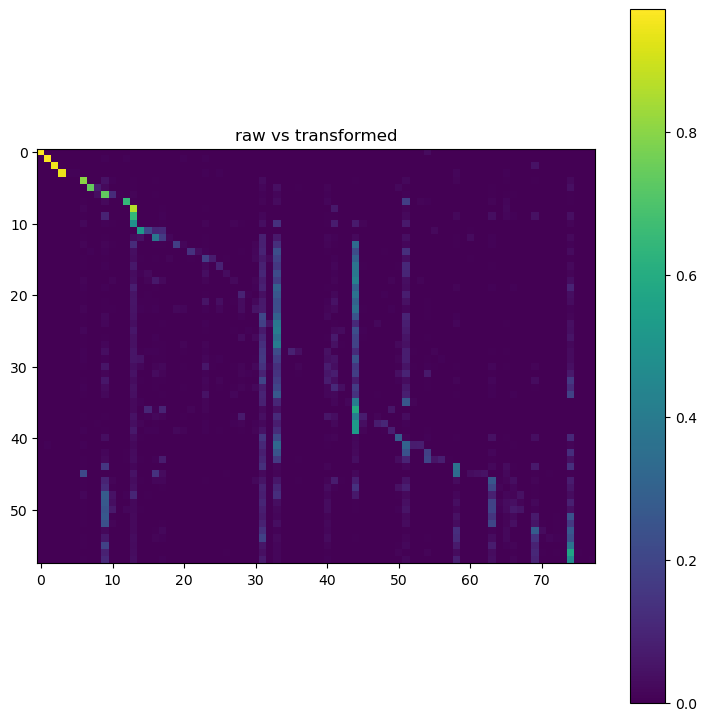

vae_mu vs raw
adjusted rand score: 0.04648766293006718
(30, 58)


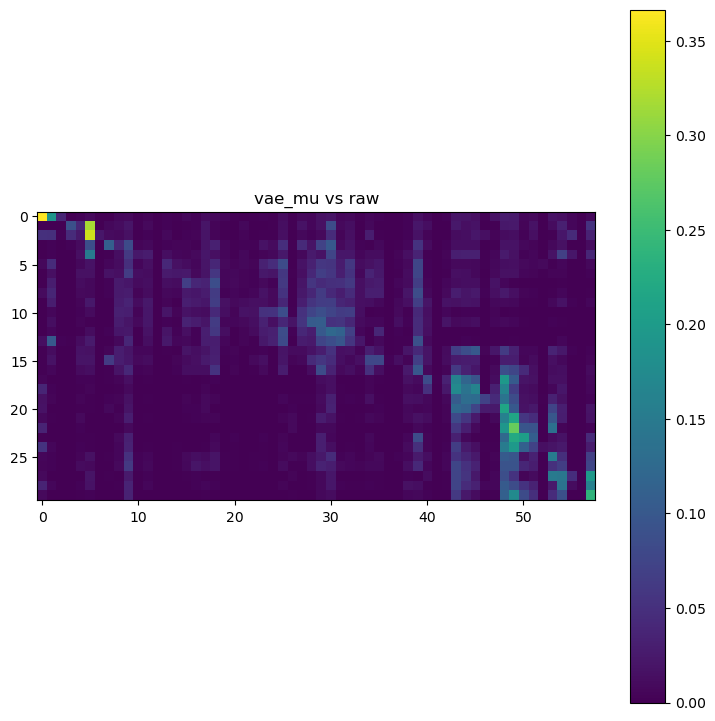

raw vs vae_mu
adjusted rand score: 0.04648766293006718
(58, 30)


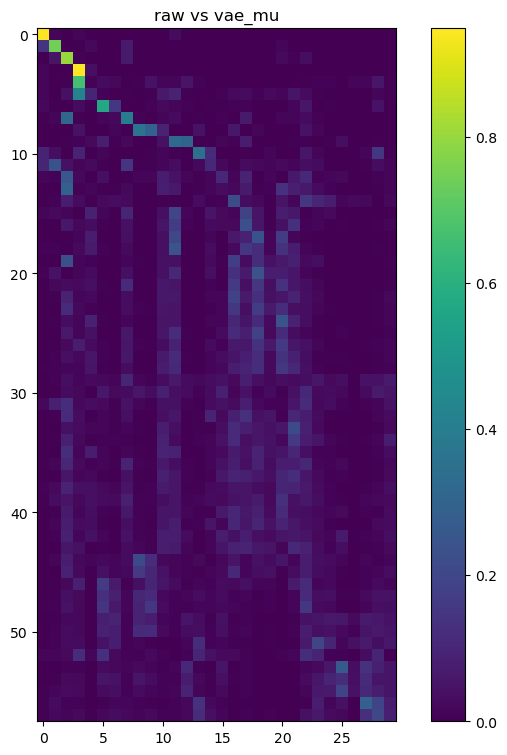

vae_mu vs transformed
adjusted rand score: 0.19011755355169133
(30, 78)


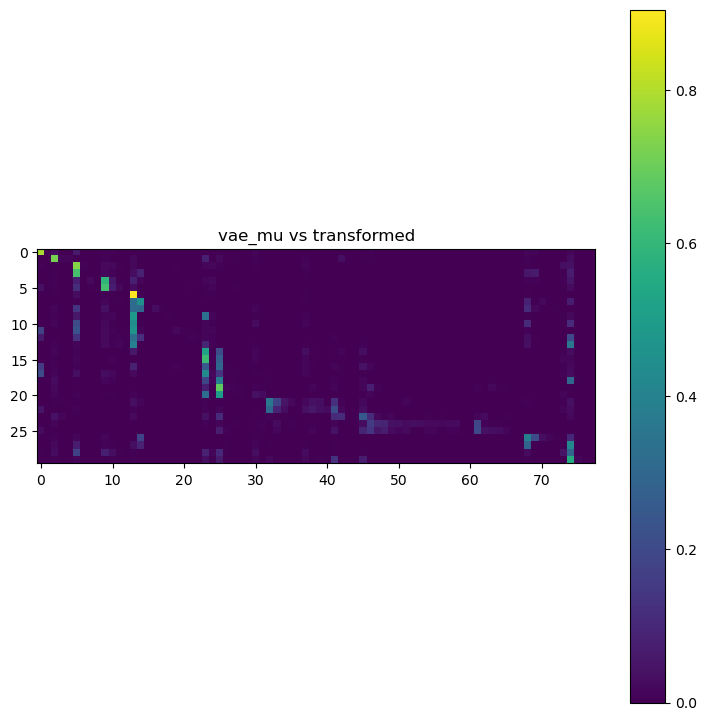

transformed vs vae_mu
adjusted rand score: 0.19011755355169133
(78, 30)


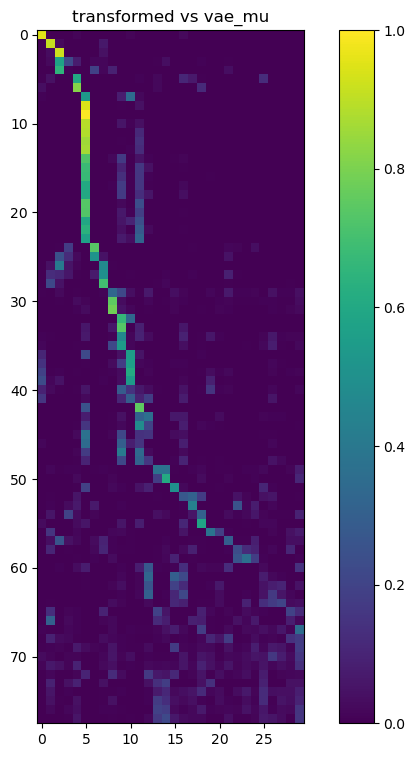

In [37]:
import seaborn as sns

def compare_clusters(c0, c1):
    print('adjusted rand score:', adjusted_rand_score(c0, c1))
    m = np.zeros((c0.max() + 1, c1.max() + 1))
    print(m.shape)
    import itertools
    for x0, x1 in itertools.product(range(m.shape[0]), range(m.shape[1])):
        z0 = np.where(c0 == x0)[0]
        z1 = c1[z0]
        z2 = z1[z1 == x1]
        m[x0, x1] = len(z2) / len(z1)
    df = pd.DataFrame(m)
    a = sns.clustermap(df)
    plt.close()

    mm = a.data2d.to_numpy()
    m0 = np.argmax(mm, axis=0)
    m1 = sorted(zip(range(len(m0)), m0), key=lambda x: x[1])
    m2, m3 = zip(*m1)
    m2
    mm0 = mm[:, m2]
    plt.figure(figsize=(9, 9))
    plt.imshow(mm0)
    plt.colorbar()
    
ss = ['raw', 'transformed', 'vae_mu']
for i0 in range(3):
    for j0 in range(3):
        if i0 <= j0:
            continue
        for s0, s1 in [(ss[i0], ss[j0]), (ss[j0], ss[i0])]:
            print(s0, 'vs', s1)
            compare_clusters(q.phenographs[s0].flatten(), q.phenographs[s1].flatten())
            plt.title(f'{s0} vs {s1}')
            plt.show()

adjusted rand score: 0.19011755355169133
(78, 30)


Text(0, 0.5, 'phenograph clustering on transformed data')

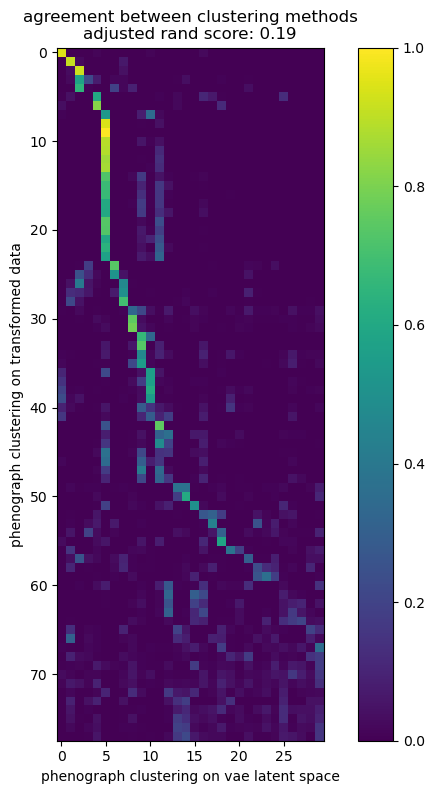

In [38]:
import seaborn as sns

c0 = p_transformed
c1 = p_vae_mu
print('adjusted rand score:', adjusted_rand_score(c0, c1))
m = np.zeros((c0.max() + 1, c1.max() + 1))
print(m.shape)
import itertools
for x0, x1 in itertools.product(range(m.shape[0]), range(m.shape[1])):
    z0 = np.where(c0 == x0)[0]
    z1 = c1[z0]
    z2 = z1[z1 == x1]
    m[x0, x1] = len(z2) / len(z1)
df = pd.DataFrame(m)
a = sns.clustermap(df)
plt.close()

mm = a.data2d.to_numpy()
m0 = np.argmax(mm, axis=0)
m1 = sorted(zip(range(len(m0)), m0), key=lambda x: x[1])
m2, m3 = zip(*m1)
m2
mm0 = mm[:, m2]
plt.figure(figsize=(9, 9))
plt.imshow(mm0)
plt.title(f'agreement between clustering methods\nadjusted rand score: {adjusted_rand_score(c0, c1):0.2f}')
plt.colorbar()
plt.xlabel('phenograph clustering on vae latent space')
plt.ylabel('phenograph clustering on transformed data')

adjusted rand score: 0.19011755355169133
(30, 78)


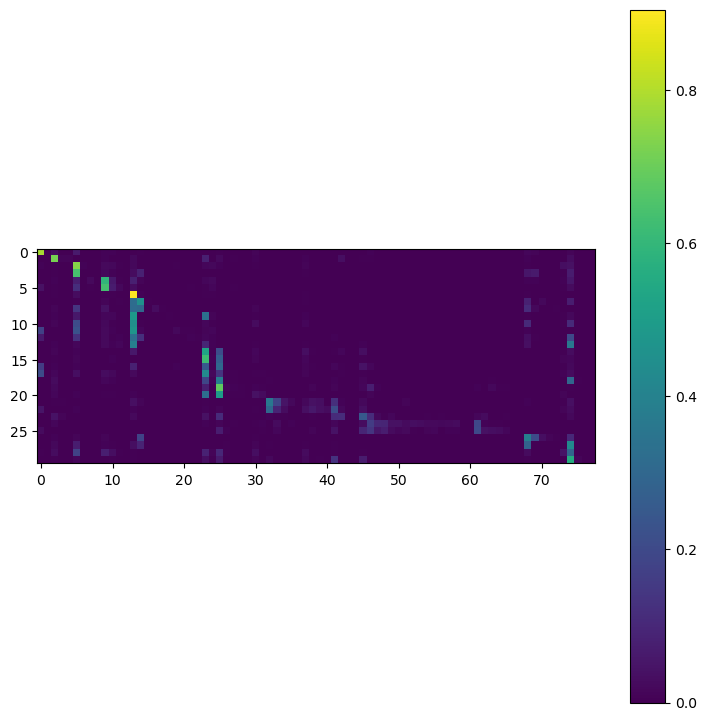

In [39]:
import seaborn as sns

c0 = p_vae_mu
c1 = p_transformed
print('adjusted rand score:', adjusted_rand_score(c0, c1))
m = np.zeros((c0.max() + 1, c1.max() + 1))
print(m.shape)
import itertools
for x0, x1 in itertools.product(range(m.shape[0]), range(m.shape[1])):
    z0 = np.where(c0 == x0)[0]
    z1 = c1[z0]
    z2 = z1[z1 == x1]
    m[x0, x1] = len(z2) / len(z1)
df = pd.DataFrame(m)
a = sns.clustermap(df)
plt.close()

mm = a.data2d.to_numpy()
m0 = np.argmax(mm, axis=0)
m1 = sorted(zip(range(len(m0)), m0), key=lambda x: x[1])
m2, m3 = zip(*m1)
m2
mm0 = mm[:, m2]
plt.figure(figsize=(9, 9))
plt.imshow(mm0)
plt.colorbar()

In [40]:
np.min(np.sum(mm0, axis=1))

0.9999999999999994

# Mapping labels

## Transformed matched to vae mu

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77}
adjusted rand score: 0.19011755355169133
(78, 30)


0.5059461889186776

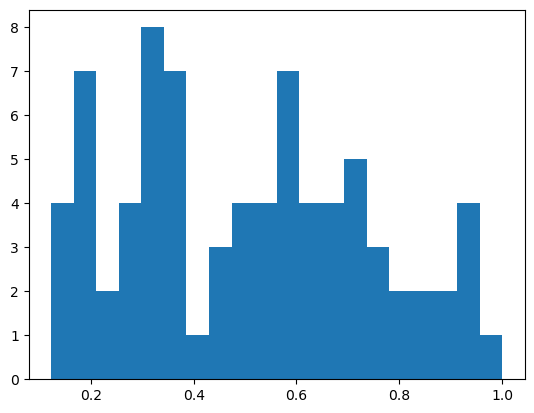

In [41]:
print(set(p_transformed.tolist()))
d = {k: None for k in set(p_transformed.tolist())}
confidence = {k: None for k in d.keys()}

c0 = p_transformed
c1 = p_vae_mu
print('adjusted rand score:', adjusted_rand_score(c0, c1))
m = np.zeros((c0.max() + 1, c1.max() + 1))
print(m.shape)
import itertools
for x0, x1 in itertools.product(range(m.shape[0]), range(m.shape[1])):
    z0 = np.where(c0 == x0)[0]
    z1 = c1[z0]
    z2 = z1[z1 == x1]
    m[x0, x1] = len(z2) / len(z1)

for k in d.keys():
    a = np.argmax(m[k, :])
    p = m[k, a]
    d[k] = a
    confidence[k] = p
    
c = np.array(list(confidence.values()))
plt.hist(c, bins=20)
p_mapped = p_transformed.copy()
p_mapped += 1000
p_confidence = np.zeros_like(p_mapped)
for k, v in d.items():
    p_mapped[p_mapped == k + 1000] = v
    p_confidence[p_mapped == k + 1000] = confidence[k]
np.mean(list(confidence.values()))

In [42]:
random_colors = np.random.rand(100, 3)
random_colors.shape

(100, 3)

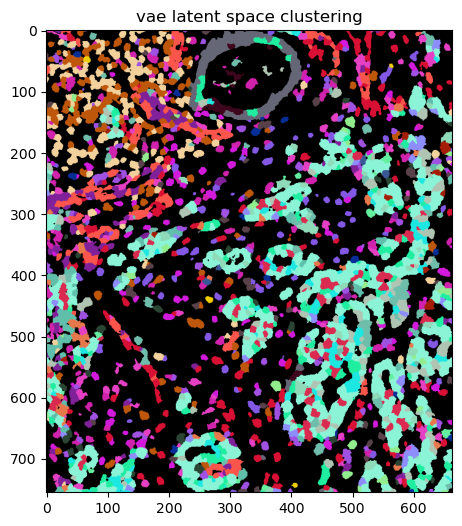

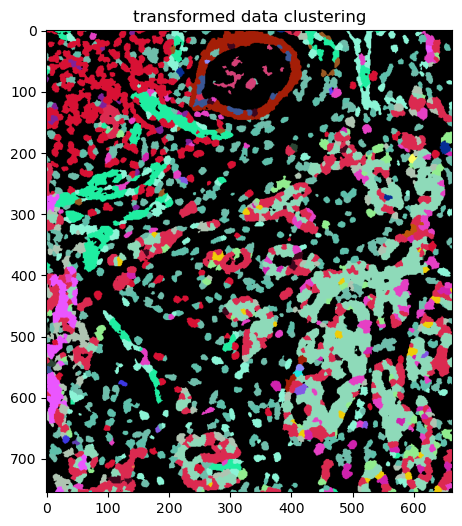

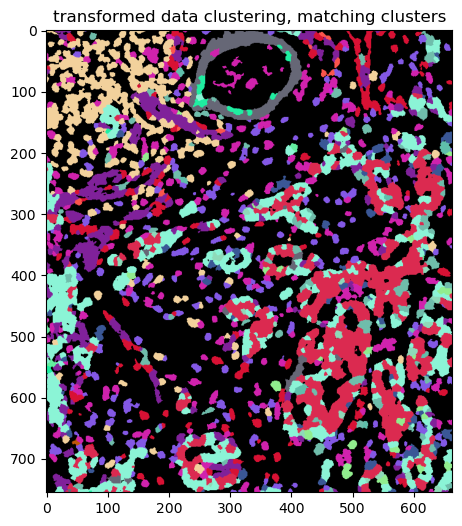

In [43]:
import math
masks_ds_train = MasksDataset('train')

ome_index = 7
begin = index_info_begins[ome_index]
end = index_info_ends[ome_index]
ome_filename = masks_ds_train.filenames[ome_index]
masks = masks_ds_train[ome_index]
d = get_filtered_labels_mapping(ome_index, ome_filename, 'train')

plt.figure(figsize=(6, 6))
new_masks = np.ones((masks.shape[0], masks.shape[1], 4))
omitted_labels = set(list(range(np.max(masks)))).difference([dd.item() for dd in d.values()]).difference({0})
for l in omitted_labels:
    new_masks[masks == l, :] = (0., 0., 0., 1.)
new_masks[masks == 0, :] = (0., 0., 0., 1.)
for k, v in d.items():
    new_masks[masks == v.item(), :3] = random_colors[p_vae_mu[begin: end][k]]
plt.imshow(new_masks)
plt.title(f'vae latent space clustering')  #, ome_index = {ome_index}')
plt.show()

plt.figure(figsize=(6, 6))
new_masks = np.ones((masks.shape[0], masks.shape[1], 4))
omitted_labels = set(list(range(np.max(masks)))).difference([dd.item() for dd in d.values()]).difference({0})
for l in omitted_labels:
    new_masks[masks == l, :] = (0., 0., 0., 1.)
new_masks[masks == 0, :] = (0., 0., 0., 1.)
for k, v in d.items():
    new_masks[masks == v.item(), :3] = random_colors[p_transformed[begin: end][k]]
plt.imshow(new_masks)
plt.title(f'transformed data clustering')  #, ome_index = {ome_index}')
plt.show()

plt.figure(figsize=(6, 6))
new_masks = np.ones((masks.shape[0], masks.shape[1], 4))
omitted_labels = set(list(range(np.max(masks)))).difference([dd.item() for dd in d.values()]).difference({0})
for l in omitted_labels:
    new_masks[masks == l, :] = (0., 0., 0., 1.)
new_masks[masks == 0, :] = (0., 0., 0., 1.)
for k, v in d.items():
    new_masks[masks == v.item(), :3] = random_colors[p_mapped[begin: end][k]]
plt.imshow(new_masks)
plt.title(f'transformed data clustering, matching clusters')  #ome_index = {ome_index}')
plt.show()

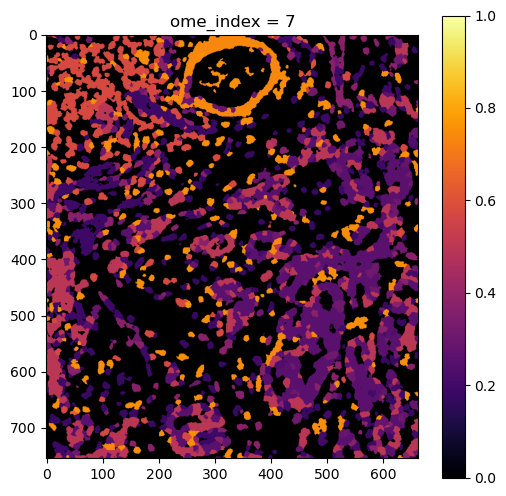

In [44]:
import matplotlib.cm
cmap = matplotlib.cm.get_cmap('inferno')
plt.figure(figsize=(6, 6))
new_masks = np.ones((masks.shape[0], masks.shape[1], 4))
omitted_labels = set(list(range(np.max(masks)))).difference([dd.item() for dd in d.values()]).difference({0})
for l in omitted_labels:
    new_masks[masks == l, :] = (0., 0., 0., 1.)
new_masks[masks == 0, :] = (0., 0., 0., 1.)
for k, v in d.items():
    new_masks[masks == v.item(), :3] = cmap(confidence[p_mapped[begin: end][k]])[:3]
# here the cmap is just for the colobar, not for coloring
plt.imshow(new_masks, cmap=cmap)
plt.title(f'ome_index = {ome_index}')
plt.colorbar()
plt.show()

(755, 663)
0.7533059328091494


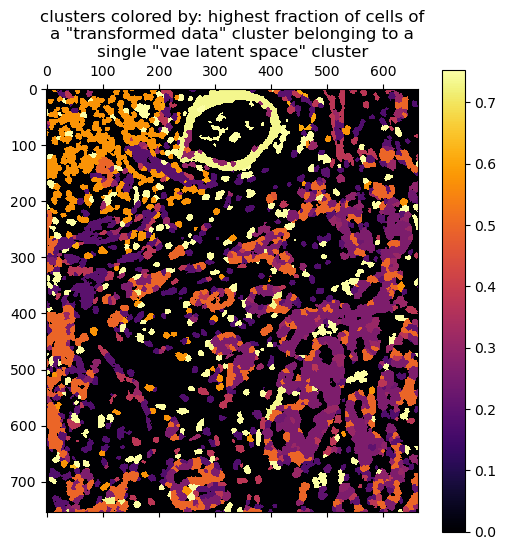

In [45]:
confidence_masks = masks.copy().astype(np.float)
print(confidence_masks.shape)
for l in omitted_labels:
    confidence_masks[masks == l] = 0
for k, v in d.items():
    c = confidence[p_mapped[begin: end][k]]
    ii = masks == v.item()
    confidence_masks[ii] = c
print(confidence_masks.max())
plt.figure(figsize=(6, 6))
plt.matshow(confidence_masks, cmap=cmap, fignum=0)
plt.title(f'clusters colored by: highest fraction of cells of\na "transformed data" cluster belonging to a\nsingle "vae latent space" cluster')
plt.colorbar()
plt.show()

vae_mu
(449434, 5)


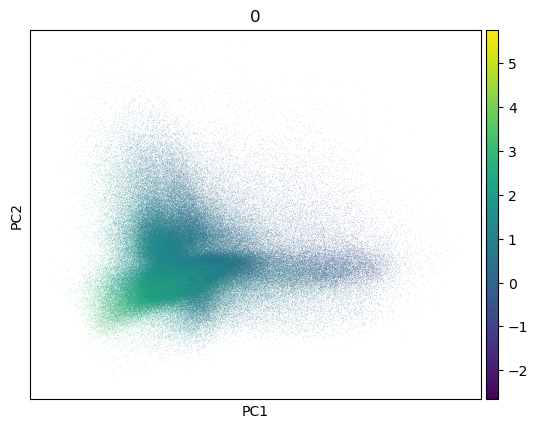

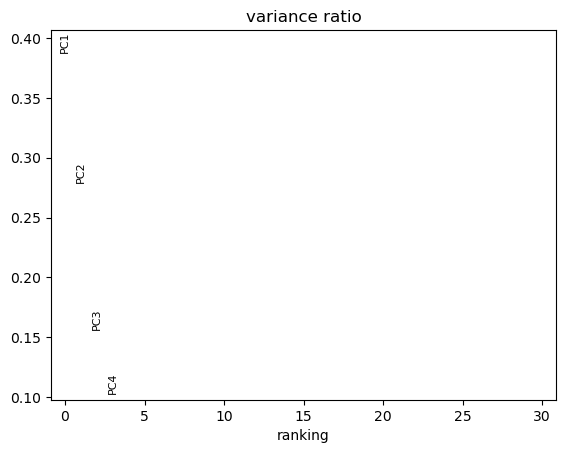

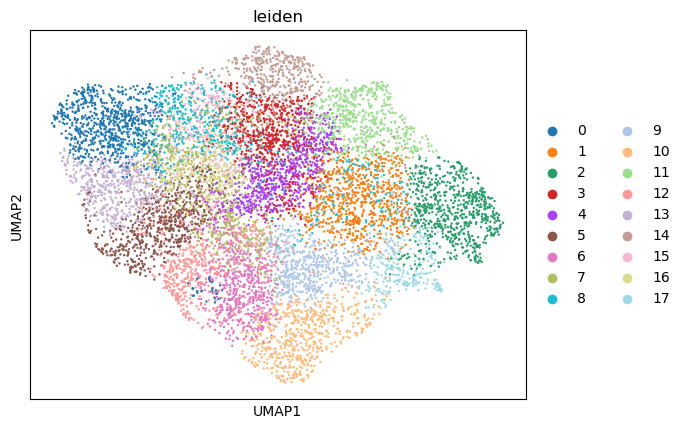

In [46]:
plt.style.use('default')
print(method)
print(expressions['vae_mu'].shape)
a = q.adata[method]
random_choice = np.random.choice(len(a), 10000, replace=False)

sc.tl.pca(a, svd_solver='arpack')
sc.pl.pca(a, color='0')
sc.pl.pca_variance_ratio(a)
# sc.pl.pca_variance_ratio(a0, log=True)
b = a[random_choice, :].copy()
sc.pp.neighbors(b)
sc.tl.leiden(b)
sc.tl.umap(b)
sc.pl.umap(b, color='leiden')

Text(0.5, 1.0, 'vae latent space, colored by phenograph clustering computed on the\nvae latent space')

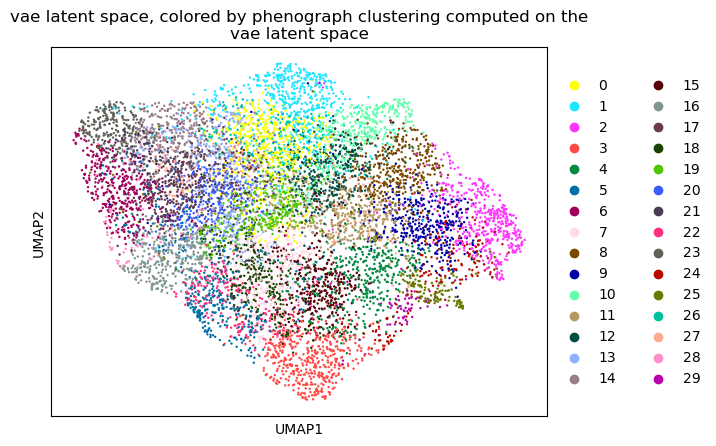

In [47]:
sc.pl.umap(b, color='phenograph', show=False)
ax = plt.gca()
ax.set_title('vae latent space, colored by phenograph clustering computed on the\nvae latent space')

Text(0.5, 1.0, 'vae latent space colored by phenograph computed on the\ntransformed data')

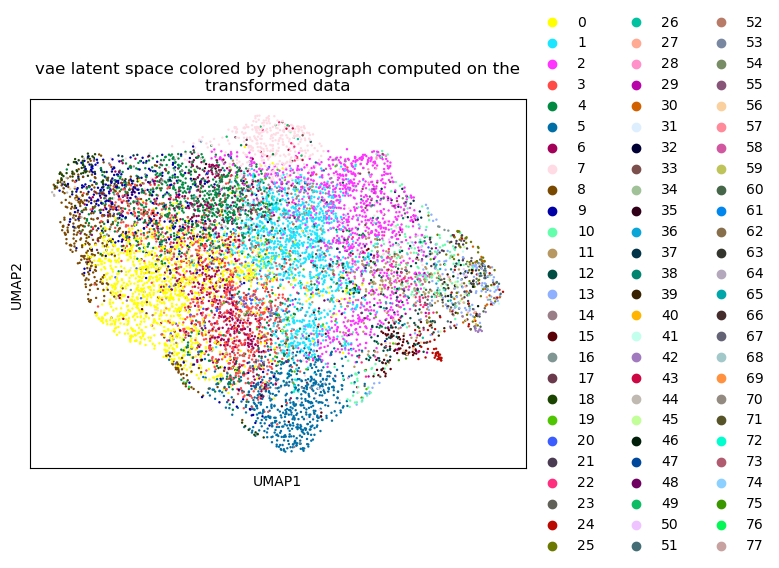

In [48]:
phenograph_transformed = q.adata['transformed'].obs['phenograph']
a.obs['phenograph_transformed'] = phenograph_transformed
b.obs['phenograph_transformed'] = phenograph_transformed[random_choice]

sc.pl.umap(b, color='phenograph_transformed', show=False)
ax = plt.gca()
ax.set_title('vae latent space colored by phenograph computed on the\ntransformed data')

In [49]:
def match_ome(ome_index):
    import math
    masks_ds_train = MasksDataset('train')

    begin = index_info_begins[ome_index]
    end = index_info_ends[ome_index]
    ome_filename = masks_ds_train.filenames[ome_index]
    masks = masks_ds_train[ome_index]
    d = get_filtered_labels_mapping(ome_index, ome_filename, 'train')

    plt.figure(figsize=(18, 6))
    
    new_masks = np.ones((masks.shape[0], masks.shape[1], 4))
    omitted_labels = set(list(range(np.max(masks)))).difference([dd.item() for dd in d.values()]).difference({0})
    for l in omitted_labels:
        new_masks[masks == l, :] = (0., 0., 0., 1.)
    new_masks[masks == 0, :] = (0., 0., 0., 1.)
    for k, v in d.items():
        new_masks[masks == v.item(), :3] = random_colors[p_vae_mu[begin: end][k]]
    plt.subplot(1, 3, 1)
    plt.imshow(new_masks)
    plt.title(f'vae latent space clustering')  #, ome_index = {ome_index}')

    new_masks = np.ones((masks.shape[0], masks.shape[1], 4))
    omitted_labels = set(list(range(np.max(masks)))).difference([dd.item() for dd in d.values()]).difference({0})
    for l in omitted_labels:
        new_masks[masks == l, :] = (0., 0., 0., 1.)
    new_masks[masks == 0, :] = (0., 0., 0., 1.)
    for k, v in d.items():
        new_masks[masks == v.item(), :3] = random_colors[p_mapped[begin: end][k]]
    plt.subplot(1, 3, 2)
    plt.imshow(new_masks)
    plt.title(f'transformed data clustering, matching clusters')  #ome_index = {ome_index}')
    
    import matplotlib.cm
    cmap = matplotlib.cm.get_cmap('inferno')
    new_masks = np.ones((masks.shape[0], masks.shape[1], 4))
    omitted_labels = set(list(range(np.max(masks)))).difference([dd.item() for dd in d.values()]).difference({0})
    confidence_masks = masks.copy().astype(np.float)
    
    m_set = set(np.unique(masks))
    o_set = np.unique(omitted_labels)[0]
    v_set = {v.item() for v in d.values()}
    print(len(m_set))
    print(len(o_set))
    print(len(v_set) + len(o_set))
    bug_set = m_set.difference(o_set.union(v_set).union([0]))
    if len(bug_set) > 0:
        for b in bug_set:
            print(f'BUG: the label {b} has not been handled correctly')
            n = np.sum(masks == b)
            if n < 10:
                print(f'only {n} pixels have the label {b}, so we can temporarily ignore the bug')
            else:
                print(f'{n} pixels have the label {b}, you should investigate the bug')
            omitted_labels.add(b)
    
    print(confidence_masks.shape)
    for l in omitted_labels:
        confidence_masks[masks == l] = 0
    for k, v in d.items():
        c = confidence[p_mapped[begin: end][k]]
        ii = masks == v.item()
        confidence_masks[ii] = c
    print(confidence_masks.max())
    plt.subplot(1, 3, 3)
    plt.matshow(confidence_masks, cmap=cmap, fignum=0)
#     plt.title(f'clusters colored by: highest fraction of cells of\na "transformed data" cluster belonging to a\nsingle "vae latent space" cluster')
    plt.title(f'cluster mapping score')
    plt.rcParams['xtick.bottom'] = True
    plt.rcParams['xtick.labelbottom'] = True
    plt.rcParams['xtick.top'] = False
    plt.rcParams['xtick.labeltop'] = False
    from mpl_toolkits.axes_grid1 import make_axes_locatable
    ax = plt.gca()
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.1)
    plt.colorbar(cax=cax)
    plt.show()

2891
199
2890
(421, 833)
0.7533059328091494


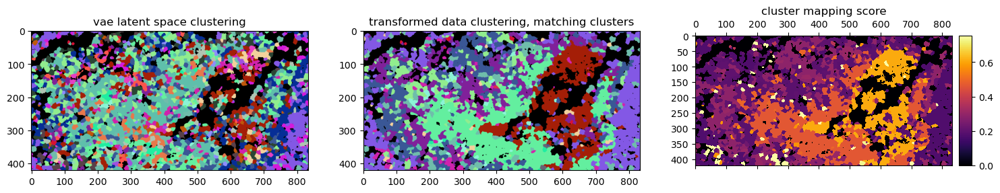

In [50]:
match_ome(0)

## Transformed matched to raw

adjusted rand score: 0.06135471389551639
(78, 58)


Text(0, 0.5, 'phenograph clustering on raw data')

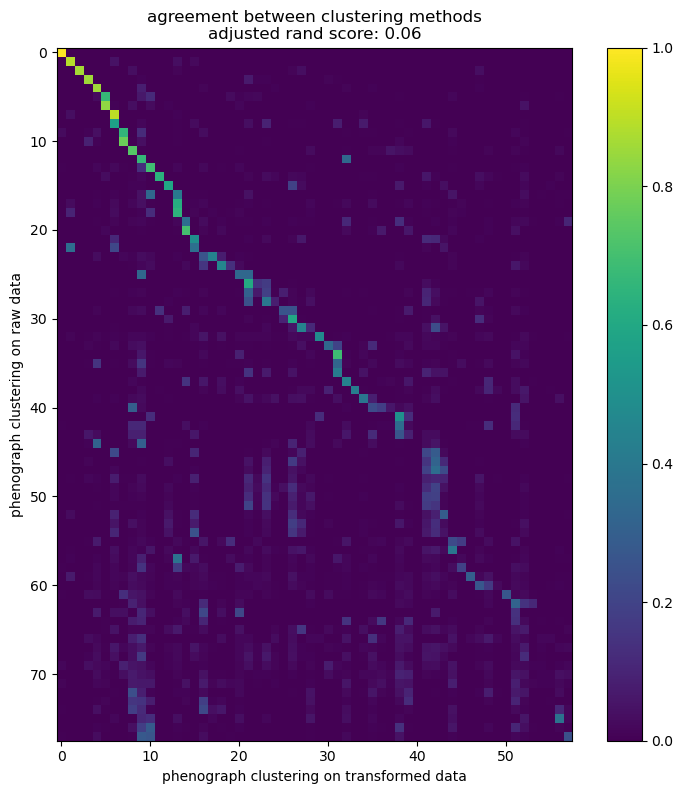

In [51]:
import seaborn as sns

c0 = p_transformed
c1 = p_raw
print('adjusted rand score:', adjusted_rand_score(c0, c1))
m = np.zeros((c0.max() + 1, c1.max() + 1))
print(m.shape)
import itertools
for x0, x1 in itertools.product(range(m.shape[0]), range(m.shape[1])):
    z0 = np.where(c0 == x0)[0]
    z1 = c1[z0]
    z2 = z1[z1 == x1]
    m[x0, x1] = len(z2) / len(z1)
df = pd.DataFrame(m)
a = sns.clustermap(df)
plt.close()

mm = a.data2d.to_numpy()
m0 = np.argmax(mm, axis=0)
m1 = sorted(zip(range(len(m0)), m0), key=lambda x: x[1])
m2, m3 = zip(*m1)
m2
mm0 = mm[:, m2]
plt.figure(figsize=(9, 9))
plt.imshow(mm0)
plt.title(f'agreement between clustering methods\nadjusted rand score: {adjusted_rand_score(c0, c1):0.2f}')
plt.colorbar()
plt.xlabel('phenograph clustering on transformed data')
plt.ylabel('phenograph clustering on raw data')

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77}
adjusted rand score: 0.06135471389551639
(78, 58)


0.41552400243722243

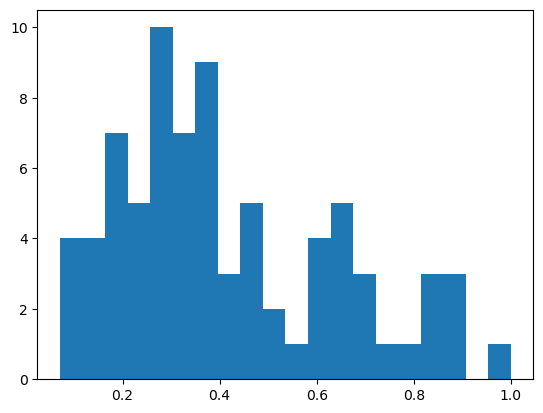

In [52]:
print(set(p_transformed.tolist()))
d = {k: None for k in set(p_transformed.tolist())}
confidence = {k: None for k in d.keys()}

c0 = p_transformed
c1 = p_raw
print('adjusted rand score:', adjusted_rand_score(c0, c1))
m = np.zeros((c0.max() + 1, c1.max() + 1))
print(m.shape)
import itertools
for x0, x1 in itertools.product(range(m.shape[0]), range(m.shape[1])):
    z0 = np.where(c0 == x0)[0]
    z1 = c1[z0]
    z2 = z1[z1 == x1]
    m[x0, x1] = len(z2) / len(z1)

for k in d.keys():
    a = np.argmax(m[k, :])
    p = m[k, a]
    d[k] = a
    confidence[k] = p
    
c = np.array(list(confidence.values()))
plt.hist(c, bins=20)
p_mapped = p_transformed.copy()
p_mapped += 1000
p_confidence = np.zeros_like(p_mapped)
for k, v in d.items():
    p_mapped[p_mapped == k + 1000] = v
    p_confidence[p_mapped == k + 1000] = confidence[k]
np.mean(list(confidence.values()))

In [53]:
def match_ome(ome_index):
    import math
    masks_ds_train = MasksDataset('train')

    begin = index_info_begins[ome_index]
    end = index_info_ends[ome_index]
    ome_filename = masks_ds_train.filenames[ome_index]
    masks = masks_ds_train[ome_index]
    d = get_filtered_labels_mapping(ome_index, ome_filename, 'train')

    plt.figure(figsize=(18, 6))
    
    new_masks = np.ones((masks.shape[0], masks.shape[1], 4))
    omitted_labels = set(list(range(np.max(masks)))).difference([dd.item() for dd in d.values()]).difference({0})
    for l in omitted_labels:
        new_masks[masks == l, :] = (0., 0., 0., 1.)
    new_masks[masks == 0, :] = (0., 0., 0., 1.)
    for k, v in d.items():
        new_masks[masks == v.item(), :3] = random_colors[p_raw[begin: end][k]]
    plt.subplot(1, 3, 1)
    plt.imshow(new_masks)
    plt.title(f'raw data clustering')  #, ome_index = {ome_index}')

    new_masks = np.ones((masks.shape[0], masks.shape[1], 4))
    omitted_labels = set(list(range(np.max(masks)))).difference([dd.item() for dd in d.values()]).difference({0})
    for l in omitted_labels:
        new_masks[masks == l, :] = (0., 0., 0., 1.)
    new_masks[masks == 0, :] = (0., 0., 0., 1.)
    for k, v in d.items():
        new_masks[masks == v.item(), :3] = random_colors[p_mapped[begin: end][k]]
    plt.subplot(1, 3, 2)
    plt.imshow(new_masks)
    plt.title(f'transformed data clustering, matching clusters')  #ome_index = {ome_index}')
    
    import matplotlib.cm
    cmap = matplotlib.cm.get_cmap('inferno')
    new_masks = np.ones((masks.shape[0], masks.shape[1], 4))
    omitted_labels = set(list(range(np.max(masks)))).difference([dd.item() for dd in d.values()]).difference({0})
    confidence_masks = masks.copy().astype(np.float)
    
    m_set = set(np.unique(masks))
    o_set = np.unique(omitted_labels)[0]
    v_set = {v.item() for v in d.values()}
    print(len(m_set))
    print(len(o_set))
    print(len(v_set) + len(o_set))
    bug_set = m_set.difference(o_set.union(v_set).union([0]))
    if len(bug_set) > 0:
        for b in bug_set:
            print(f'BUG: the label {b} has not been handled correctly')
            n = np.sum(masks == b)
            if n < 10:
                print(f'only {n} pixels have the label {b}, so we can temporarily ignore the bug')
            else:
                print(f'{n} pixels have the label {b}, you should investigate the bug')
            omitted_labels.add(b)
    
    print(confidence_masks.shape)
    for l in omitted_labels:
        confidence_masks[masks == l] = 0
    for k, v in d.items():
        c = confidence[p_mapped[begin: end][k]]
        ii = masks == v.item()
        confidence_masks[ii] = c
    print(confidence_masks.max())
    plt.subplot(1, 3, 3)
    plt.matshow(confidence_masks, cmap=cmap, fignum=0)
#     plt.title(f'clusters colored by: highest fraction of cells of\na "transformed data" cluster belonging to a\nsingle "vae latent space" cluster')
    plt.title(f'cluster mapping score')
    plt.rcParams['xtick.bottom'] = True
    plt.rcParams['xtick.labelbottom'] = True
    plt.rcParams['xtick.top'] = False
    plt.rcParams['xtick.labeltop'] = False
    from mpl_toolkits.axes_grid1 import make_axes_locatable
    ax = plt.gca()
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.1)
    plt.colorbar(cax=cax)
    plt.show()

# Entropy in umap

vae_mu
(449434, 5)


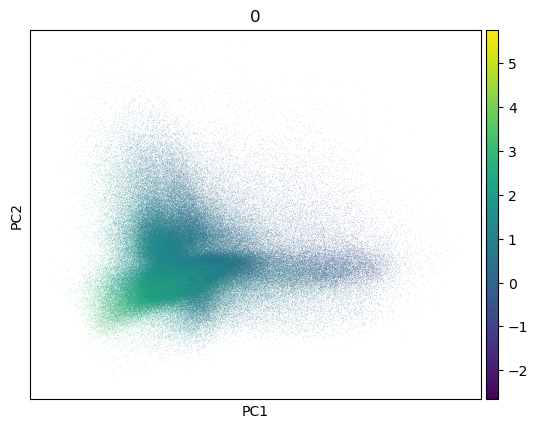

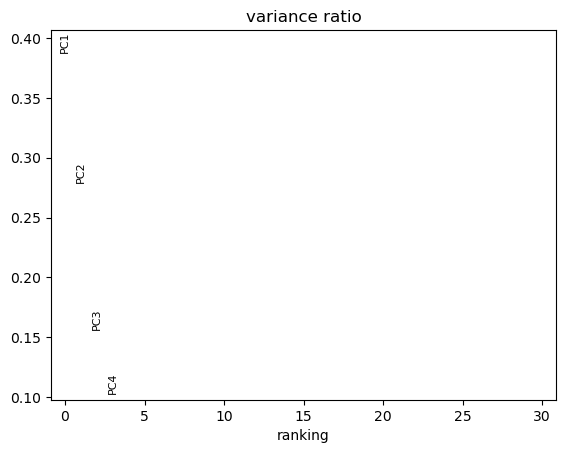

In [54]:
plt.style.use('default')
print(method)
print(expressions['vae_mu'].shape)
a = q.adata[method]
random_choice = np.random.choice(len(a), 10000, replace=False)

sc.tl.pca(a, svd_solver='arpack')
sc.pl.pca(a, color='0')
sc.pl.pca_variance_ratio(a)
# sc.pl.pca_variance_ratio(a0, log=True)
b = a[random_choice, :].copy()
sc.pp.neighbors(b)
sc.tl.leiden(b)
sc.tl.umap(b)

In [55]:
b

AnnData object with n_obs × n_vars = 10000 × 5
    obs: 'phenograph', 'phenograph_transformed', 'leiden'
    uns: 'neighbors', 'pca', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [56]:
def map_patient_metadata_to_cells(patient_metadata):
    l = []
    index_info_omes, index_info_begins, index_info_ends = pickle.load(open(file_path('merged_cells_info.pickle'), 'rb'))
    for ome_index in range(len(patient_metadata)):
        begin = index_info_begins[ome_index]
        end = index_info_ends[ome_index]
        v = patient_metadata[ome_index]
        l.append(np.repeat(v, end - begin))
    w = np.concatenate(l)
    return w

In [57]:
s = pd.Series(map_patient_metadata_to_cells(cohort_info)[random_choice], dtype='category')
s.index = b.obs.index
b.obs['cohort_info'] = s

s = pd.Series(map_patient_metadata_to_cells(tumor_info)[random_choice], dtype='category')
s.index = b.obs.index
b.obs['tumor_info'] = s

s = pd.Series(map_patient_metadata_to_cells(patient_of_origin)[random_choice], dtype='category')
s.index = b.obs.index
b.obs['patient_of_origin'] = s

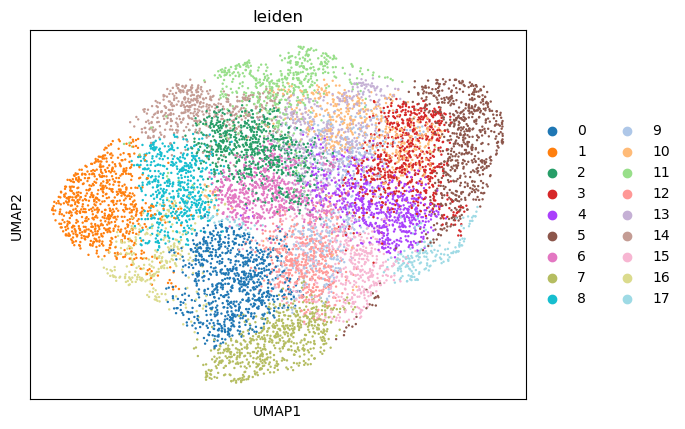

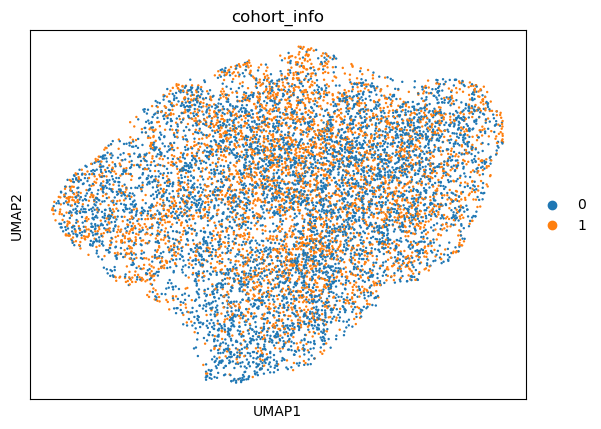

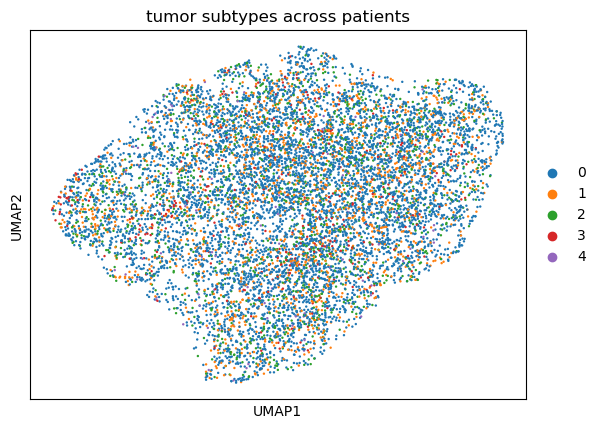

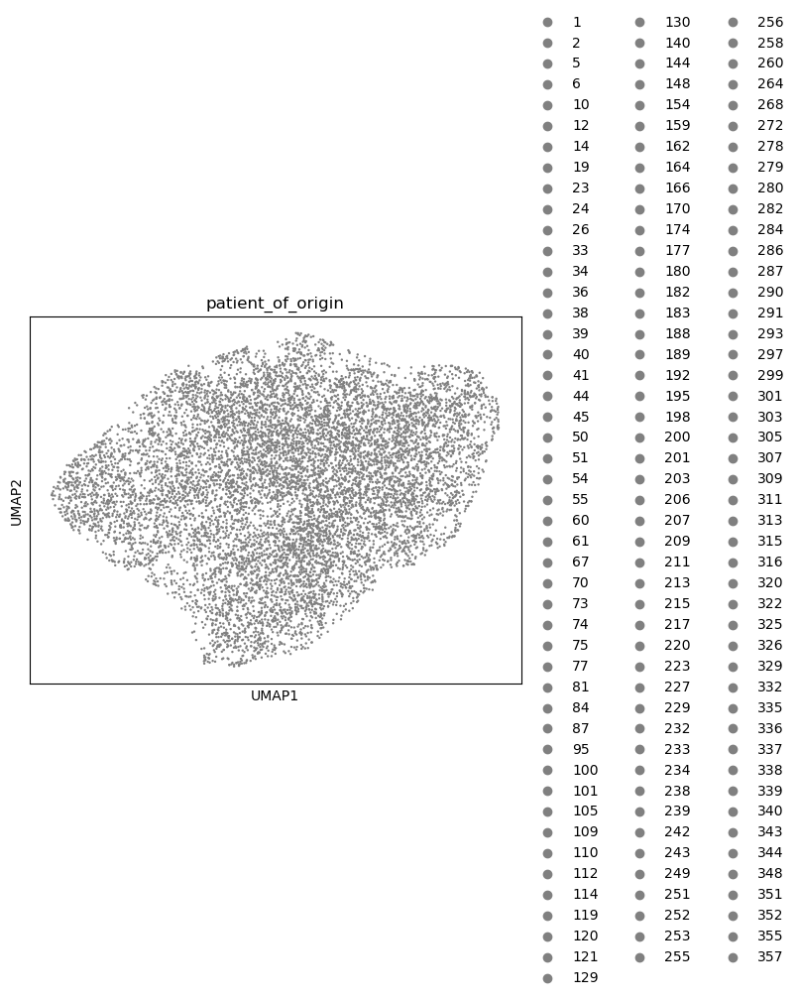

In [58]:
sc.pl.umap(b, color='leiden')
sc.pl.umap(b, color='cohort_info')
sc.pl.umap(b, color='tumor_info', title='tumor subtypes across patients')
sc.pl.umap(b, color='patient_of_origin')

Text(0.5, 1.0, 'distribution of tumor subtypes across patients')

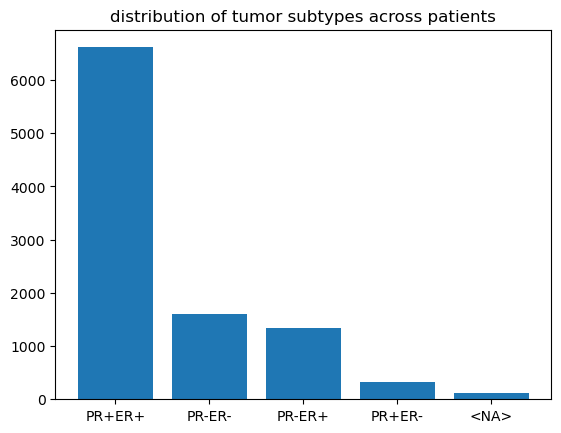

In [59]:
x = np.unique(b.obs['tumor_info'].to_numpy(), return_counts=True)
ax = plt.gca()
ax.set_xticks(np.arange(len(x[0])))
ax.set_xticklabels(['PR+ER+', 'PR-ER-', 'PR-ER+', 'PR+ER-', '<NA>'])
ax.bar(x[0], x[1])
ax.set_title('distribution of tumor subtypes across patients')

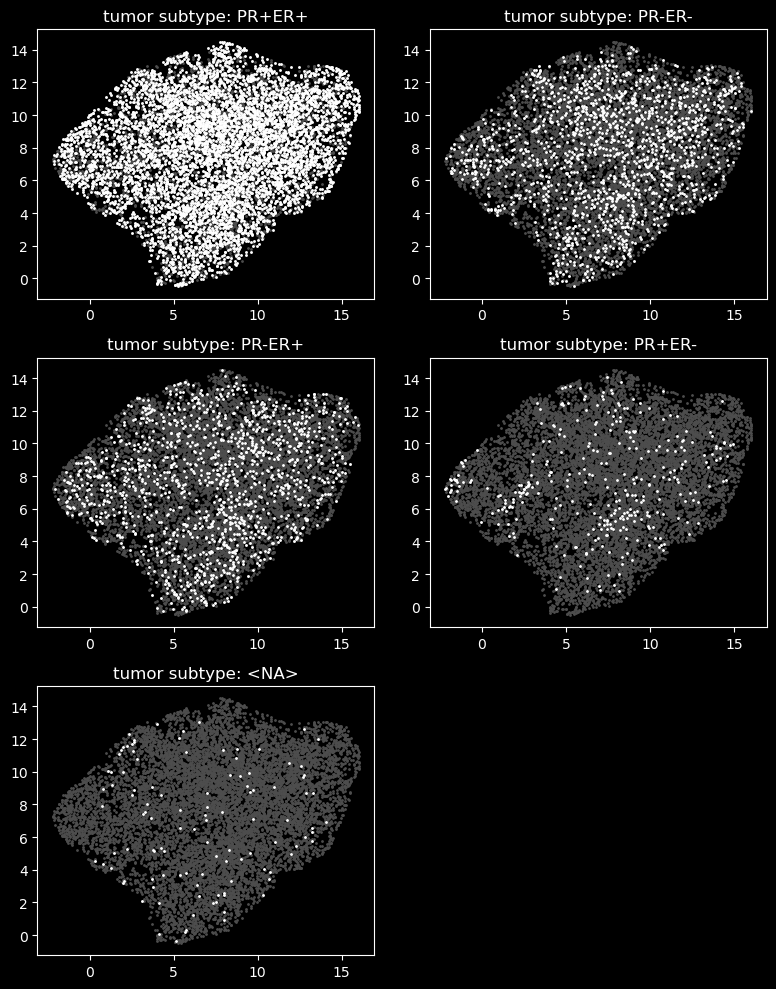

In [60]:
n = len(x[0])
plt.style.use('dark_background')
axes = plt.subplots(3, 2, figsize=(8, 10))[1].flatten()
for i in range(n):
    c = b.obs['tumor_info']
    u = b.obsm['X_umap']
    axes[i].scatter(u[:, 0], u[:, 1], color=(0.3, 0.3, 0.3), s=1)
    axes[i].scatter(u[c == i, 0], u[c == i, 1], c='w', s=1)
    SUBTYPES = ['PR+ER+', 'PR-ER-', 'PR-ER+', 'PR+ER-', '<NA>']
    axes[i].set_title(f'tumor subtype: {SUBTYPES[i]}')
axes[5].set_axis_off()
plt.tight_layout()
plt.show()
plt.style.use('default')

In [61]:
%%time
print(u.shape)
from sklearn.neighbors import NearestNeighbors
neighbors = NearestNeighbors(n_neighbors=100, algorithm='ball_tree').fit(u)
distances, indices = neighbors.kneighbors(u)

print(distances.shape)
print(indices.shape)

(10000, 2)
(10000, 100)
(10000, 100)
CPU times: user 214 ms, sys: 20 µs, total: 214 ms
Wall time: 210 ms


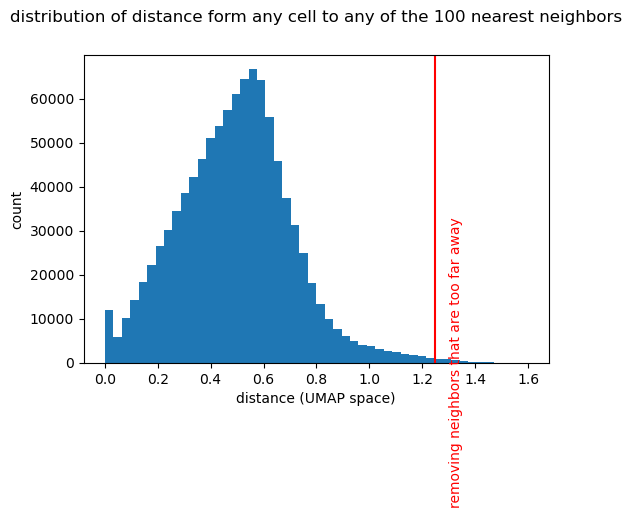

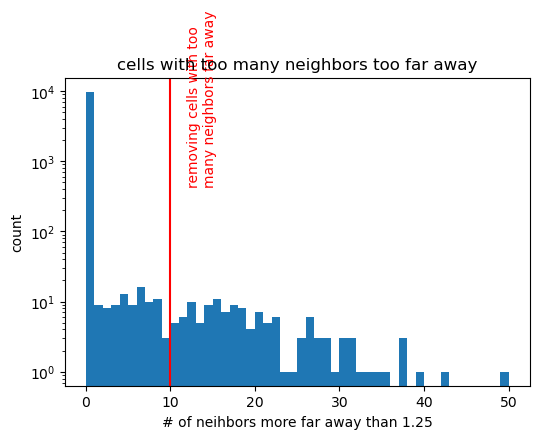

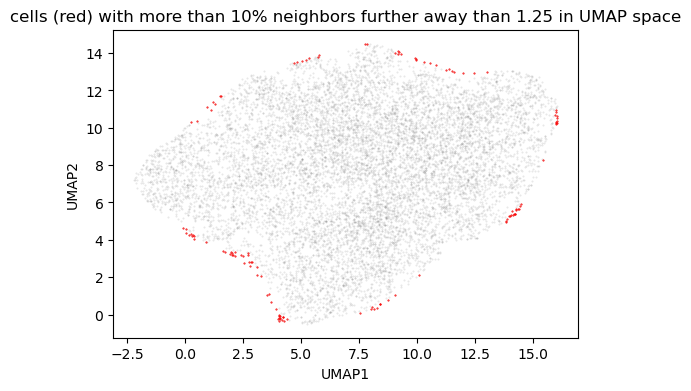

In [62]:
threshold0 = 1.25
plt.figure(figsize=(6, 4))
plt.hist(distances.flatten(), bins=50)
plt.title('distribution of distance form any cell to any of the 100 nearest neighbors', y=1.08)
plt.xlabel('distance (UMAP space)')
plt.ylabel('count')
plt.axvline(x=threshold0, c='r')
plt.text(threshold0 + 0.05, 0, f'removing neighbors that are too far away',rotation=90, c='r', verticalalignment='center', fontsize=10)
plt.show()

too_far = distances > threshold0
too_far_per_cell = np.sum(too_far, axis=1)
plt.figure(figsize=(6, 4))
plt.hist(too_far_per_cell, bins=50)
plt.yscale('log')
plt.title('cells with too many neighbors too far away')
plt.xlabel(f'# of neihbors more far away than {threshold0}')
plt.ylabel('count')
threshold1 = 10
plt.axvline(x=threshold1, c='r')
plt.text(threshold1+ 2, 8e3, f'removing cells with too\nmany neighbors far away',rotation=90, c='r', verticalalignment='center', fontsize=10)
plt.show()
bad_cells = too_far_per_cell > threshold1
filtered_indices = indices.copy().astype(np.float)
filtered_indices[too_far] = np.nan
filtered_indices[bad_cells, :] = np.nan

plt.figure(figsize=(6, 4))
plt.scatter(u[:, 0], u[:, 1], s=0.2, alpha=0.1, c='k')
plt.scatter(u[bad_cells, 0], u[bad_cells, 1], s=0.2, c='r')
plt.title(f'cells (red) with more than {threshold1}% neighbors further away than {threshold0} in UMAP space')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.show()

In [63]:
import bisect
index_info_omes, index_info_begins, index_info_ends = pickle.load(open(file_path('merged_cells_info.pickle'), 'rb'))

def cell_index_to_patient_index(cell_index):
    found = bisect.bisect_right(index_info_begins, cell_index) - 1
#     print(index_info_begins[found - 1], index_info_ends[found - 1])
#     print(index_info_begins[found], index_info_ends[found])
#     print(index_info_begins[found + 1], index_info_ends[found + 1])
    return found

print(list(zip(range(10), index_info_begins[:10], index_info_ends[:10])))
tests = [
    (0, 0),
    (1, 0),
    (2, 0),
    (2689, 0),
    (2690, 0),
    (2691, 1),
    (2692, 1),
    (6246, 1),
    (6247, 2)
]
for my_input, my_solution in tests:
    found = cell_index_to_patient_index(my_input)
    print(f'cell_index = {my_input}, found = {found}', end='')
    print(', passed ' if found == my_solution else f', expected {my_solution}, NOT passed')

[(0, 0, 2691), (1, 2691, 6247), (2, 6247, 9277), (3, 9277, 11993), (4, 11993, 14690), (5, 14690, 17183), (6, 17183, 20731), (7, 20731, 23361), (8, 23361, 25206), (9, 25206, 27578)]
cell_index = 0, found = 0, passed 
cell_index = 1, found = 0, passed 
cell_index = 2, found = 0, passed 
cell_index = 2689, found = 0, passed 
cell_index = 2690, found = 0, passed 
cell_index = 2691, found = 1, passed 
cell_index = 2692, found = 1, passed 
cell_index = 6246, found = 1, passed 
cell_index = 6247, found = 2, passed 


In [64]:
def filtered_cell_index_to_full_cell_index(i):
    if np.isnan(i):
        return -1
    else:
        assert not np.isnan(i)
        ii = int(i)
        return random_choice[ii]
fixed = np.vectorize(filtered_cell_index_to_full_cell_index)(filtered_indices)

In [65]:
%%time
invalid = fixed == -1
import numpy.ma as ma
y = ma.array(fixed, mask=invalid)
print(y)
tumor_subtypes = map_patient_metadata_to_cells(tumor_info)
tumor_subtype_indices = tumor_subtypes[y]
# patient_indices = np.vectorize(cell_index_to_patient_index)(y)
# print(y.count())
# print(np.prod(y.shape))

[[105738 172456 221253 ... 39983 74790 156992]
 [137832 287199 108022 ... 404596 2173 75949]
 [346262 255247 272336 ... 227223 284241 169095]
 ...
 [90185 2751 54361 ... 10231 51888 234489]
 [188430 326533 424140 ... 420691 34528 134956]
 [193664 422268 180441 ... 436086 220248 323370]]
CPU times: user 7.48 ms, sys: 0 ns, total: 7.48 ms
Wall time: 6.1 ms


In [66]:
print(y.max())

449433


In [67]:
%%time
print(tumor_subtype_indices.shape)
print(len(index_info_omes))

a = np.apply_along_axis(lambda x: len(np.unique(x)), 1, tumor_subtype_indices) 

(10000, 100)
226
CPU times: user 85.5 ms, sys: 2.94 ms, total: 88.4 ms
Wall time: 82.8 ms


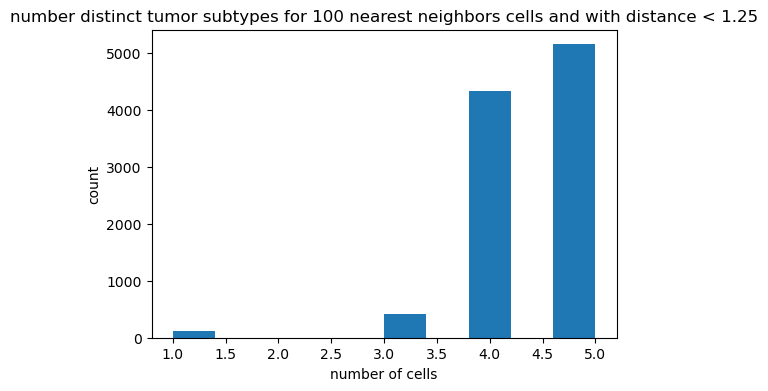

In [68]:
plt.figure(figsize=(6, 4))
plt.hist(a, bins=10)
plt.title(f'number distinct tumor subtypes for 100 nearest neighbors cells and with distance < {threshold0}')
plt.xlabel('number of cells')
plt.ylabel('count')
plt.show()

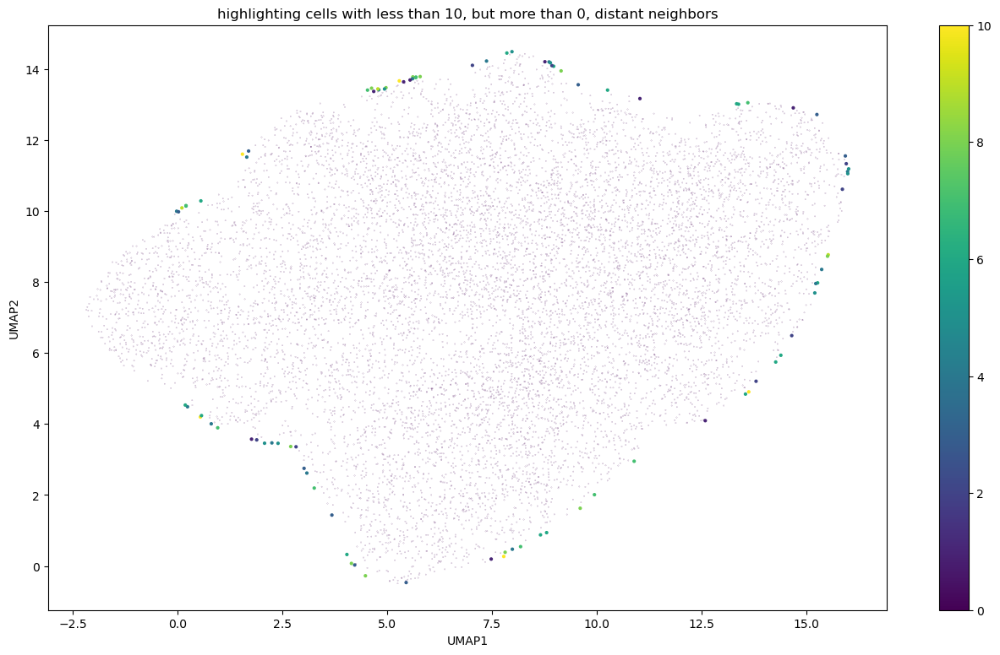

In [69]:
plt.figure(figsize=(16, 9))
# plt.scatter(u[:, 0], u[:, 1], s=0.2, alpha=0.1, c='k')
x = too_far_per_cell[~bad_cells]
sizes = np.ones_like(x) * 0.01
sizes[x > 0] = 4
cmap = matplotlib.cm.viridis
# colors = np.zeros_like(x)
plt.scatter(u[~bad_cells, 0], u[~bad_cells, 1], c=too_far_per_cell[~bad_cells], s=sizes)
# plt.title(f'cells (red) with more than {threshold1 * 100}% neighbors further away than {threshold0} in UMAP space')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.title(f'highlighting cells with less than {threshold1}, but more than 0, distant neighbors')
plt.colorbar()
plt.show()

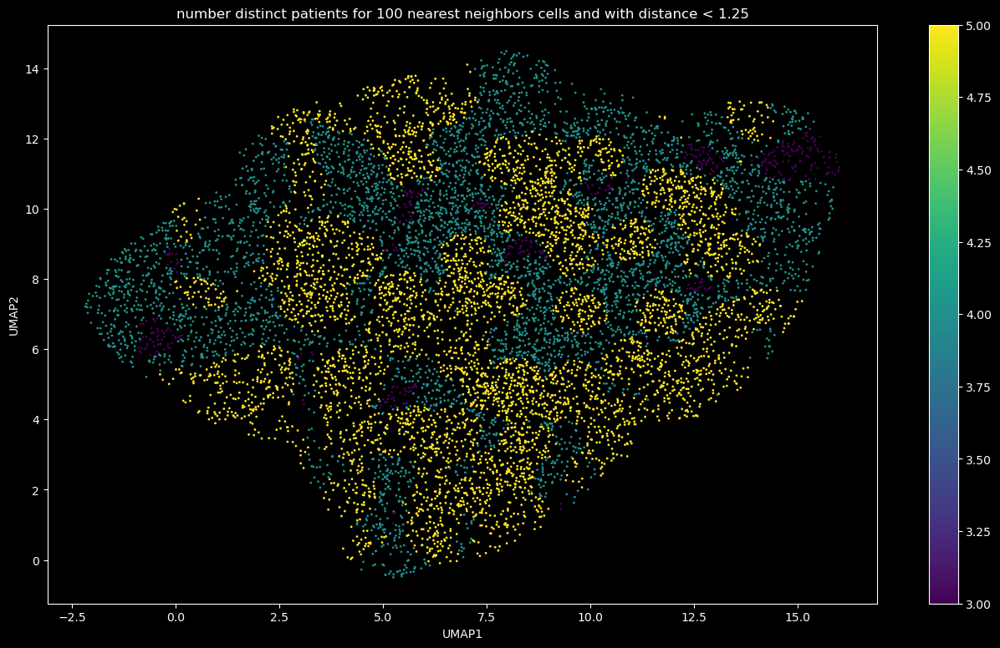

In [70]:
plt.style.use('dark_background')
plt.figure(figsize=(16, 9))
# plt.scatter(u[:, 0], u[:, 1], s=0.2, alpha=0.1, c='k')
plt.scatter(u[~bad_cells, 0], u[~bad_cells, 1], s=1, c=a[~bad_cells], cmap='viridis')
plt.title(f'number distinct patients for 100 nearest neighbors cells and with distance < {threshold0}')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.colorbar()
plt.show()
plt.style.use('default')

In [71]:
from tqdm import tqdm
list_of_counts = []
for i in tqdm(range(len(tumor_subtype_indices))):
    values, counts = np.unique(ma.compressed(tumor_subtype_indices[i, :]), return_counts=True)
    list_of_counts.append(counts)

100%|██████████| 10000/10000 [00:00<00:00, 38882.74it/s]


In [72]:
list_of_p = []
for l in tqdm(list_of_counts):
    probability_vector = l / np.sum(l)
    list_of_p.append(probability_vector)

100%|██████████| 10000/10000 [00:00<00:00, 163621.41it/s]


$$S = -\sum_{k}(p_k \log(p_k))$$

In [73]:
import scipy.stats

list_of_s = []
for p in tqdm(list_of_p):
    s = scipy.stats.entropy(p)
    list_of_s.append(s)
entropies = np.array(list_of_s)

100%|██████████| 10000/10000 [00:00<00:00, 112251.31it/s]


(10000,)


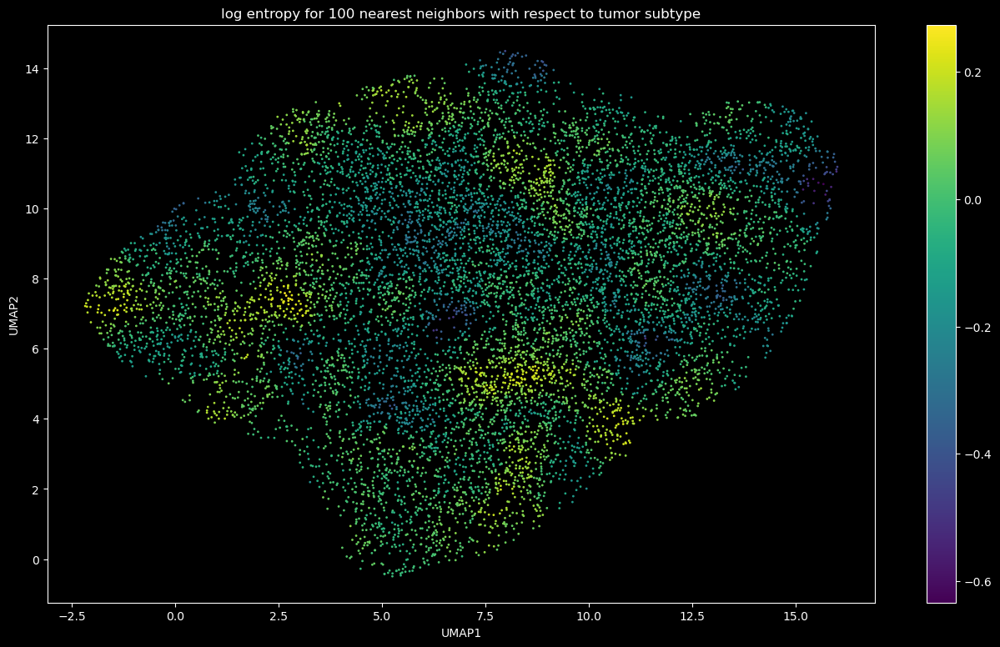

In [74]:
plt.style.use('dark_background')
print(entropies.shape)
plt.figure(figsize=(16, 9))
# plt.scatter(u[:, 0], u[:, 1], s=0.2, alpha=0.1, c='k')
plt.scatter(u[~bad_cells, 0], u[~bad_cells, 1], s=1, c=np.log(entropies[~bad_cells]), cmap='viridis')
plt.title(f'log entropy for 100 nearest neighbors with respect to tumor subtype')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.colorbar()
plt.show()
plt.style.use('default')

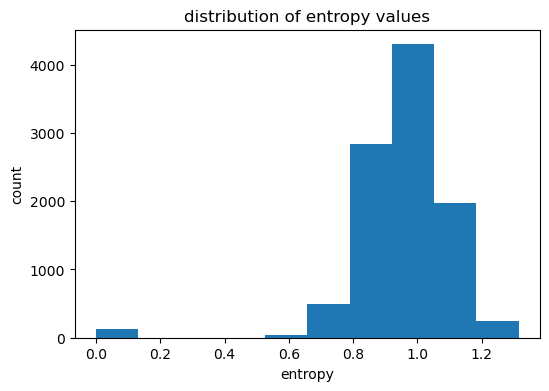

In [75]:
plt.figure(figsize=(6, 4))
plt.hist(entropies, bins=10)
plt.title(f'distribution of entropy values')
plt.xlabel('entropy')
plt.ylabel('count')
plt.show()

## Cohort

In [85]:
np.random.seed(2)
random_choice = np.random.choice(len(a), 10000, replace=False)

[ 10183 414150 334964 ... 254656 255184 409119]


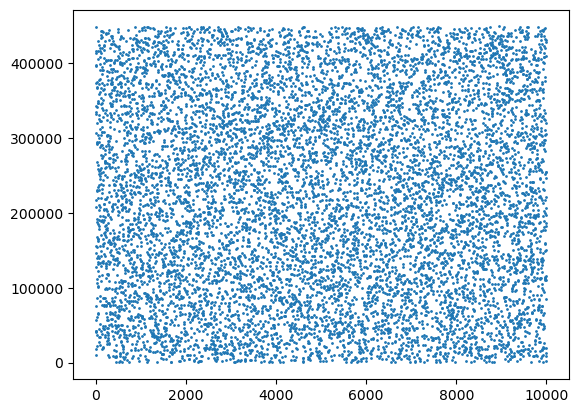

In [86]:
print(random_choice)
plt.scatter(np.arange(len(random_choice)), random_choice, s=1)

raw
(449434, 39)


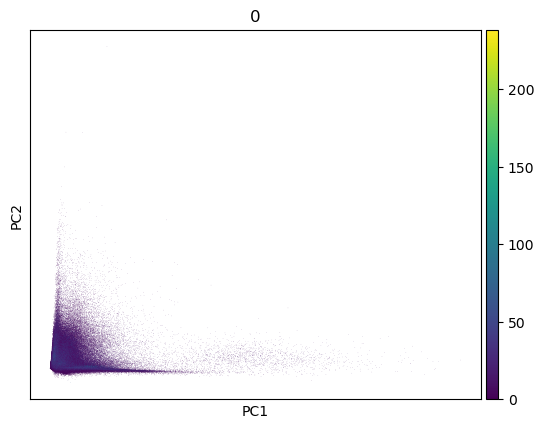

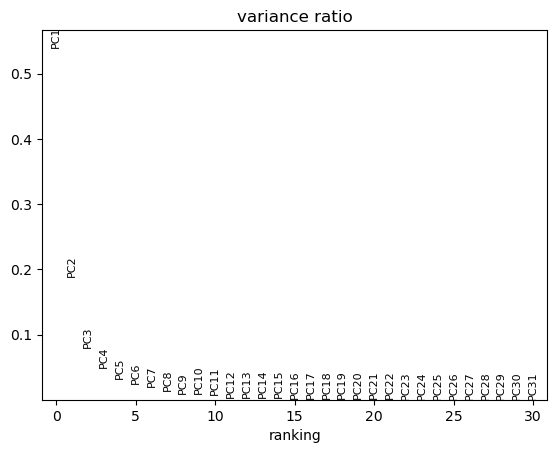

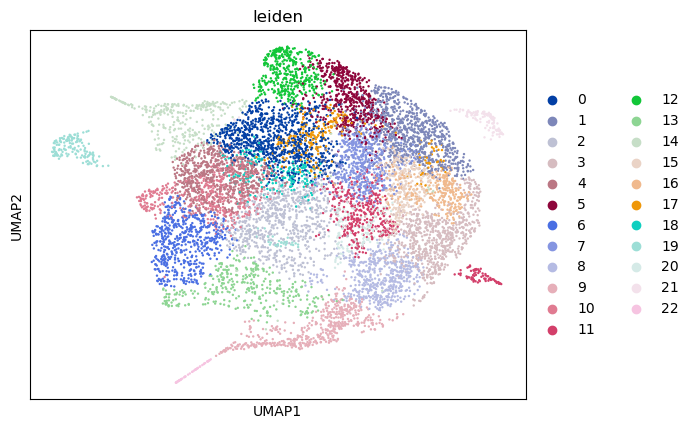

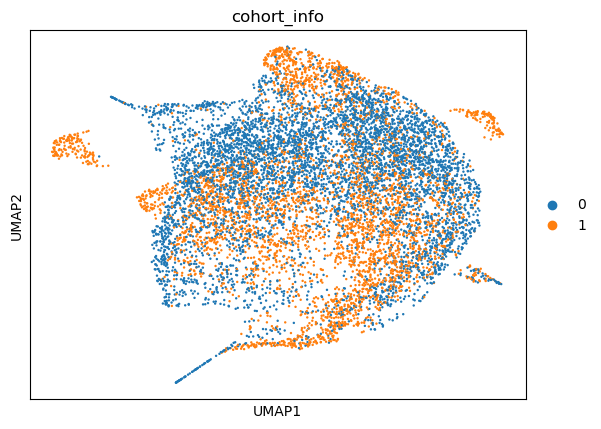

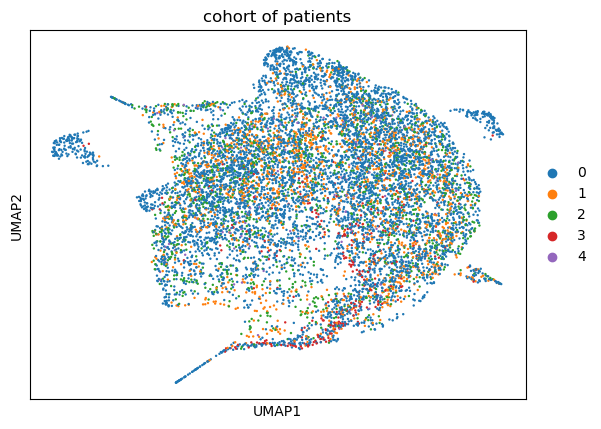

In [87]:
method = 'raw'
plt.style.use('default')
print(method)
print(expressions[method].shape)
a = q.adata[method]

sc.tl.pca(a, svd_solver='arpack')
sc.pl.pca(a, color='0')
sc.pl.pca_variance_ratio(a)
# sc.pl.pca_variance_ratio(a0, log=True)
b = a[random_choice, :].copy()
sc.pp.neighbors(b)
sc.tl.leiden(b)
sc.tl.umap(b)

def map_patient_metadata_to_cells(patient_metadata):
    l = []
    index_info_omes, index_info_begins, index_info_ends = pickle.load(open(file_path('merged_cells_info.pickle'), 'rb'))
    for ome_index in range(len(patient_metadata)):
        begin = index_info_begins[ome_index]
        end = index_info_ends[ome_index]
        v = patient_metadata[ome_index]
        l.append(np.repeat(v, end - begin))
    w = np.concatenate(l)
    return w

s = pd.Series(map_patient_metadata_to_cells(cohort_info)[random_choice], dtype='category')
s.index = b.obs.index
b.obs['cohort_info'] = s

s = pd.Series(map_patient_metadata_to_cells(tumor_info)[random_choice], dtype='category')
s.index = b.obs.index
b.obs['tumor_info'] = s

s = pd.Series(map_patient_metadata_to_cells(patient_of_origin)[random_choice], dtype='category')
s.index = b.obs.index
b.obs['patient_of_origin'] = s

sc.pl.umap(b, color='leiden')
sc.pl.umap(b, color='cohort_info')
sc.pl.umap(b, color='tumor_info', title='cohort of patients')

AnnData object with n_obs × n_vars = 10000 × 39
    obs: 'phenograph', 'leiden', 'cohort_info', 'tumor_info', 'patient_of_origin'
    uns: 'neighbors', 'pca', 'umap', 'leiden', 'leiden_colors', 'cohort_info_colors', 'tumor_info_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


Text(0.5, 1.0, 'cohort of patients')

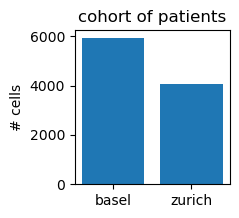

In [88]:
plt.figure(figsize=(2, 2))
x = np.unique(b.obs['cohort_info'].to_numpy(), return_counts=True)
print(b)
ax = plt.gca()
ax.set_xticks(np.arange(len(x[0])))
ax.set_xticklabels(['basel', 'zurich'])
ax.bar(x[0], x[1])
ax.set_ylabel('# cells')
ax.set_title('cohort of patients')

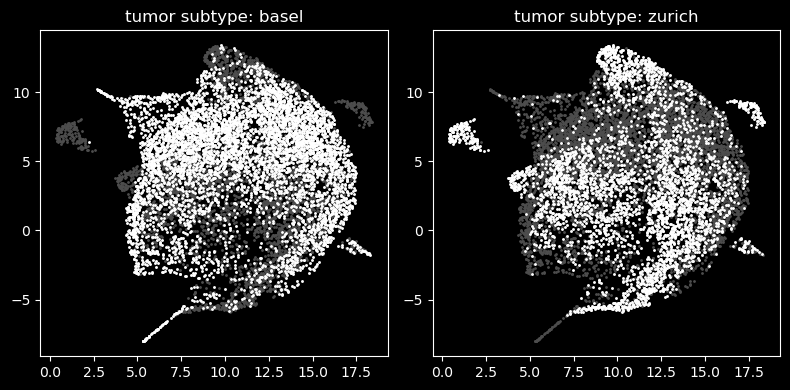

In [90]:
n = len(x[0])
plt.style.use('dark_background')
axes = plt.subplots(1, 2, figsize=(8, 4))[1].flatten()
for i in range(n):
    c = b.obs['cohort_info']
    u = b.obsm['X_umap']
    axes[i].scatter(u[:, 0], u[:, 1], color=(0.3, 0.3, 0.3), s=1)
    axes[i].scatter(u[c == i, 0], u[c == i, 1], c='w', s=1)
    COHORTS = ['basel', 'zurich']
    axes[i].set_title(f'tumor subtype: {COHORTS[i]}')
plt.tight_layout()
plt.show()
plt.style.use('default')

(10000, 2)
(10000, 100)
(10000, 100)


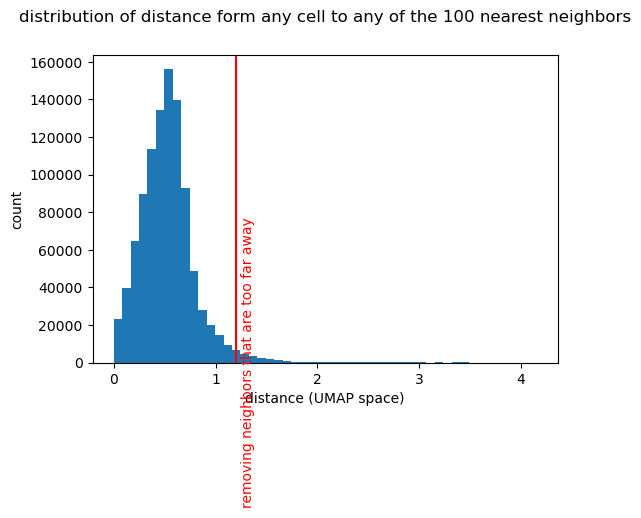

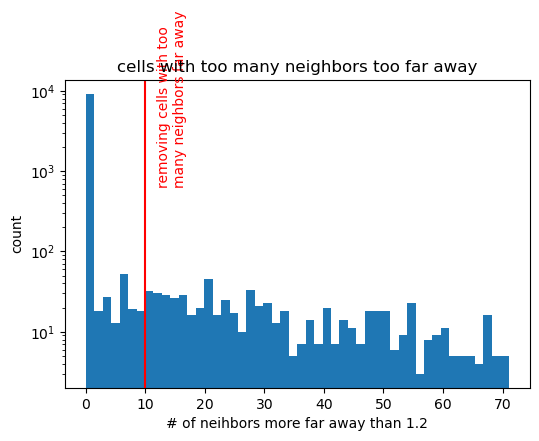

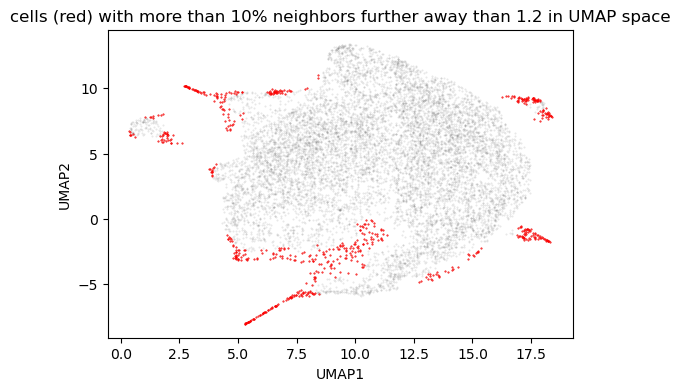

[(0, 0, 2691), (1, 2691, 6247), (2, 6247, 9277), (3, 9277, 11993), (4, 11993, 14690), (5, 14690, 17183), (6, 17183, 20731), (7, 20731, 23361), (8, 23361, 25206), (9, 25206, 27578)]
cell_index = 0, found = 0, passed 
cell_index = 1, found = 0, passed 
cell_index = 2, found = 0, passed 
cell_index = 2689, found = 0, passed 
cell_index = 2690, found = 0, passed 
cell_index = 2691, found = 1, passed 
cell_index = 2692, found = 1, passed 
cell_index = 6246, found = 1, passed 
cell_index = 6247, found = 2, passed 
[[10183 146841 264212 ... 10297 258277 11791]
 [414150 394581 164216 ... 415560 378126 445141]
 [334964 416458 333616 ... 94045 414205 337094]
 ...
 [254656 248875 219554 ... 76157 202985 240469]
 [255184 437311 247886 ... 417511 245647 418222]
 [409119 74318 410744 ... 176858 410639 277097]]
449219
(10000, 100)
226


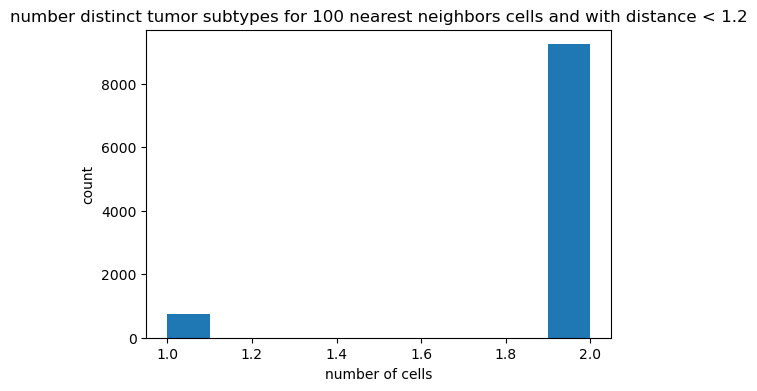

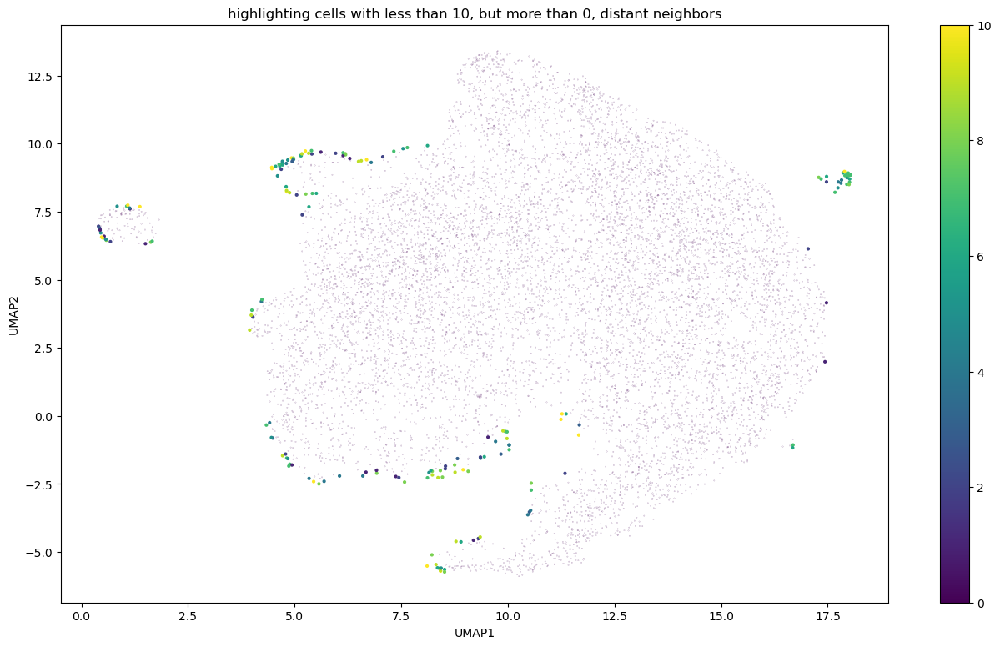

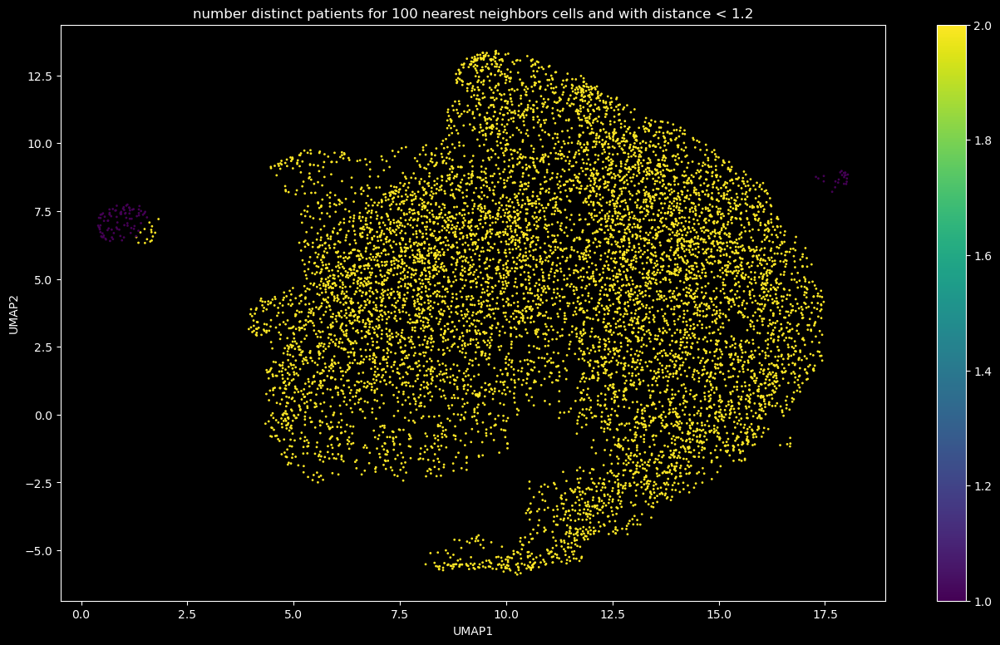

100%|██████████| 10000/10000 [00:00<00:00, 116714.97it/s]
<timed exec>:167: RuntimeWarning: divide by zero encountered in log


(10000,)
min, max -inf -0.36651292058166435


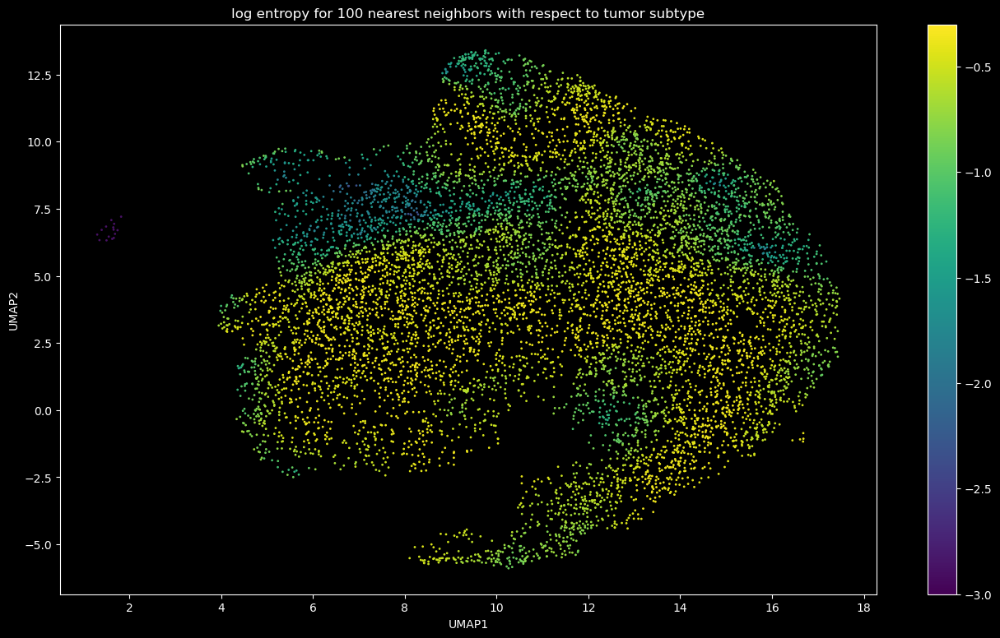

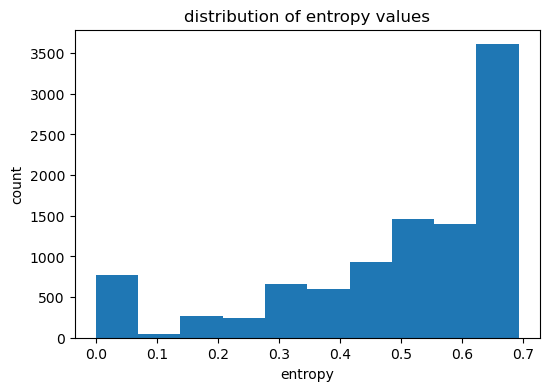

median entropy: 0.5623351446188083
CPU times: user 4.1 s, sys: 325 ms, total: 4.42 s
Wall time: 4.04 s


In [91]:
%%time
print(u.shape)
from sklearn.neighbors import NearestNeighbors
neighbors = NearestNeighbors(n_neighbors=100, algorithm='ball_tree').fit(u)
distances, indices = neighbors.kneighbors(u)

print(distances.shape)
print(indices.shape)


threshold0 = 1.2
plt.figure(figsize=(6, 4))
plt.hist(distances.flatten(), bins=50)
plt.title('distribution of distance form any cell to any of the 100 nearest neighbors', y=1.08)
plt.xlabel('distance (UMAP space)')
plt.ylabel('count')
plt.axvline(x=threshold0, c='r')
plt.text(threshold0 + 0.05, 0, f'removing neighbors that are too far away',rotation=90, c='r', verticalalignment='center', fontsize=10)
plt.show()

too_far = distances > threshold0
too_far_per_cell = np.sum(too_far, axis=1)
plt.figure(figsize=(6, 4))
plt.hist(too_far_per_cell, bins=50)
plt.yscale('log')
plt.title('cells with too many neighbors too far away')
plt.xlabel(f'# of neihbors more far away than {threshold0}')
plt.ylabel('count')
threshold1 = 10
plt.axvline(x=threshold1, c='r')
plt.text(threshold1+ 2, 8e3, f'removing cells with too\nmany neighbors far away',rotation=90, c='r', verticalalignment='center', fontsize=10)
plt.show()
bad_cells = too_far_per_cell > threshold1
filtered_indices = indices.copy().astype(np.float)
filtered_indices[too_far] = np.nan
filtered_indices[bad_cells, :] = np.nan

plt.figure(figsize=(6, 4))
plt.scatter(u[:, 0], u[:, 1], s=0.2, alpha=0.1, c='k')
plt.scatter(u[bad_cells, 0], u[bad_cells, 1], s=0.2, c='r')
plt.title(f'cells (red) with more than {threshold1}% neighbors further away than {threshold0} in UMAP space')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.show()


import bisect
index_info_omes, index_info_begins, index_info_ends = pickle.load(open(file_path('merged_cells_info.pickle'), 'rb'))

def cell_index_to_patient_index(cell_index):
    found = bisect.bisect_right(index_info_begins, cell_index) - 1
#     print(index_info_begins[found - 1], index_info_ends[found - 1])
#     print(index_info_begins[found], index_info_ends[found])
#     print(index_info_begins[found + 1], index_info_ends[found + 1])
    return found

print(list(zip(range(10), index_info_begins[:10], index_info_ends[:10])))
tests = [
    (0, 0),
    (1, 0),
    (2, 0),
    (2689, 0),
    (2690, 0),
    (2691, 1),
    (2692, 1),
    (6246, 1),
    (6247, 2)
]
for my_input, my_solution in tests:
    found = cell_index_to_patient_index(my_input)
    print(f'cell_index = {my_input}, found = {found}', end='')
    print(', passed ' if found == my_solution else f', expected {my_solution}, NOT passed')



def filtered_cell_index_to_full_cell_index(i):
    if np.isnan(i):
        return -1
    else:
        assert not np.isnan(i)
        ii = int(i)
        return random_choice[ii]
fixed = np.vectorize(filtered_cell_index_to_full_cell_index)(filtered_indices)


invalid = fixed == -1
import numpy.ma as ma
y = ma.array(fixed, mask=invalid)
print(y)
cohorts = map_patient_metadata_to_cells(cohort_info)
cohorts_indices = cohorts[y]
# patient_indices = np.vectorize(cell_index_to_patient_index)(y)
# print(y.count())
# print(np.prod(y.shape))


print(y.max())



print(cohorts_indices.shape)
print(len(index_info_omes))

a = np.apply_along_axis(lambda x: len(np.unique(x)), 1, cohorts_indices) 


plt.figure(figsize=(6, 4))
plt.hist(a, bins=10)
plt.title(f'number distinct tumor subtypes for 100 nearest neighbors cells and with distance < {threshold0}')
plt.xlabel('number of cells')
plt.ylabel('count')
plt.show()


plt.figure(figsize=(16, 9))
# plt.scatter(u[:, 0], u[:, 1], s=0.2, alpha=0.1, c='k')
x = too_far_per_cell[~bad_cells]
sizes = np.ones_like(x) * 0.01
sizes[x > 0] = 4
cmap = matplotlib.cm.viridis
# colors = np.zeros_like(x)
plt.scatter(u[~bad_cells, 0], u[~bad_cells, 1], c=too_far_per_cell[~bad_cells], s=sizes)
# plt.title(f'cells (red) with more than {threshold1 * 100}% neighbors further away than {threshold0} in UMAP space')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.title(f'highlighting cells with less than {threshold1}, but more than 0, distant neighbors')
plt.colorbar()
plt.show()


plt.style.use('dark_background')
plt.figure(figsize=(16, 9))
# plt.scatter(u[:, 0], u[:, 1], s=0.2, alpha=0.1, c='k')
plt.scatter(u[~bad_cells, 0], u[~bad_cells, 1], s=1, c=a[~bad_cells], cmap='viridis')
plt.title(f'number distinct patients for 100 nearest neighbors cells and with distance < {threshold0}')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.colorbar()
plt.show()
plt.style.use('default')


from tqdm import tqdm
list_of_counts = []
for i in tqdm(range(len(cohorts_indices))):
    values, counts = np.unique(ma.compressed(cohorts_indices[i, :]), return_counts=True)
    list_of_counts.append(counts)


list_of_p = []
for l in tqdm(list_of_counts):
    probability_vector = l / np.sum(l)
    list_of_p.append(probability_vector)

import scipy.stats

list_of_s = []
for p in tqdm(list_of_p):
    s = scipy.stats.entropy(p)
    list_of_s.append(s)
entropies = np.array(list_of_s)


plt.style.use('dark_background')
print(entropies.shape)
plt.figure(figsize=(16, 9))
# plt.scatter(u[:, 0], u[:, 1], s=0.2, alpha=0.1, c='k')
e = np.log(entropies[~bad_cells])
plt.scatter(u[~bad_cells, 0], u[~bad_cells, 1], s=1, c=e, cmap='viridis')
plt.title(f'log entropy for 100 nearest neighbors with respect to tumor subtype')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.colorbar()
plt.clim([-3, -0.3])
print('min, max', np.min(e), np.max(e))
plt.show()
plt.style.use('default')


plt.figure(figsize=(6, 4))
plt.hist(entropies, bins=10)
plt.title(f'distribution of entropy values')
plt.xlabel('entropy')
plt.ylabel('count')
plt.show()
print('median entropy:', np.median(entropies))

# Per cluster entropy

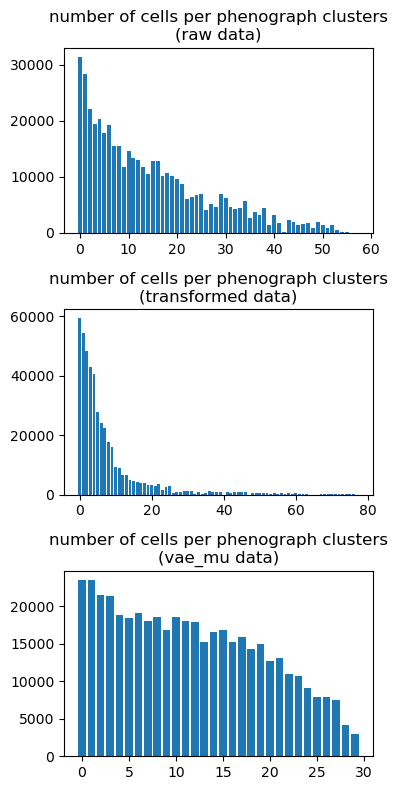

In [92]:
plt.figure(figsize=(4, 8))
i = 1
for method in ['raw', 'transformed', 'vae_mu']:
    plt.subplot(3, 1, i)
    plt.bar(*np.unique(q.phenographs[method], return_counts=True))
    plt.title(f'number of cells per phenograph clusters\n({method} data)')
    i += 1
plt.tight_layout()
plt.show()

In [93]:
import bisect
index_info_omes, index_info_begins, index_info_ends = pickle.load(open(file_path('merged_cells_info.pickle'), 'rb'))

def cell_index_to_patient_index(cell_index):
    found = bisect.bisect_right(index_info_begins, cell_index) - 1
    return found

print(list(zip(range(10), index_info_begins[:10], index_info_ends[:10])))
tests = [
    (0, 0),
    (1, 0),
    (2, 0),
    (2689, 0),
    (2690, 0),
    (2691, 1),
    (2692, 1),
    (6246, 1),
    (6247, 2)
]
for my_input, my_solution in tests:
    found = cell_index_to_patient_index(my_input)
    print(f'cell_index = {my_input}, found = {found}', end='')
    print(', passed ' if found == my_solution else f', expected {my_solution}, NOT passed')

[(0, 0, 2691), (1, 2691, 6247), (2, 6247, 9277), (3, 9277, 11993), (4, 11993, 14690), (5, 14690, 17183), (6, 17183, 20731), (7, 20731, 23361), (8, 23361, 25206), (9, 25206, 27578)]
cell_index = 0, found = 0, passed 
cell_index = 1, found = 0, passed 
cell_index = 2, found = 0, passed 
cell_index = 2689, found = 0, passed 
cell_index = 2690, found = 0, passed 
cell_index = 2691, found = 1, passed 
cell_index = 2692, found = 1, passed 
cell_index = 6246, found = 1, passed 
cell_index = 6247, found = 2, passed 


In [94]:
all_m = dict()

number of cells per cluster belonging to a specific patient ($\mathbf{raw\ data}$)


/data/l989o/miniconda3/envs/spatial_uzh_test/lib/python3.8/site-packages/seaborn/matrix.py:659: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


number of cells per cluster belonging to a specific patient ($\mathbf{raw\ data, rearranged}$)


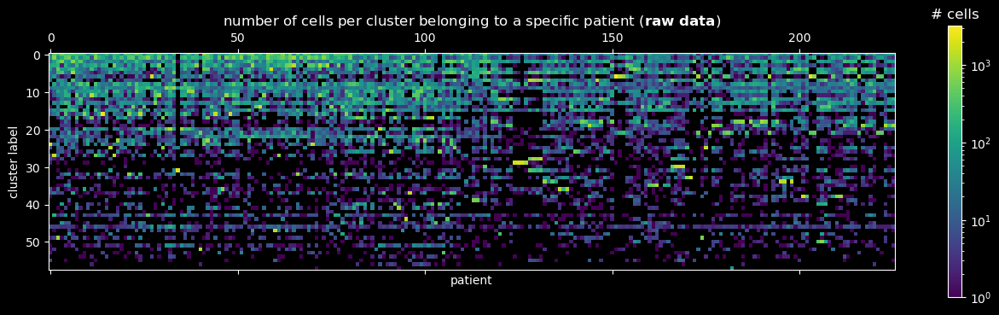

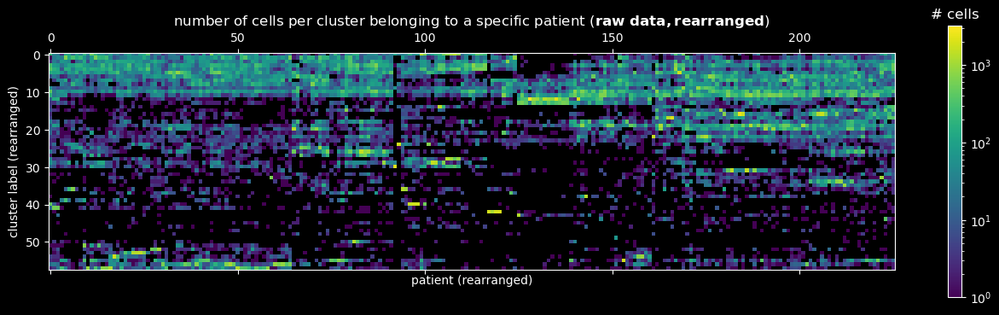

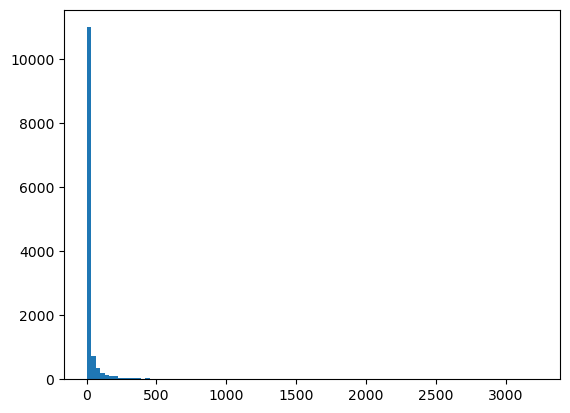

number of cells per cluster belonging to a specific patient ($\mathbf{transformed\ data}$)


/data/l989o/miniconda3/envs/spatial_uzh_test/lib/python3.8/site-packages/seaborn/matrix.py:659: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


number of cells per cluster belonging to a specific patient ($\mathbf{transformed\ data, rearranged}$)


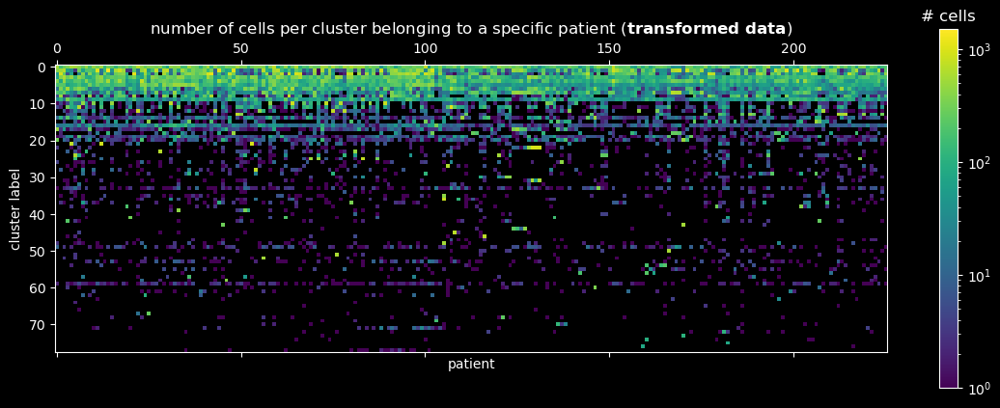

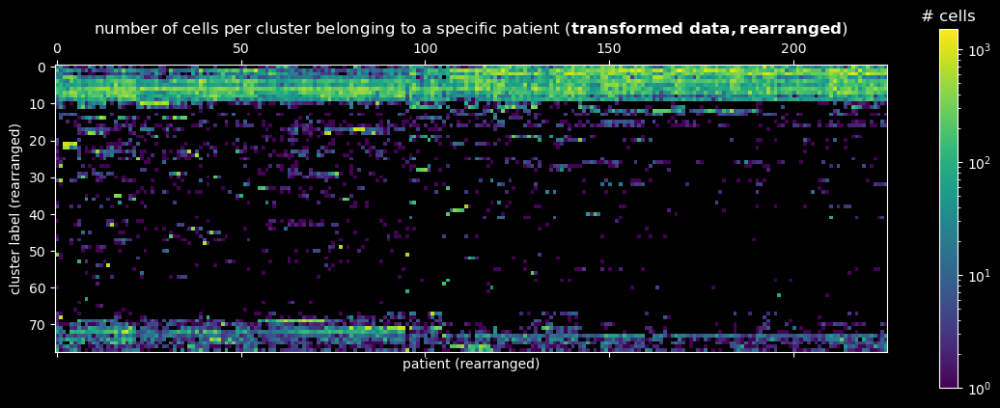

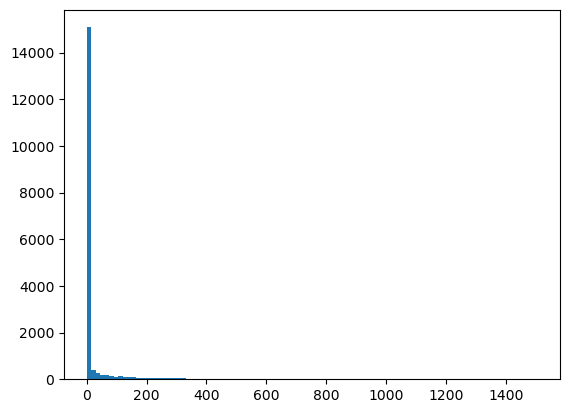

number of cells per cluster belonging to a specific patient ($\mathbf{vae\_mu\ data}$)
number of cells per cluster belonging to a specific patient ($\mathbf{vae\_mu\ data, rearranged}$)


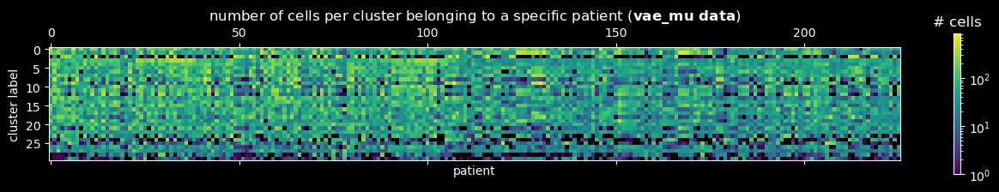

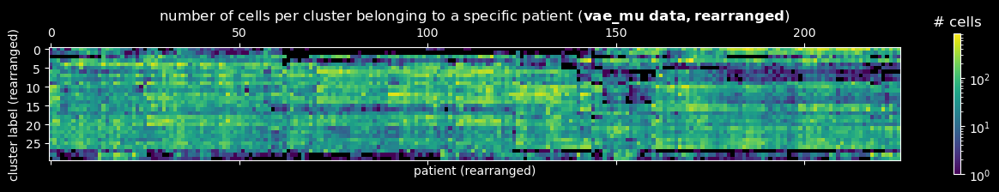

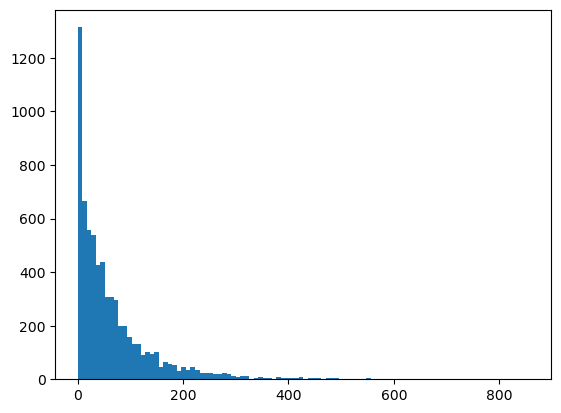

In [95]:
for method in ['raw', 'transformed', 'vae_mu']:
    p = q.phenographs[method]
    cells_per_cluster = dict()
    cluster_labels = np.unique(p)
    for c in cluster_labels:
        w = np.where(p == c)[0]
        cells_per_cluster[c] = w

    patients_per_cluster = dict()
    for c, w in cells_per_cluster.items():
        y = np.vectorize(cell_index_to_patient_index)(w)
        patients_per_cluster[c] = y
        
    plt.style.use('dark_background')
    m = np.zeros((len(cluster_labels), len(index_info_omes)), dtype=int)
    for k, v in patients_per_cluster.items():
        a, b = np.unique(v, return_counts=True)
        for i in range(len(a)):
            m[k, a[i]] = b[i]
    all_m[method] = m
    
    plt.matshow(m, norm=matplotlib.colors.LogNorm())
    cbar = plt.colorbar()
    ss = '\\_'
    s = f'number of cells per cluster belonging to a specific patient ($\\mathbf{{{method.replace("_", ss)}\ data}}$)'
    print(s)
    plt.rc('text', usetex=True)
    plt.title(s)
    plt.rc('text', usetex=False)
    plt.xlabel('patient')
    plt.ylabel('cluster label')
    cbar.ax.set_title('# cells')
    plt.style.use('default')
    
    df = pd.DataFrame(np.log(m + 0.1))
    a = sns.clustermap(df)
    plt.close()

    plt.style.use('dark_background')
    rows = a.data2d.index.to_numpy()
    cols = a.data2d.columns.to_numpy()

#     plt.figure()
    plt.matshow(m[rows][:, cols], norm=matplotlib.colors.LogNorm())
    ss = '\\_'
    s = f'number of cells per cluster belonging to a specific patient ($\\mathbf{{{method.replace("_", ss)}\ data, rearranged}}$)'
    print(s)
    plt.rc('text', usetex=True)
    plt.title(s)
    plt.rc('text', usetex=False)
    plt.xlabel('patient (rearranged)')
    plt.ylabel('cluster label (rearranged)')
    cbar = plt.colorbar()
    cbar.ax.set_title('# cells')
    plt.style.use('default')
    plt.savefig(f'/data/l989o/a/{method}.png', bbox_inches='tight')
    plt.show()
    
    plt.figure()
    plt.hist(m.flatten(), bins=100)
    plt.show()

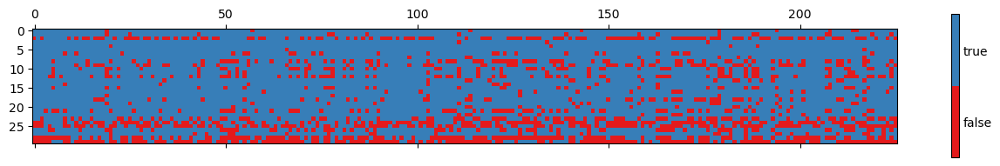

In [96]:
n = 2
cmap = matplotlib.colors.LinearSegmentedColormap.from_list(None, plt.cm.Set1(range(0, n)), n)
plt.matshow(m > 10, cmap=cmap)
plt.clim(-0.5, n - 0.5)
cbar = plt.colorbar(ticks=range(n))
cbar.ax.tick_params(length=0)
cbar.set_ticklabels(['false', 'true'])

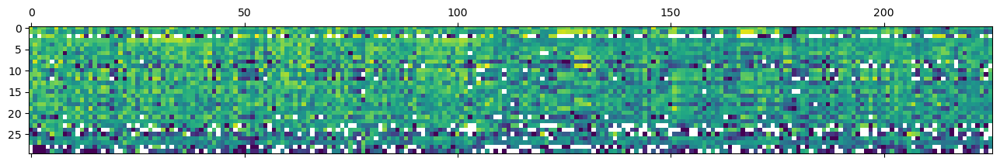

In [97]:
plt.matshow(m, norm=matplotlib.colors.LogNorm())

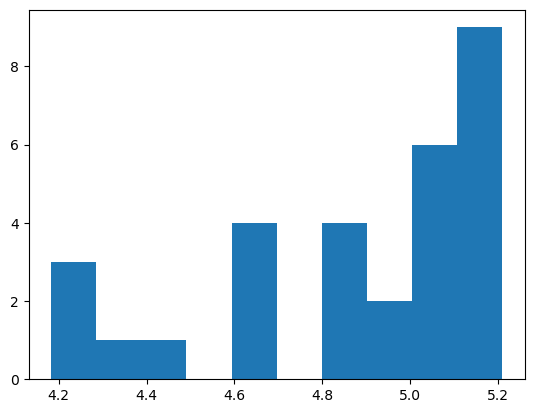

(array([ 5.,  8., 16., 15., 19., 41., 37., 41., 30., 14.]),
 array([2.49364941, 2.55950573, 2.62536204, 2.69121836, 2.75707468,
        2.82293099, 2.88878731, 2.95464363, 3.02049994, 3.08635626,
        3.15221258]),
 <BarContainer object of 10 artists>)

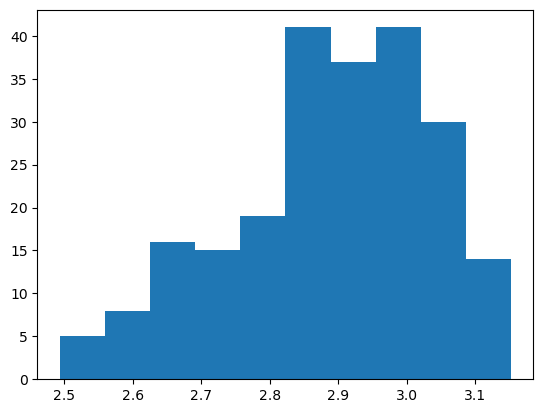

In [98]:
plt.hist(np.apply_along_axis(scipy.stats.entropy, 1, m))
plt.show()
plt.hist(np.apply_along_axis(scipy.stats.entropy, 0, m))

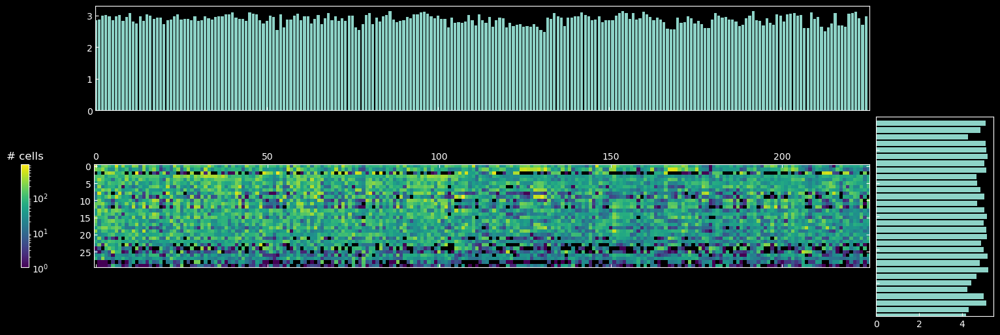

In [100]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

plt.style.use('dark_background')

# definitions for the axes
left, width = 0.1, 0.65
bottom, height = 0.1, 0.65
spacing = 0.005

left_padding = 0.057
width1 = 0.5928
height1 = 0.5225

bottom2 = 0.2325
height2 = 0.3825
width2 = height1

rect0 = [left, bottom, width, height]
rect1 = [left + left_padding, bottom + height1 + spacing, width1, 0.2]
rect2 = [left + width + spacing, bottom2, 0.09, height2]

# start with a rectangular Figure
fig = plt.figure(figsize=(20, 8))

ax0 = plt.axes(rect0)
ax0.tick_params(direction='in', top=True, right=True)
ax1 = plt.axes(rect1)
ax1.tick_params(direction='in', labelbottom=False)
ax2 = plt.axes(rect2)
ax2.tick_params(direction='in', labelleft=False)

im = ax0.matshow(m, norm=matplotlib.colors.LogNorm())

divider = make_axes_locatable(ax0)
cax = divider.append_axes('left', size='1%', pad=1)
cbar = fig.colorbar(im, cax=cax)
# cbar.set_lim(-0.5, n - 0.5)
cbar.ax.tick_params(length=0)
# cbar.set_ticks([0.25, 0.75])
# cbar.set_ticklabels([f'<= {t}', f'> {t}'])
cbar.ax.set_title('# cells')

# divider = make_axes_locatable(ax)
# cax = divider.append_axes('right', size='95%', pad=0)
ax1.bar(np.arange(m.shape[1]), np.apply_along_axis(scipy.stats.entropy, 0, m))
ax1.set_xlim([0, m.shape[1]])

# divider = make_axes_locatable(ax)
# cax = divider.append_axes('bottom', size='95%', pad=0)
ax2.barh(np.arange(m.shape[0])[::-1], np.apply_along_axis(scipy.stats.entropy, 1, m), orientation='horizontal')
ax2.set_ylim([0, m.shape[0]])

plt.savefig('/data/l989o/a/so.png')
plt.style.use('default')

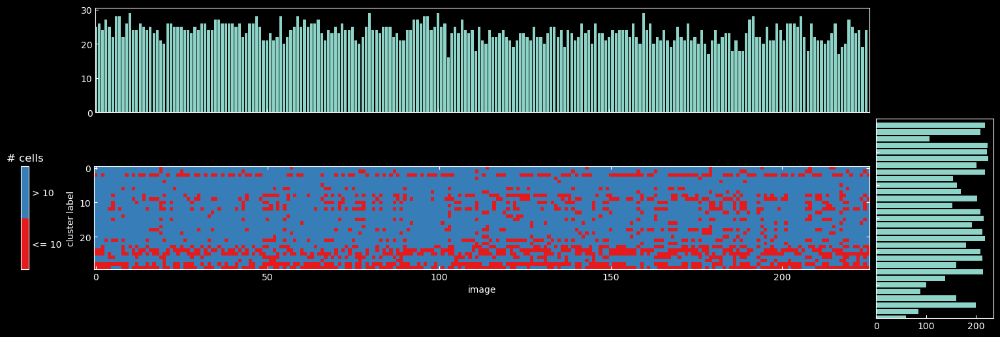

In [101]:
# from mpl_toolkits.axes_grid1 import make_axes_locatable
import functools

plt.style.use('dark_background')
# m = np.random.rand(58, 226) * 20
# definitions for the axes
left, width = 0.1, 0.65
bottom, height = 0.1, 0.65
spacing = 0.005

left_padding = 0.057
width1 = 0.5928
height1 = 0.5225

bottom2 = 0.2325
height2 = 0.3825
width2 = height1

rect0 = [left, bottom, width, height]
rect1 = [left + left_padding, bottom + height1 + spacing, width1, 0.2]
rect2 = [left + width + spacing, bottom2, 0.09, height2]

# start with a rectangular Figure
fig = plt.figure(figsize=(20, 8))

ax0 = plt.axes(rect0)
ax0.tick_params(direction='in', top=True, right=True)
ax1 = plt.axes(rect1)
ax1.tick_params(direction='in', labelbottom=False)
ax2 = plt.axes(rect2)
ax2.tick_params(direction='in', labelleft=False)

t = 10
n = 2
cmap = matplotlib.colors.LinearSegmentedColormap.from_list(None, plt.cm.Set1(range(0, n)), n)
im = ax0.imshow(m > t, cmap=cmap)
ax0.set_xlabel('image')
ax0.set_ylabel('cluster label')

divider = make_axes_locatable(ax0)
cax = divider.append_axes('left', size='1%', pad=1)
cbar = fig.colorbar(im, ticks=range(n), cax=cax)
# cbar.set_lim(-0.5, n - 0.5)
cbar.ax.tick_params(length=0)
cbar.set_ticks([0.25, 0.75])
cbar.set_ticklabels([f'<= {t}', f'> {t}'])
cbar.ax.set_title('# cells')

# divider = make_axes_locatable(ax)
# cax = divider.append_axes('right', size='95%', pad=0)
def sum_treshold(v, threshold):
    return np.sum(v > threshold)
ax1.bar(np.arange(m.shape[1]), np.apply_along_axis(functools.partial(sum_treshold, threshold=t), 0, m))
ax1.set_xlim([0, m.shape[1]])

# divider = make_axes_locatable(ax)
# cax = divider.append_axes('bottom', size='95%', pad=0)
ax2.barh(np.arange(m.shape[0])[::-1], np.apply_along_axis(functools.partial(sum_treshold, threshold=t), 1, m), orientation='horizontal')
ax2.set_ylim([0, m.shape[0]])

plt.savefig('/data/l989o/a/so.png')
plt.style.use('default')

In [102]:
m = all_m['transformed']
e = np.apply_along_axis(scipy.stats.entropy, 1, m)
print(e)
np.min(e), np.max(e)

[5.2471217  4.84045155 4.75985205 5.20032079 5.20303428 5.08785619
 4.88646599 4.80173411 4.46467229 5.1417783  3.37607555 4.04426674
 3.08512844 3.02941881 4.05857632 3.3988531  4.73539152 3.2924324
 3.17146331 4.06020151 3.63258663 1.85083105 1.54734125 1.70730799
 2.40989543 1.87493758 1.60267168 1.00479983 1.11089757 2.38318193
 1.67229789 1.19943182 2.6211089  3.12696519 2.09411321 1.20913639
 1.07247761 2.13176772 1.45314208 1.14974833 1.8950691  1.37840009
 1.34067715 0.68071823 1.10020454 0.10579859 0.11970832 2.92475413
 0.92657023 3.96590708 0.46723307 0.214617   0.43525538 3.84724868
 1.40314107 3.17731336 1.15457856 1.48134836 0.44227139 4.62023772
 0.52401143 2.64049021 1.36494743 0.65402486 0.63651417 1.66746193
 1.09861229 0.31522285 0.53615526 0.09901089 0.83668765 2.66724264
 0.72111447 0.05217199 0.32650603 0.         0.06719688 2.71296217]


(0.0, 5.247121699415021)

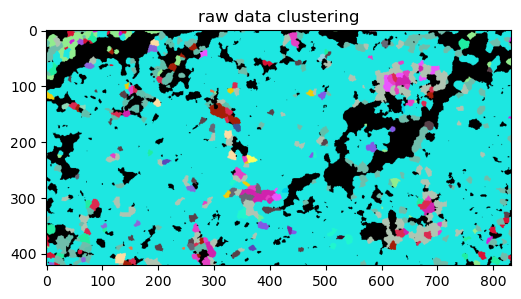

[0.14618463 1.10478864 2.06339265 3.02199665 3.98060066 4.93920467] ['0.15', '1.10', '2.06', '3.02', '3.98', '4.94']


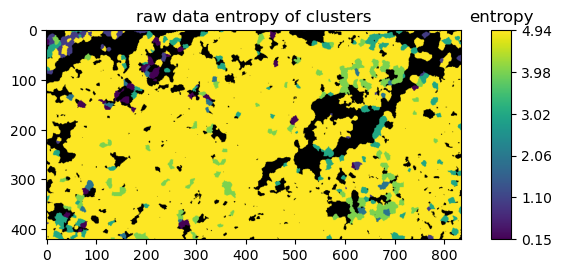

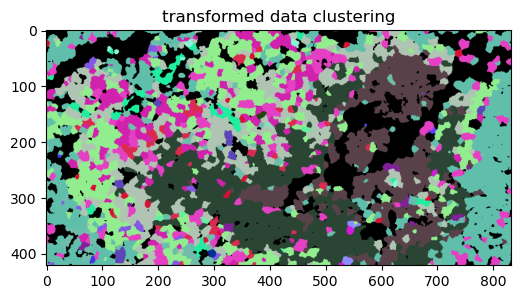

[0.         1.04942434 2.09884868 3.14827302 4.19769736 5.2471217 ] ['0.00', '1.05', '2.10', '3.15', '4.20', '5.25']


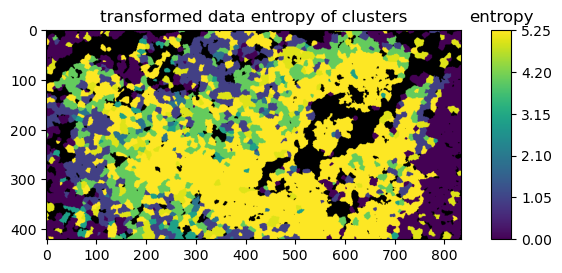

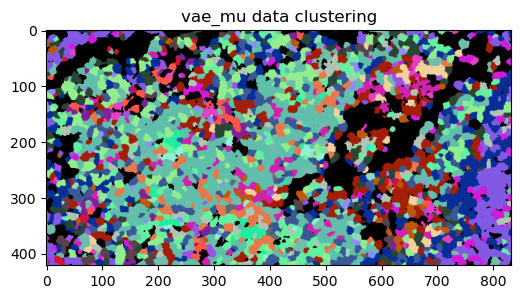

[4.18312242 4.38817453 4.59322663 4.79827874 5.00333085 5.20838296] ['4.18', '4.39', '4.59', '4.80', '5.00', '5.21']


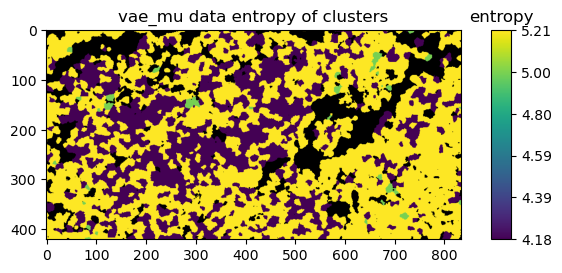

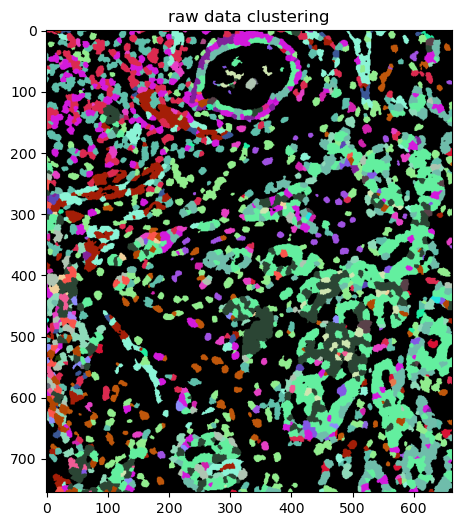

[0.14618463 1.10478864 2.06339265 3.02199665 3.98060066 4.93920467] ['0.15', '1.10', '2.06', '3.02', '3.98', '4.94']


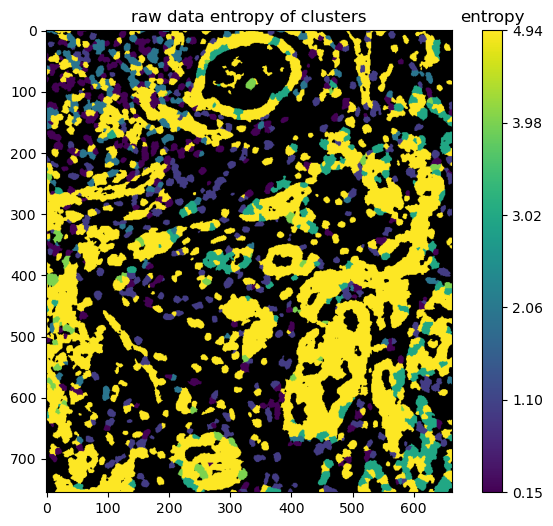

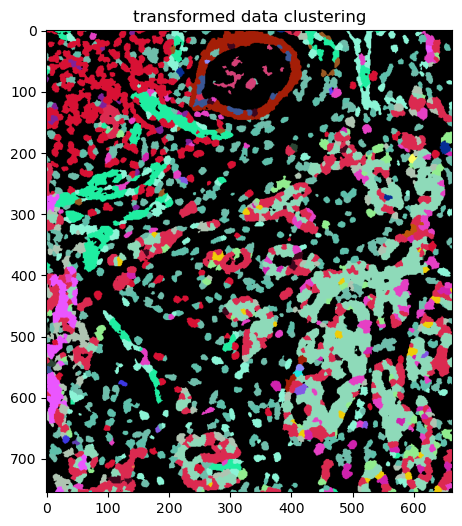

[0.         1.04942434 2.09884868 3.14827302 4.19769736 5.2471217 ] ['0.00', '1.05', '2.10', '3.15', '4.20', '5.25']


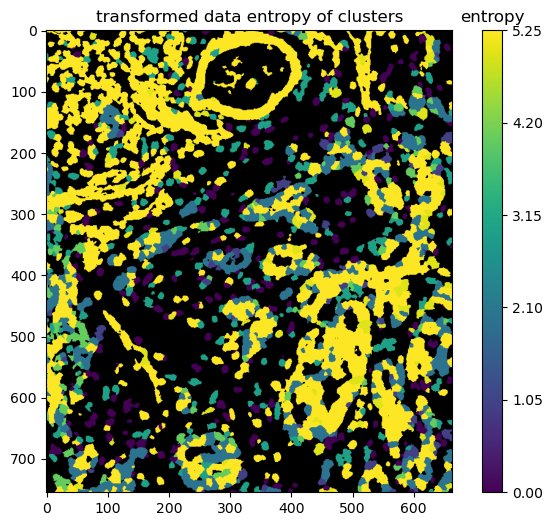

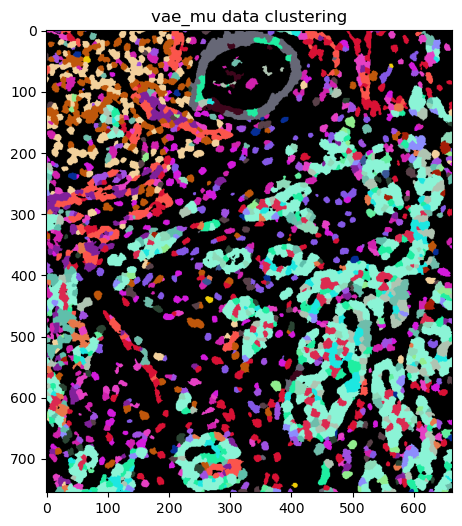

[4.18312242 4.38817453 4.59322663 4.79827874 5.00333085 5.20838296] ['4.18', '4.39', '4.59', '4.80', '5.00', '5.21']


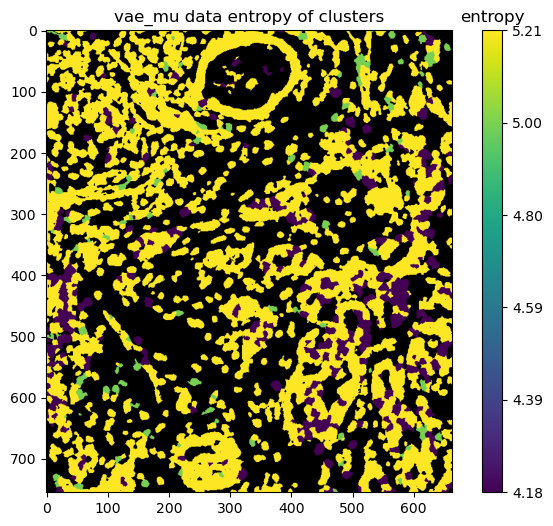

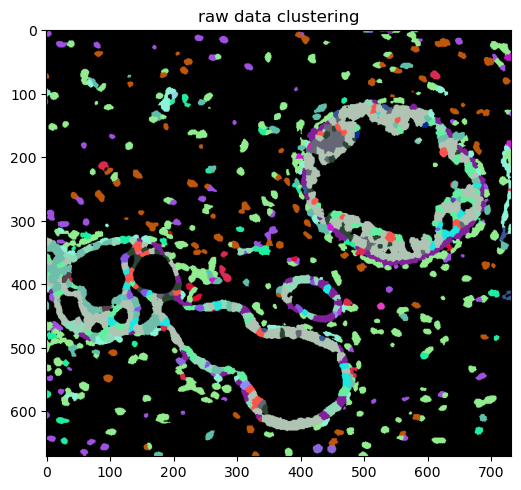

[0.14618463 1.10478864 2.06339265 3.02199665 3.98060066 4.93920467] ['0.15', '1.10', '2.06', '3.02', '3.98', '4.94']


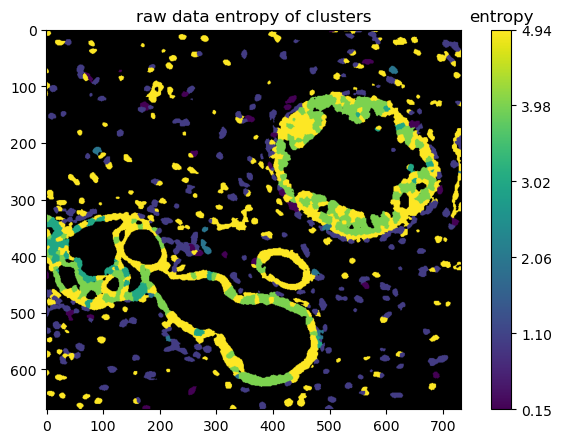

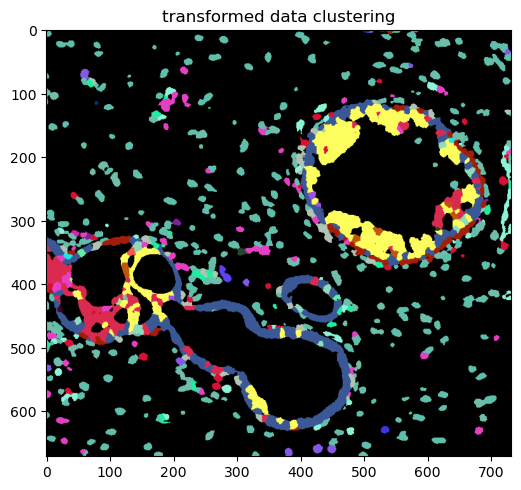

[0.         1.04942434 2.09884868 3.14827302 4.19769736 5.2471217 ] ['0.00', '1.05', '2.10', '3.15', '4.20', '5.25']


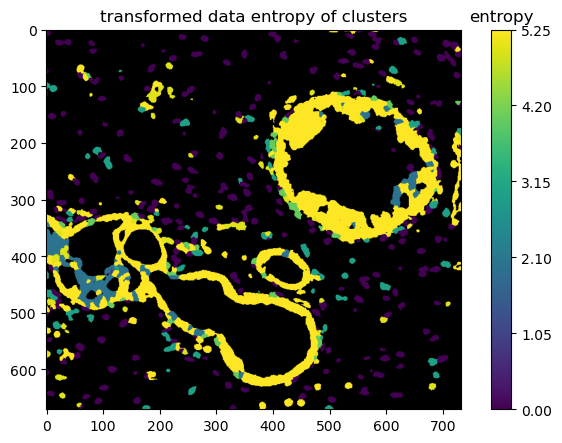

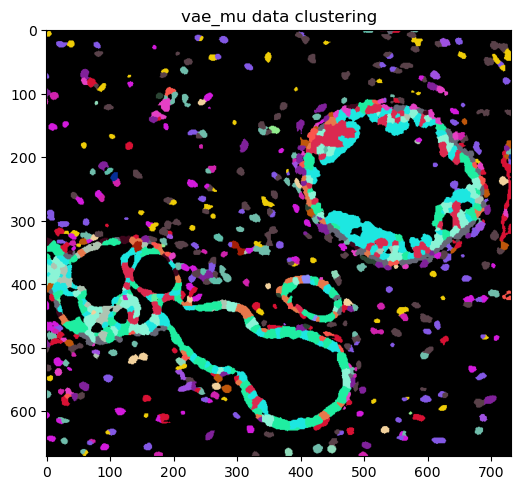

[4.18312242 4.38817453 4.59322663 4.79827874 5.00333085 5.20838296] ['4.18', '4.39', '4.59', '4.80', '5.00', '5.21']


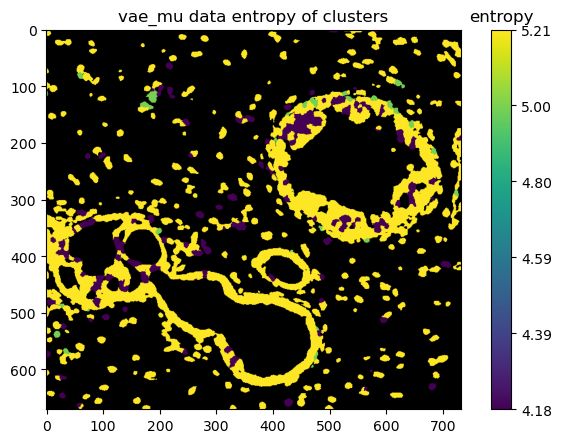

In [107]:
import math
masks_ds_train = MasksDataset('train')

for ome_index in [0, 7, 19]:  # 120
    for method in ['raw', 'transformed', 'vae_mu']:
        begin = index_info_begins[ome_index]
        end = index_info_ends[ome_index]
        ome_filename = masks_ds_train.filenames[ome_index]
        masks = masks_ds_train[ome_index]
        d = get_filtered_labels_mapping(ome_index, ome_filename, 'train')

        p = q.phenographs[method]
        plt.figure(figsize=(6, 6))
        new_masks = np.ones((masks.shape[0], masks.shape[1], 4))
        omitted_labels = set(list(range(np.max(masks)))).difference([dd.item() for dd in d.values()]).difference({0})
        for l in omitted_labels:
            new_masks[masks == l, :] = (0., 0., 0., 1.)
        new_masks[masks == 0, :] = (0., 0., 0., 1.)
        for k, v in d.items():
            new_masks[masks == v.item(), :3] = random_colors[p[begin: end][k]]
        plt.imshow(new_masks)
        plt.title(f'{method} data clustering')  #, ome_index = {ome_index}')
        plt.show()

        m = all_m[method]
        e = np.apply_along_axis(scipy.stats.entropy, 1, m)
        min_entropy = np.min(e)
        max_entropy = np.max(e)
        def scale(u):
            return (u - min_entropy) / (max_entropy - min_entropy)
        def scale_back(u):
            return u * (max_entropy - min_entropy) + min_entropy

        plt.figure(figsize=(6, 6))
        new_masks = np.ones((masks.shape[0], masks.shape[1], 4))
        omitted_labels = set(list(range(np.max(masks)))).difference([dd.item() for dd in d.values()]).difference({0})
        for l in omitted_labels:
            new_masks[masks == l, :] = (0., 0., 0., 1.)
        new_masks[masks == 0, :] = (0., 0., 0., 1.)
        cmap = matplotlib.cm.get_cmap('viridis')
        for k, v in d.items():
            new_masks[masks == v.item(), :] = cmap(scale(p[begin: end][k]))
        im = plt.imshow(new_masks)
        ax = plt.gca()
        divider = make_axes_locatable(ax)
        cax = divider.append_axes('right', size='5%', pad=0.3)
        cbar = fig.colorbar(im, cax=cax)
        cbar.ax.set_title('entropy')
        ticks = cbar.get_ticks()
        new_ticks = scale_back(ticks)
        # cbar.set_ticks(new_ticks)
        cbar.set_ticks(ticks)
        l = [f'{t:.02f}' for t in new_ticks]
        print(new_ticks, l)
        cbar.set_ticklabels(l)
        ax.set_title(f'{method} data entropy of clusters')  #, ome_index = {ome_index}')